# Eoghan McGlinchey - 18300093
### Countries Chosen: USA, New Zealand and Ireland

# Task 1
### So the way in which I decided to approach task 1 was to create time series for each column of each country, then I characterised and decomposed all those time series and used those decompositions to view when time series experienced significant turning points or had significant outliers, so that the months on which these events occurred would be examined more deeply later on. Next, I plotted a time series for each country that had all its columns, then I analysed specific months for each of these countries, depending on what months the majority of its columns experienced significant events. Then I showed how the columns correlated with each other. 

In [1]:
import pandas as pd

In [2]:
usa = pd.read_csv('united_states.csv', index_col = 'date', parse_dates = True)
usa.head()

,id,country,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
date,,,,,,,,
2020-03-01,2333910,United States,13.0,9.0,18.0,7.0,3.0,-1.0
2020-03-02,2333911,United States,7.0,6.0,10.0,2.0,3.0,-1.0
2020-03-03,2333912,United States,11.0,10.0,20.0,3.0,2.0,-1.0
2020-03-04,2333913,United States,8.0,6.0,17.0,2.0,3.0,-1.0
2020-03-05,2333914,United States,8.0,7.0,21.0,2.0,3.0,-1.0


In [3]:
#import required packages for data visualisation
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as mdates 
import statsmodels.api as sm
from matplotlib.dates import DayLocator
from matplotlib.dates import WeekdayLocator
import numpy as np

In [4]:
#use "% magic command" to render plot inside notebook
%matplotlib inline

In [5]:
#change the size of the visualisation to make it big and more readable
plt.rcParams['figure.figsize'] = (20, 10)

In [6]:
#set date form to short month or day names
month = mdates.DateFormatter("%b")
day = mdates.DateFormatter("%d")
weekday = mdates.DateFormatter("%a")

In [7]:
#create a function to plot time series for a column 
def plot_time_series(column, colour, date_form, title):
    #create a figure and plot space
    fig, ax = plt.subplots(figsize=plt.rcParams['figure.figsize'])
    
    #create a time series for the given column using the given colour
    plt.plot(column, color = colour)
    
    #display either short month, 2-digit day, or short day names only on x-axis and display a grid to make inspection more clear
    ax.xaxis.set_major_formatter(date_form)
    ax.xaxis.grid()
    
    #label the x and y axes
    plt.xlabel('Date', fontsize = 14)
    plt.ylabel('Change From Baseline (%)', fontsize = 14)
    
    #add a title from the given title using formatted string literal syntax 
    if date_form == month:
        string = f"Percentage Change in Mobility for {title} for Mar-Nov 2020"    
    else:
        string = f"Percentage Change in Mobility for {title}"
        #ensure all days are displayed on x-axis when examining a time series for a given month
        ax.xaxis.set_major_locator(DayLocator())    
    plt.title(string, fontsize = 18)
    
    #add a baseline by plotting a horizontal line from y = 0 (default)
    plt.axhline()
    
    #display the finished time series
    plt.show()

In [8]:
#create a function to display the trend for a column
def display_trend(column, date_form, title):
    #first, the time series must be decomposed
    decomposition = sm.tsa.seasonal_decompose(column)
    
    #now we can simply plot and show the trend
    ax = decomposition.trend.plot(figsize = (10, 5))
    
    #display either short month, 2-digit day, or short day names only on x-axis
    ax.xaxis.set_major_formatter(date_form)
    
    #label the x and y axes
    ax.set_xlabel('Date', fontsize = 14)
    ax.set_ylabel('Trend', fontsize = 14)
    
    #add a title from the given title using formatted string literal syntax
    if date_form == month:
        string = f"Trend of the Time Series for {title} for Mar-Nov 2020"
    else:
        string = f"Trend of the Time Series for {title}"
         #ensure all days are displayed on x-axis when examining the trend for a given month
        ax.xaxis.set_major_locator(DayLocator())
    ax.set_title(string, fontsize = 18)

In [9]:
#create a function to display the seasonality for a column
def display_seasonal(column, date_form, title):
    #first, the time series must be decomposed
    decomposition = sm.tsa.seasonal_decompose(column)
    
    #now we can simply plot and show the seasonality
    ax = decomposition.seasonal.plot(figsize = (10, 5))
    
    #display either short month, 2-digit day, or short day names only on x-axis
    ax.xaxis.set_major_formatter(date_form)
    
    #label the x and y axes
    ax.set_xlabel('Date', fontsize = 14)
    ax.set_ylabel('Seasonality', fontsize = 14)
    
    #add a title from the given title using formatted string literal syntax
    if date_form == month:
        string = f"Seasonality of the Time Series for {title} for Mar-Nov 2020"
    else:
        string = f"Seasonality of the Time Series for {title}"
         #ensure all days are displayed on x-axis when examining the seasonality for a given month
        ax.xaxis.set_major_locator(DayLocator())
    ax.set_title(string, fontsize = 18)

In [10]:
#create a function to display the noise for a column
def display_noise(column, date_form, title):
    #first, the time series must be decomposed
    decomposition = sm.tsa.seasonal_decompose(column)
    
    #now we can simply plot and show the seasonality
    ax = decomposition.resid.plot(figsize = (10, 5))
    
    #display either short month, 2-digit day, or short day names only on x-axis
    ax.xaxis.set_major_formatter(date_form)
    
    #label the x and y axes
    ax.set_xlabel('Date', fontsize = 14)
    ax.set_ylabel('Noise', fontsize = 14)
    
    #add a title from the given title using formatted string literal syntax
    if date_form == month:
        string = f"Noise of the Time Series for {title} for Mar-Nov 2020"
    else:
        string = f"Noise of the Time Series for {title}"
         #ensure all days are displayed on x-axis when examining the noise for a given month
        ax.xaxis.set_major_locator(DayLocator())
    ax.set_title(string, fontsize = 18)

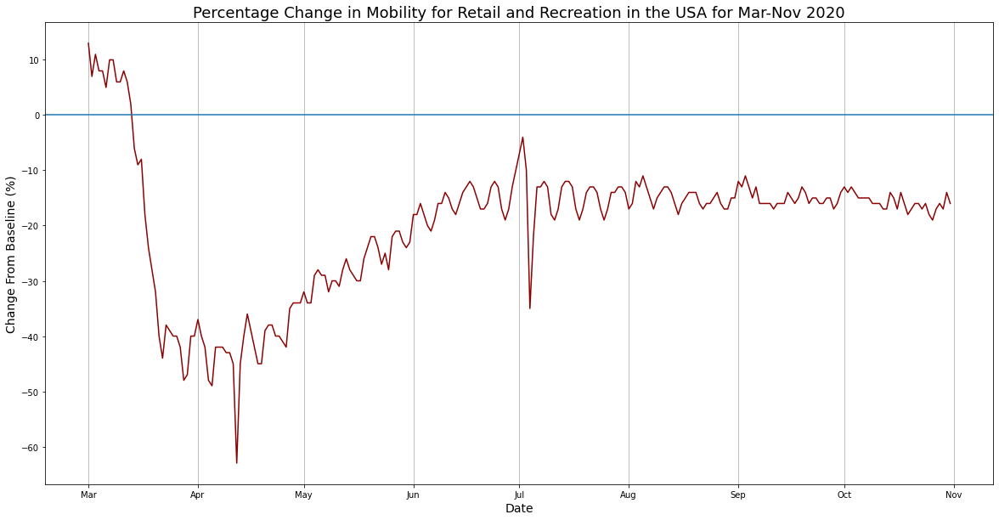

In [11]:
#create a time series for the retail and recreation column
a = plot_time_series(usa['retail_and_recreation_percent_change_from_baseline'], 'darkred', month, 'Retail and Recreation in the USA')

In [12]:
#compute summmary statistics for the series
usa['retail_and_recreation_percent_change_from_baseline'].describe()

count    245.000000
mean     -20.008163
std       12.381567
min      -63.000000
25%      -27.000000
50%      -16.000000
75%      -14.000000
max       13.000000
Name: retail_and_recreation_percent_change_from_baseline, dtype: float64

These summary statistics show that the average change from the baseline throughout the 245 days was almost exactly -20%, as well as that, the maximum change from the baseline was 13% while the minimum change from the baseline was -63%

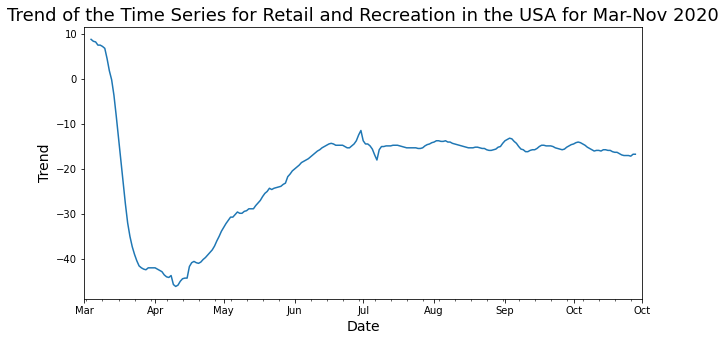

In [13]:
#display the trend of the retail and recreation column
display_trend(usa['retail_and_recreation_percent_change_from_baseline'], month, 'Retail and Recreation in the USA')

As the trend shows, there is a sharp descent during the month of March, there is a trough in the month of April but what is also interesting about the month of April is that it is the beginning of an upward trend in the time series. It also appears as though the month of July has two distinct turning points

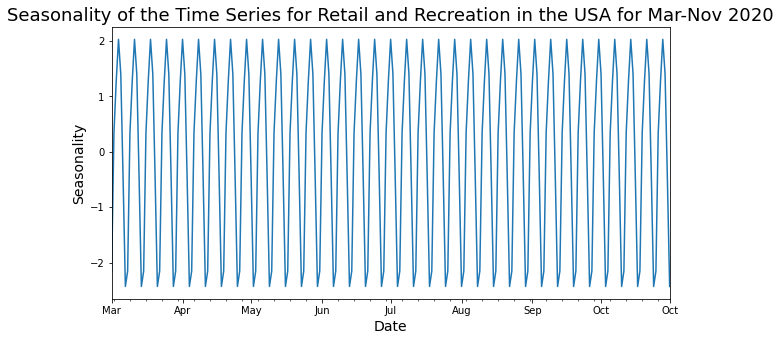

In [14]:
#display the seasonality of the retail and recreation column
display_seasonal(usa['retail_and_recreation_percent_change_from_baseline'], month, 'Retail and Recreation in the USA')

Based on the seasonality, the peaks and troughs for this time series appear to occur regularly throughout the 8 months. If you look closely, it seems as though the series peak around the start of each week and trough towards the end

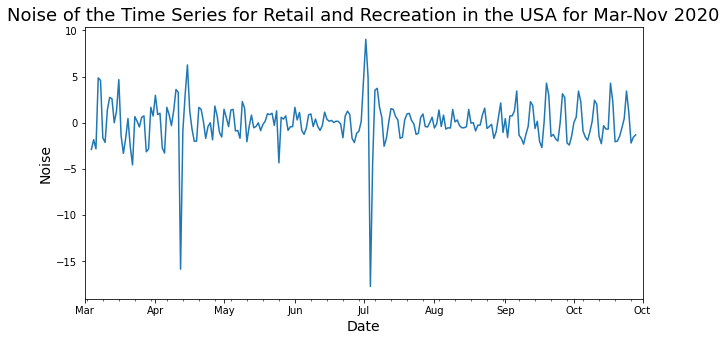

In [15]:
#display the noise of the retail and recreation column
display_noise(usa['retail_and_recreation_percent_change_from_baseline'], month, 'Retail and Recreation in the USA')

Looking at the noise for the time series, it appears as though there are three main outliers, one in April and two in July

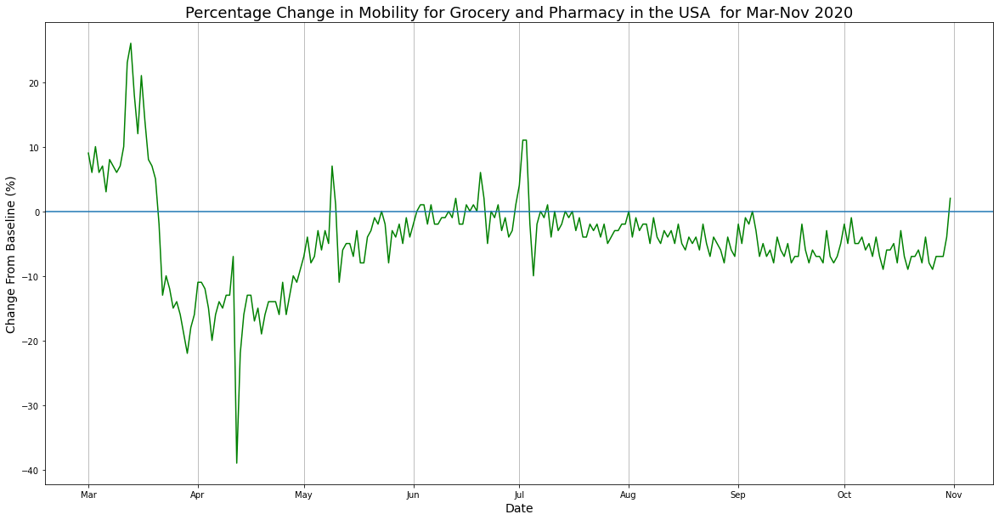

In [16]:
#create a time series for the grocery and pharmacy column
plot_time_series(usa['grocery_and_pharmacy_percent_change_from_baseline'], 'green', month, 'Grocery and Pharmacy in the USA ')

In [17]:
#compute summmary statistics for the series
usa['grocery_and_pharmacy_percent_change_from_baseline'].describe()

count    245.000000
mean      -4.248980
std        7.318798
min      -39.000000
25%       -7.000000
50%       -4.000000
75%       -1.000000
max       26.000000
Name: grocery_and_pharmacy_percent_change_from_baseline, dtype: float64

These summary statistics show that the average change from the baseline throughout the 245 days was approximately -4%, as well as that, the maximum change from the baseline was 26% while the minimum change from the baseline was -39%

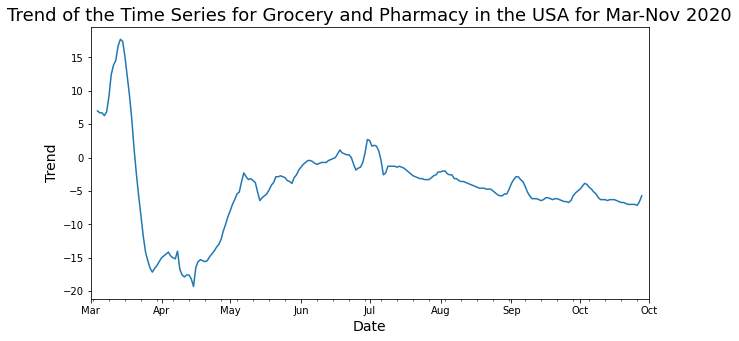

In [18]:
#display the trend of the grocery and pharmacy column
display_trend(usa['grocery_and_pharmacy_percent_change_from_baseline'], month, 'Grocery and Pharmacy in the USA')

As the trend shows, there is a sharp descent during the month of March, there is a trough in the month of April but what is also interesting about the month of April is that it is the beginning of an upward trend in the time series. 
The months of May, June and July are also interesting because there is a sharp descent in May and between the months of June and July, the series undergoes a series of significant ascents and descents.

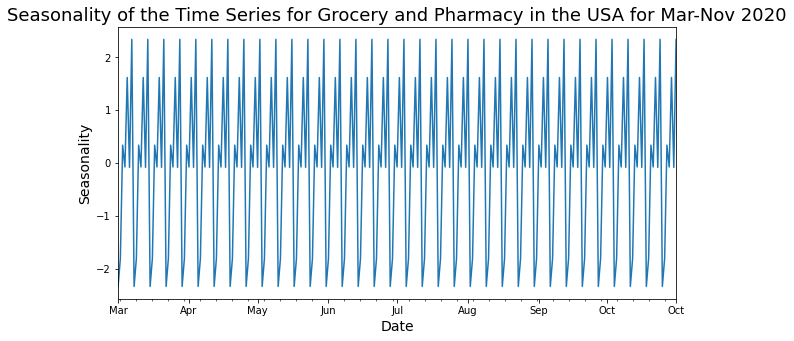

In [19]:
#display the seasonality of the grocery and pharmacy column
display_seasonal(usa['grocery_and_pharmacy_percent_change_from_baseline'], month, 'Grocery and Pharmacy in the USA')

Based on the seasonality, the peaks and troughs for this time series appear to occur regularly throughout the 8 months. If you look closely, it's hard to tell exactly when and where the series tends to peak and trough, so we'll examine this more closely in some of the months

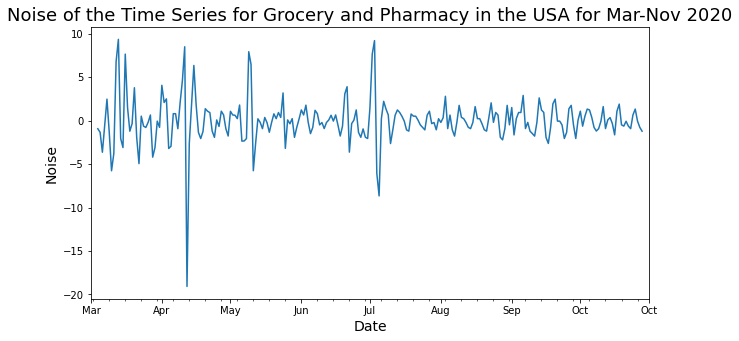

In [20]:
#display the noise of the grocery and pharmacy column
display_noise(usa['grocery_and_pharmacy_percent_change_from_baseline'], month, 'Grocery and Pharmacy in the USA')

Here, we can see that there are clear outliers in March, April, May and July

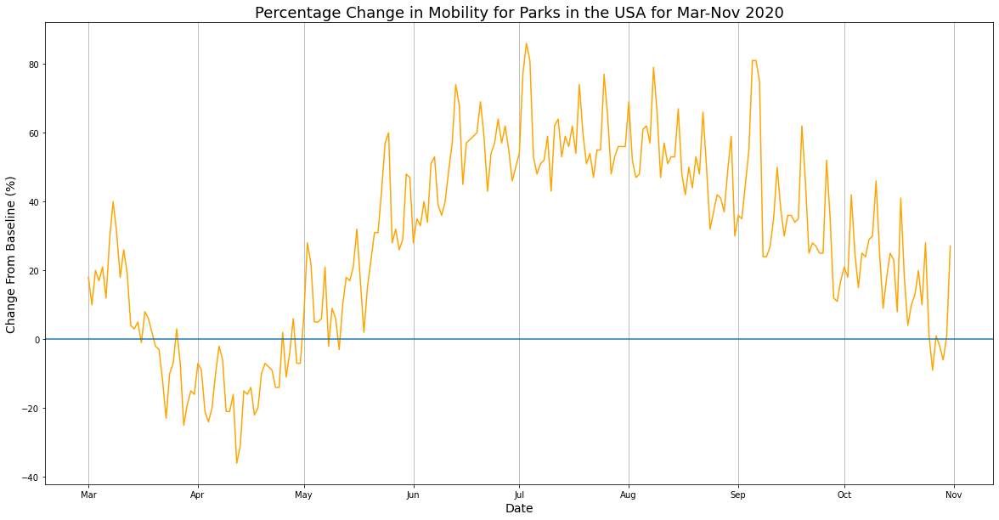

In [21]:
#create a time series for the parks column
plot_time_series(usa['parks_percent_change_from_baseline'], 'orange', month, 'Parks in the USA')

In [22]:
#compute summmary statistics for the series
usa['parks_percent_change_from_baseline'].describe()

count    245.000000
mean      28.902041
std       27.327825
min      -36.000000
25%        6.000000
50%       30.000000
75%       52.000000
max       86.000000
Name: parks_percent_change_from_baseline, dtype: float64

These summary statistics show that the average change from the baseline throughout the 245 days was approximately 29%, as well as that, the maximum change from the baseline was 86% while the minimum change from the baseline was -36%

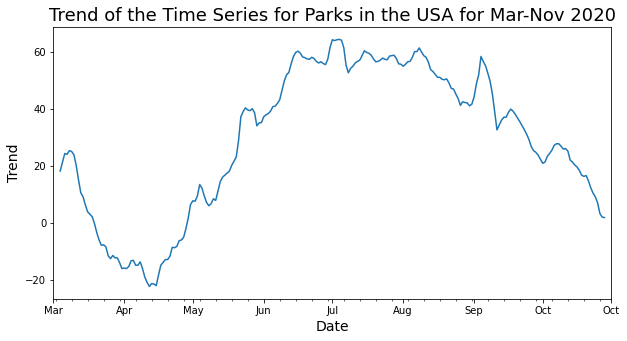

In [23]:
#display the trend of the parks column
display_trend(usa['parks_percent_change_from_baseline'], month, 'Parks in the USA')

As the trend shows, there is a sharp descent during the month of March, there is a trough in the month of April but what is also interesting about the month of April is that it is the beginning of an upward trend in the time series. 
However, it's hard to whether the beginning of the upward trend in April is related to COVID-19, or if it's simply because the following months are known for warmer, sunnier climates (summer). It's also worth noting that the trend peaks in early July. We can also see a steep upward trend during the month of September. 

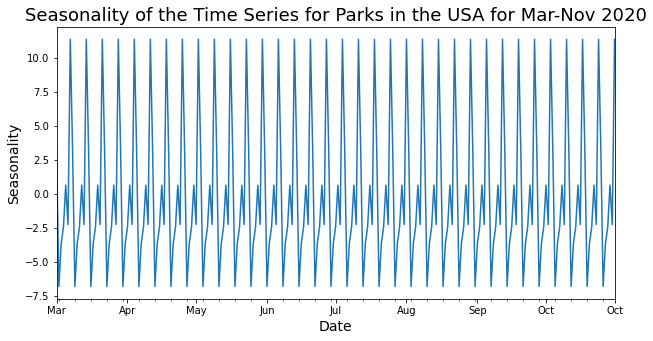

In [24]:
#display the seasonality of the parks column
display_seasonal(usa['parks_percent_change_from_baseline'], month, 'Parks in the USA')

From the seasonality, we can see that the series peaks and troughs regularly throughout the weeks, it seems as though the series troughs towards the end of each week and peeks during the middle of each week

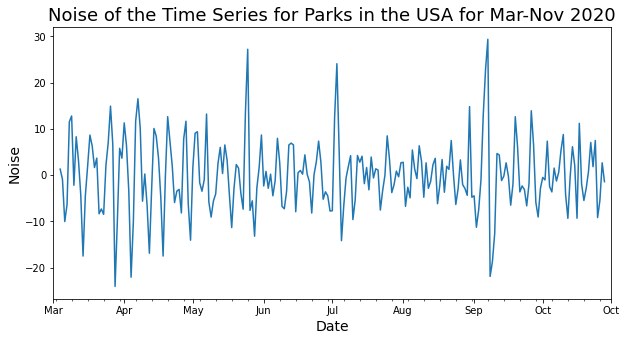

In [25]:
#display the noise of the parks column
display_noise(usa['parks_percent_change_from_baseline'], month, 'Parks in the USA')

Here, it's clear to see that there are significant outliers present in the months of March, April, May, July and September

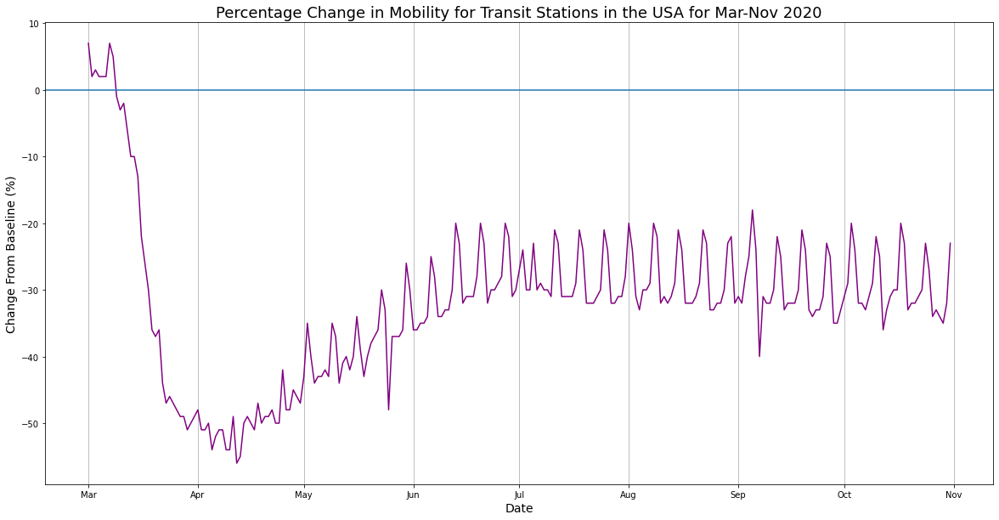

In [26]:
#create a time series for the transit stations column
plot_time_series(usa['transit_stations_percent_change_from_baseline'], 'purple', month, 'Transit Stations in the USA')

In [27]:
#compute summmary statistics for the series
usa['transit_stations_percent_change_from_baseline'].describe()

count    245.000000
mean     -31.881633
std       11.811978
min      -56.000000
25%      -37.000000
50%      -32.000000
75%      -27.000000
max        7.000000
Name: transit_stations_percent_change_from_baseline, dtype: float64

These summary statistics show that the average change from the baseline throughout the 245 days was approximately -32%, as well as that, the maximum change from the baseline was 7% while the minimum change from the baseline was -56%

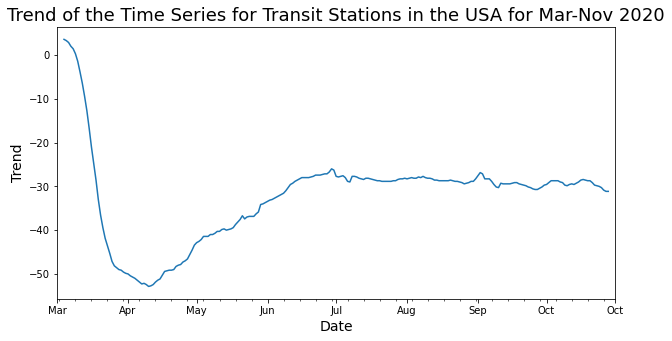

In [28]:
#display the trend of the parks column
display_trend(usa['transit_stations_percent_change_from_baseline'], month, 'Transit Stations in the USA')

As the trend shows, there is a sharp descent during the month of March, there is a trough in the month of April but what is also interesting about the month of April is that it is the beginning of an upward trend in the time series. However, after June, the trend does not undergo any significant ascents or descents

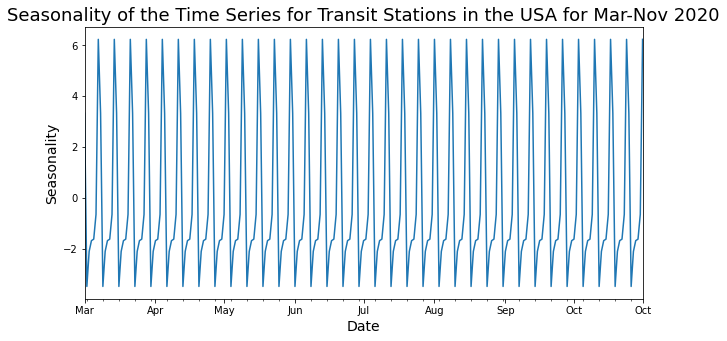

In [29]:
#display the seasonality of the parks column
display_seasonal(usa['transit_stations_percent_change_from_baseline'], month, 'Transit Stations in the USA')

From the seasonality, we can see that the series peaks and troughs regularly throughout the weeks, it seems as though the series troughs towards the end of each week and peeks during the middle of each week

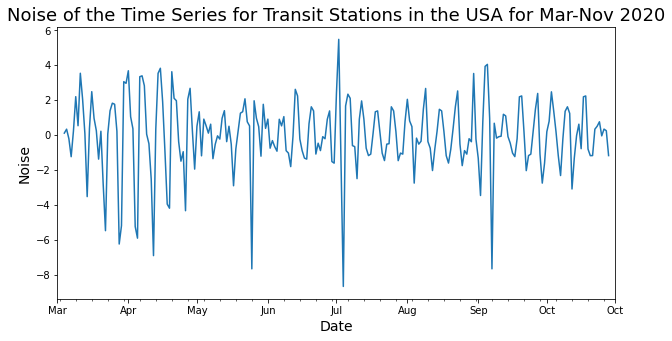

In [30]:
#display the noise of the parks column
display_noise(usa['transit_stations_percent_change_from_baseline'], month, 'Transit Stations in the USA')

Here we can see that there are significant outliers in the months of March, April, May, July and September

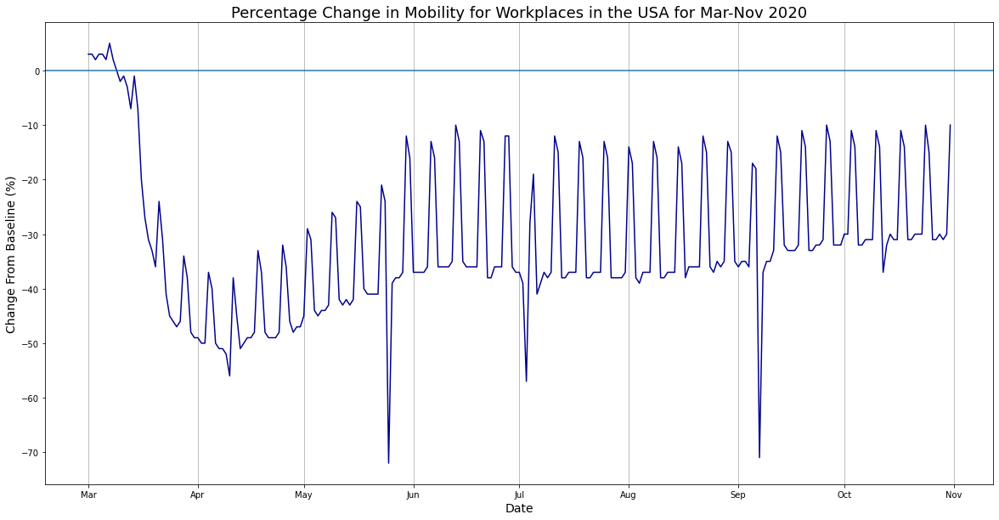

In [31]:
#create a time series for the workplaces column
plot_time_series(usa['workplaces_percent_change_from_baseline'], 'darkblue', month, 'Workplaces in the USA')

In [32]:
#compute summmary statistics for the series
usa['workplaces_percent_change_from_baseline'].describe()

count    245.000000
mean     -31.146939
std       13.932612
min      -72.000000
25%      -38.000000
50%      -36.000000
75%      -24.000000
max        5.000000
Name: workplaces_percent_change_from_baseline, dtype: float64

These summary statistics show that the average change from the baseline throughout the 245 days was approximately -31%, as well as that, the maximum change from the baseline was 5% while the minimum change from the baseline was -72%

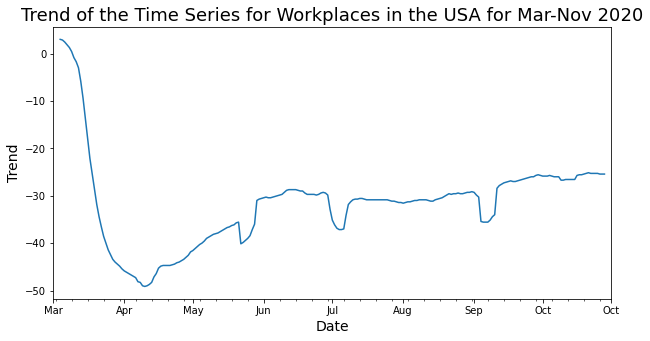

In [33]:
#display the trend of the parks column
display_trend(usa['workplaces_percent_change_from_baseline'], month, 'Workplaces in the USA')

As the trend shows, there is a sharp descent during the month of March, there is a trough in the month of April but what is also interesting about the month of April is that it is the beginning of an upward trend in the time series. The series also undergoes steep descents followed by steep ascents during the months of May, July and September

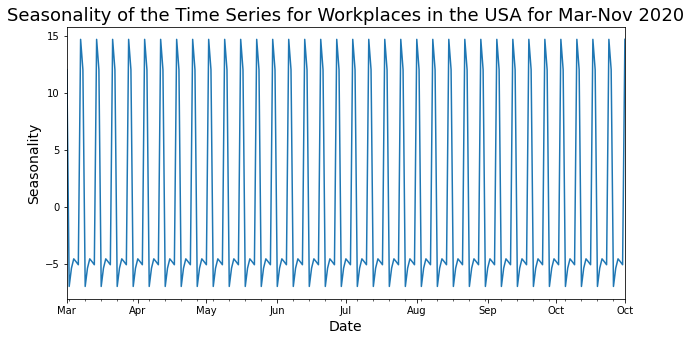

In [34]:
#display the seasonality of the parks column
display_seasonal(usa['workplaces_percent_change_from_baseline'], month, 'Workplaces in the USA')

From the seasonality, we can see that the series peaks and troughs regularly throughout the weeks, it seems as though the series troughs towards the end of each week and peeks during the middle of each week

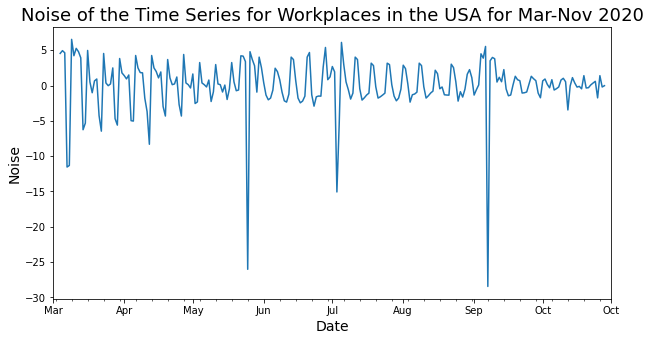

In [35]:
#display the noise of the parks column
display_noise(usa['workplaces_percent_change_from_baseline'], month, 'Workplaces in the USA')

Here, we can see that there are significant outliers present in the months of March, May, July and September. We can also see that all the outliers are minimum points of the months in which they are present

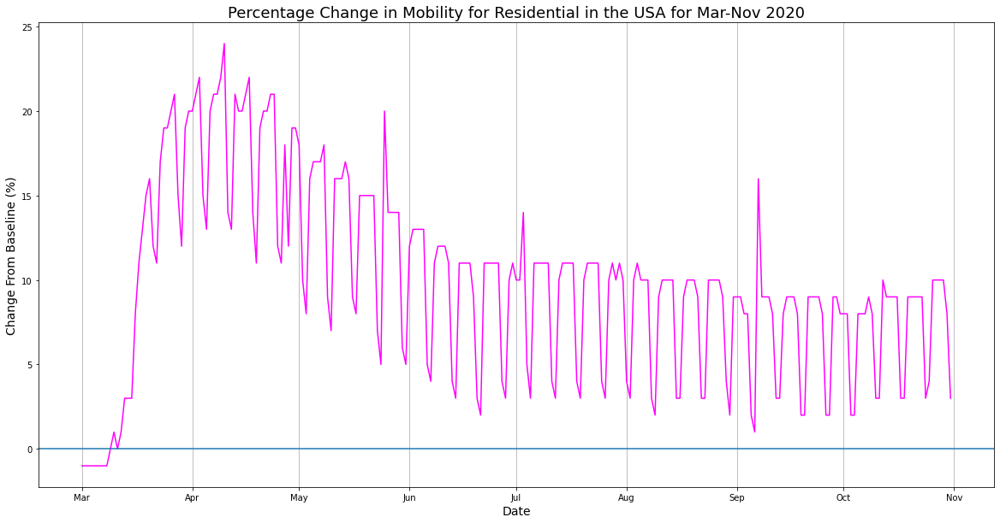

In [36]:
#create a time series for the residential column
plot_time_series(usa['residential_percent_change_from_baseline'], 'magenta', month, 'Residential in the USA')

In [37]:
#compute summmary statistics for the series
usa['residential_percent_change_from_baseline'].describe()

count    245.000000
mean       9.946939
std        5.688034
min       -1.000000
25%        7.000000
50%       10.000000
75%       13.000000
max       24.000000
Name: residential_percent_change_from_baseline, dtype: float64

These summary statistics show that the average change from the baseline throughout the 245 days was approximately 10%, as well as that, the maximum change from the baseline was 24% while the minimum change from the baseline was -1%

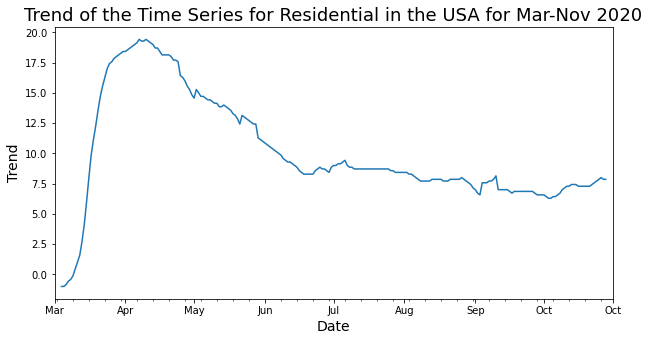

In [38]:
#display the trend of the parks column
display_trend(usa['residential_percent_change_from_baseline'], month, 'Residential in the USA')

In contrast to the rest of the trends for the USA, there is a sharp ascent during the month of March, there is a peak in the month of April but what is also interesting about the month of April is that it is the beginning of an downward trend in the time series. The series also undergoes steep descents followed by steep ascents in the months of April, May and September

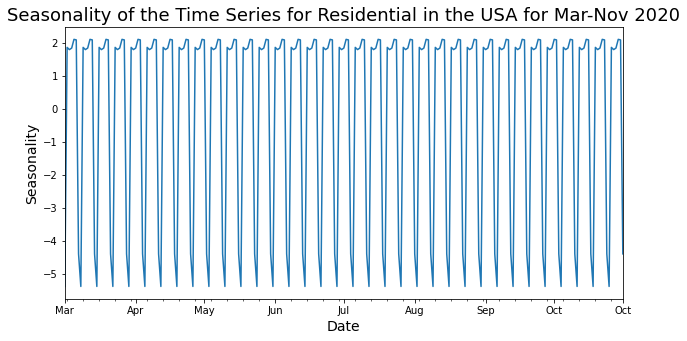

In [39]:
#display the seasonality of the parks column
display_seasonal(usa['residential_percent_change_from_baseline'], month, 'Residential in the USA')

From the seasonality, we can see that the series peaks and troughs regularly throughout the weeks, it seems as though the series troughs towards the end of each week and peeks during the middle of each week

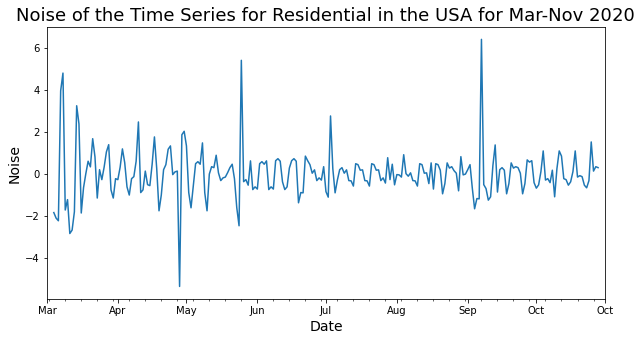

In [40]:
#display the noise of the parks column
display_noise(usa['residential_percent_change_from_baseline'], month, 'Residential in the USA')

Here, we can see that there are significant outliers present in the months of March, April, May, July and September

In [41]:
#create a function to plot time series of a country
def plot_time_series_country(country, date_form, title):
    #create a new Data Frame called 'df' that takes all the values of the country whose columns we're interested in
    df = pd.DataFrame(country, columns = ['retail_and_recreation_percent_change_from_baseline', 'grocery_and_pharmacy_percent_change_from_baseline',
                                 'parks_percent_change_from_baseline', 'transit_stations_percent_change_from_baseline',
                                 'workplaces_percent_change_from_baseline', 'residential_percent_change_from_baseline'])
    
    #rename the columns so that the labels are easier to read
    df.columns = ['retail_and_recreation', 'grocery_and_pharmacy', 'parks', 'transit_stations', 'workplaces', 'residential']
    
    #create a figure and plot space
    fig, ax = plt.subplots(figsize=plt.rcParams['figure.figsize'])
    #create the time series
    df.plot(ax = ax)
    
    #display either short month, 2-digit day, or short day names only on x-axis and display a grid to make inspection more clear
    ax.xaxis.set_major_formatter(date_form)
    ax.xaxis.grid()

    #label the x and y axes
    plt.xlabel('Date', fontsize = 14)
    plt.ylabel('Change From Baseline (%)', fontsize = 14)
    
    #add a title from the given title using formatted string literal syntax 
    if date_form == month:
        string = f"Percentage Change in Mobility for Various Facilities in {title} for Mar-Nov 2020"    
    else:
        string = f"Percentage Change in Mobility for Various Facilities in {title}"
        #ensure all days are displayed on x-axis when examining a time series for a given month
        ax.xaxis.set_major_locator(DayLocator())  
    plt.title(string, fontsize = 18)
    
    #add a baseline by plotting a horizontal line from y = 0 (default)
    plt.axhline()
    
    #display the finished time series
    plt.show()

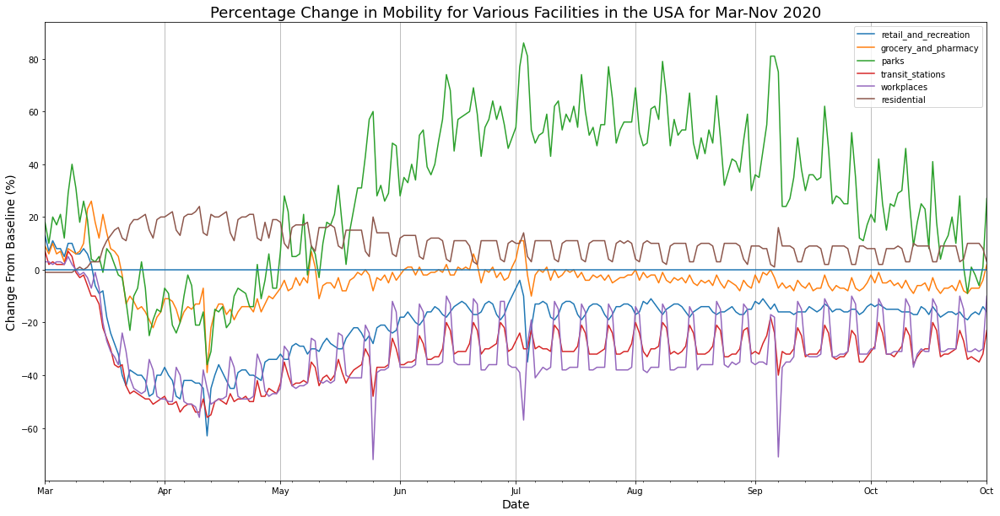

In [42]:
#Plot a time series for the USA
plot_time_series_country(usa, month, "the USA")

Having already decomposed all the columns for the USA, I found that the months of March, April, May, July and September were quite interesting because in a lot of the columns, these months either contained sharp turning points or significant outliers, so I think these months should be examined more closely

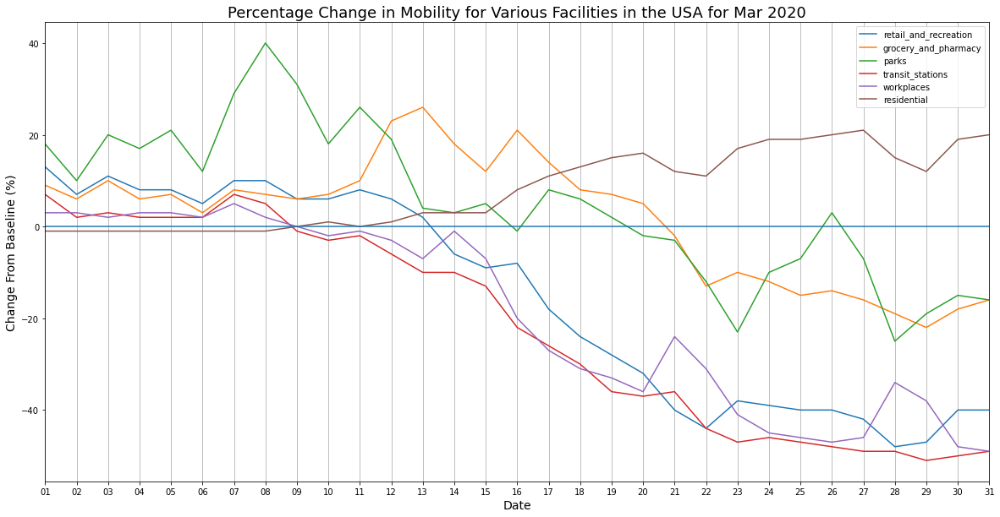

In [43]:
'''
As previously discussed, I thought it would be interesting to look at the month of March
more closely since this was the time at which the time series across all facilities began
to either descend or ascend rapidly
'''
plot_time_series_country(usa['2020-03'], day, "the USA for Mar 2020")

Looking at this time series for the month of March, it appears as though the days on which the downwards (or upwards in the case of residential facilities) trend in the USA began were on or close to March 11th, which is interesting because March 11th was the day on which the WHO announced COVID-19 as a pandemic. For facilities such as grocery and pharmacy, this might have been a few days later because March 11th may have been a day on which people decided to "panic buy" groceries and medication. March was also the month during which Donald Trump declared the Coronavirus to be a national emergency (March 13th) and he then, on March 16th issued guidelines that called for Americans to avoid social gatherings of more than 10 people.

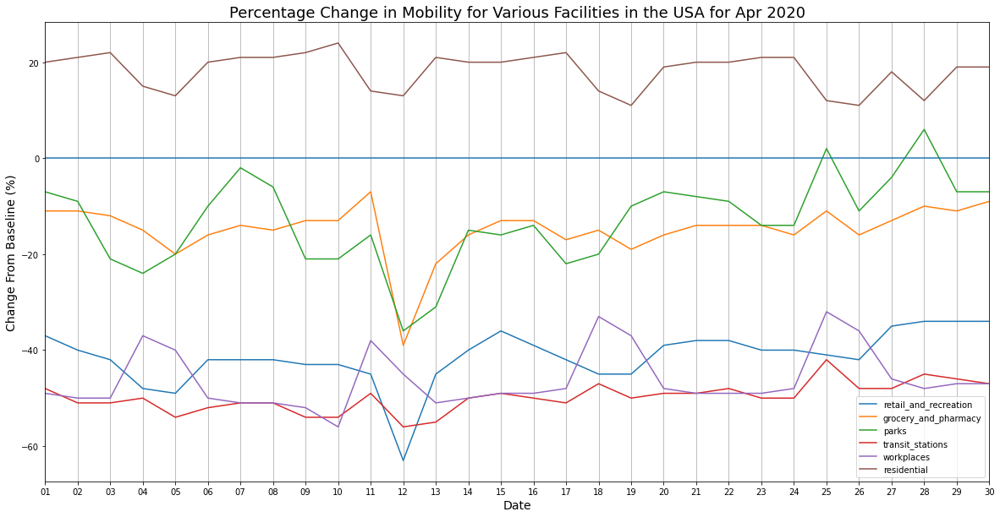

In [44]:
'''
As previously discussed, I thought it would be interesting to look at the month of April
more closely since this was the time at which the time series across all facilities began
to ascend after descending rapidly, or in the case of residential facilities, began
to descend after increasing rapidly. Across all columns, April was the month that contained
the trough (or peak in the case of residential facilities) for the entire 8 months
'''
plot_time_series_country(usa['2020-04'], day, "the USA for Apr 2020")

You can see here that the troughs for the columns (except residential) occurred at some time around the 12th of April. This could be linked to the fact that the 11th of April was the day on which the USA became the country with the most Coronavirus deaths. However, we can also see that after these troughs (peak in the case of residential), the trend for these begins to move upwards, which could be related to the fact that on April 16th, Donald Trump released guidelines on how people could return to public venues

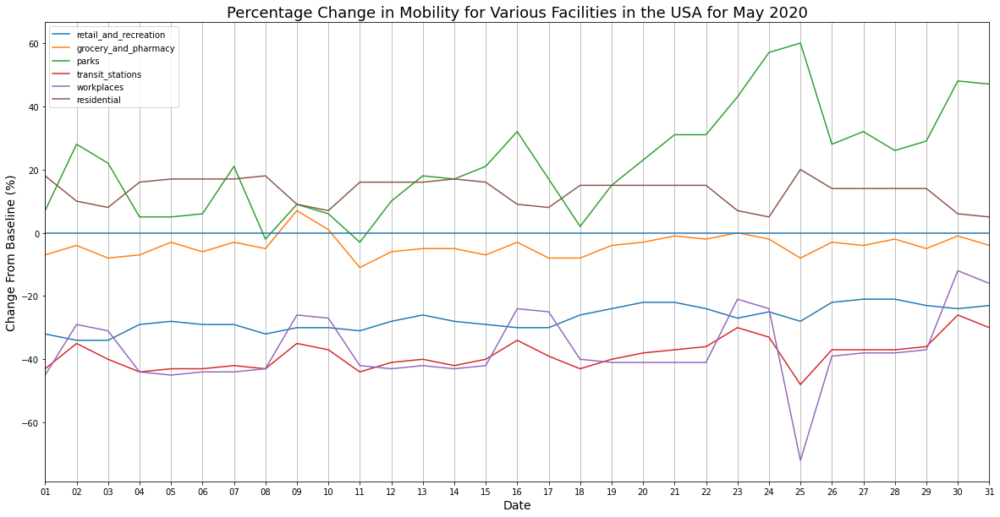

In [45]:
'''
As previously discussed, I thought it would be interesting to look at the month of May
more closely since this month contained outliers across most of the columns and because
there were also quite a lot of turning points in the month of May
'''
plot_time_series_country(usa['2020-05'], day, "the USA for May 2020")

We can see here that for a lot of the columns, there were either dramatic descents or ascents (residential and parks) on the 25th of May. This may have something to do with the fact that May 25th was Memorial Day in the USA. It was reported that Memorial Day weekend brought many Americans outside, which explains the spike in the time series for the parks column at this time. But it seems as though more people also desided to stay at home (which might explain the spike in the series for the residential column), which effected the rest of the columns negatively

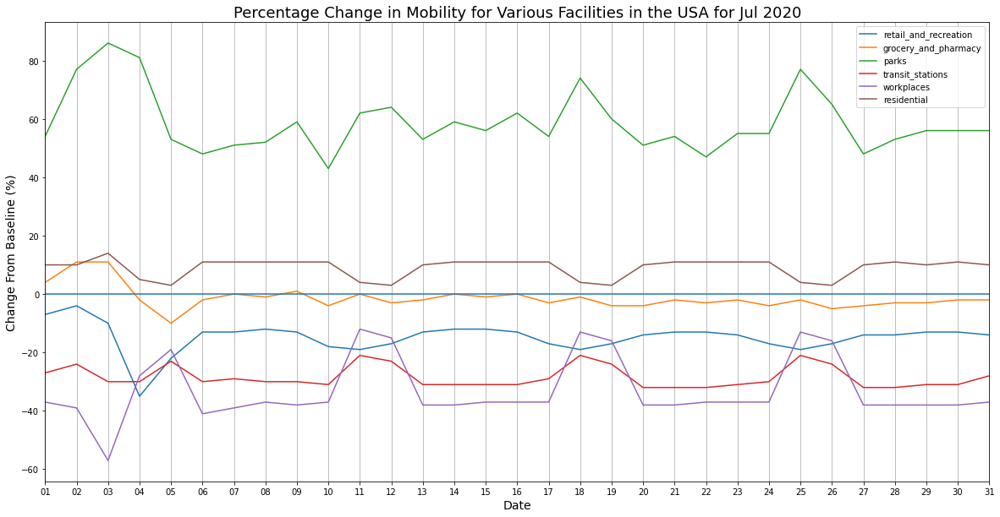

In [46]:
'''
As previously discussed, I thought it would be interesting to look at the month of July
more closely since this month contained outliers across most of the columns and because
there were also quite a lot of turning points in the month of July
'''
plot_time_series_country(usa['2020-07'], day, "the USA for Jul 2020")

As we can see, for a lot of the series, a sharp descent or ascent occurrs beginning around the 2nd of July. This may have something to do with the fact that on July 2nd, several states, including California, which is the most populated state in America, decided to postpone or reverse plans to reopen their economies because on that day, the USA recorded 50,000 new cases which was the largest one day spike since the pandemic's onset. Perhaps it is also worth nothing that Independence day was on July 4th, which may explain the sharp descent for the workplaces time series

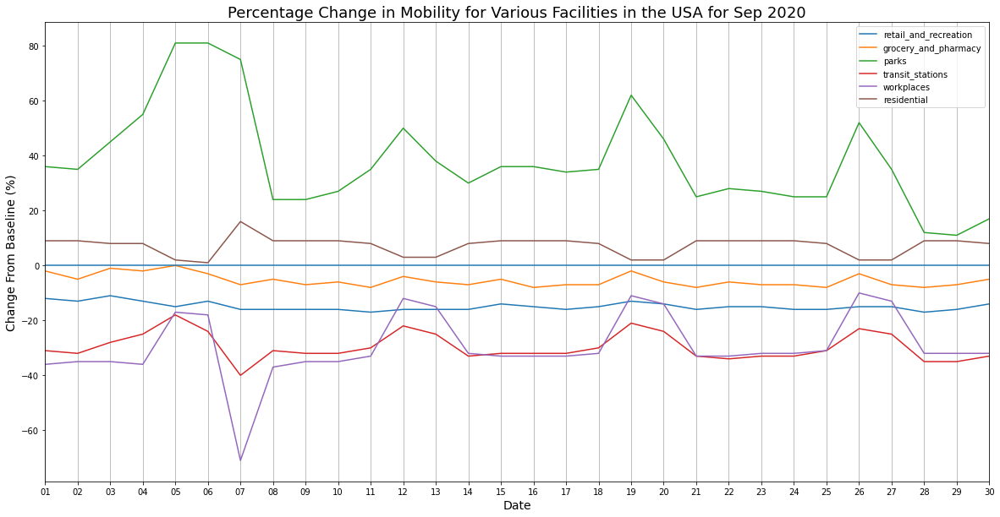

In [47]:
'''
As previously discussed, I thought it would be interesting to look at the month of September
more closely since this month contained outliers across most of the columns
'''
plot_time_series_country(usa['2020-09'], day, "the USA for Sep 2020")

As we can see, a number of columns undergo dramatic changes to their time series around the 7th of September, I looked into this and found out that September 7th is Labour Day in America, which is a public holiday in the USA. Which would explain the dramitic drops in the workplaces and transit stations columns and may explain why the values for parks and residential columns were much higher than usual on this day

In [48]:
#create a function to show the correlation between two columns
def correlate(x, y, label_x, label_y):
    #create a scatter plot for x versus y
    plt.scatter(x, y)
    
    '''create the lines of best fit using the equation of a line (y = mx + c) by finding the slope and the y-intercept using
    the numpy.polyfit() function'''
    m, c = np.polyfit(x, y, 1)
    
    #plot the lines of best fit in purple, so that it is distinguishable from the blue scatter dots
    plt.plot(x, m*x + c, color = "purple")
    
    plt.xlabel(label_x)
    plt.ylabel(label_y)
    #add a title from the given title using formatted string literal syntax
    string = f"Relationship between Percentage Change in Mobility of {label_x} and {label_y} for Mar-Nov 2020"
    plt.title(string, fontsize = 18)
    plt.show()
    
    #display the correlation coefficients
    print('The correlation coefficient is: ' +str(x.corr(y)))

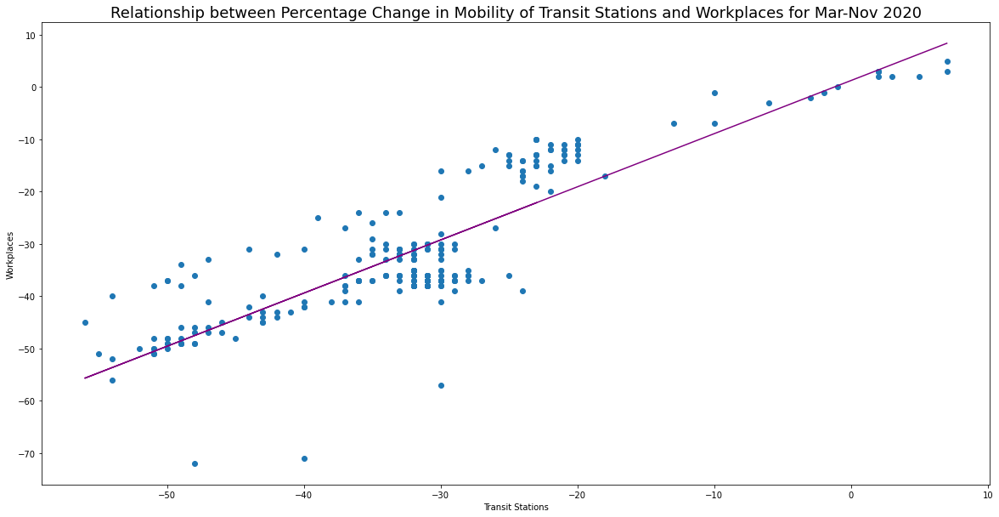

The correlation coefficient is: 0.8619059994354185


In [49]:
#Let's view the relationship between the percentage change in mobility for transit stations and workplaces in the USA
correlate(usa['transit_stations_percent_change_from_baseline'], usa['workplaces_percent_change_from_baseline'], 'Transit Stations', 'Workplaces')

Looking at this scatter plot, it shows that the relationship between the percentage change in mobility for transit stations and workplaces in the USA is very strong with a correlation coefficient of 0.86. This implies that as more people visit transit stations, more people go to work, which suggests that a lot of the American population uses public transport to commute to work

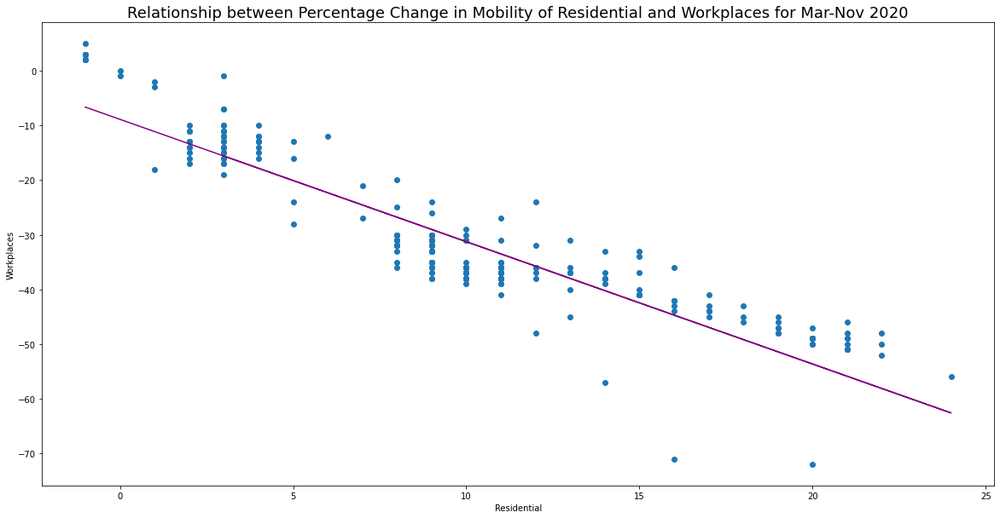

The correlation coefficient is: -0.913331731117553


In [50]:
#Now let's view the relationship between the percentage change in mobility for residential and workplaces in the USA
correlate(usa['residential_percent_change_from_baseline'], usa['workplaces_percent_change_from_baseline'], 'Residential', 'Workplaces')

Looking at this scatter plot, it shows that the relationship between the percentage change in mobility for residential areas and workplaces is very strong with a correlation coefficient of -0.91. This implies that as more people stay at home, less people go to work

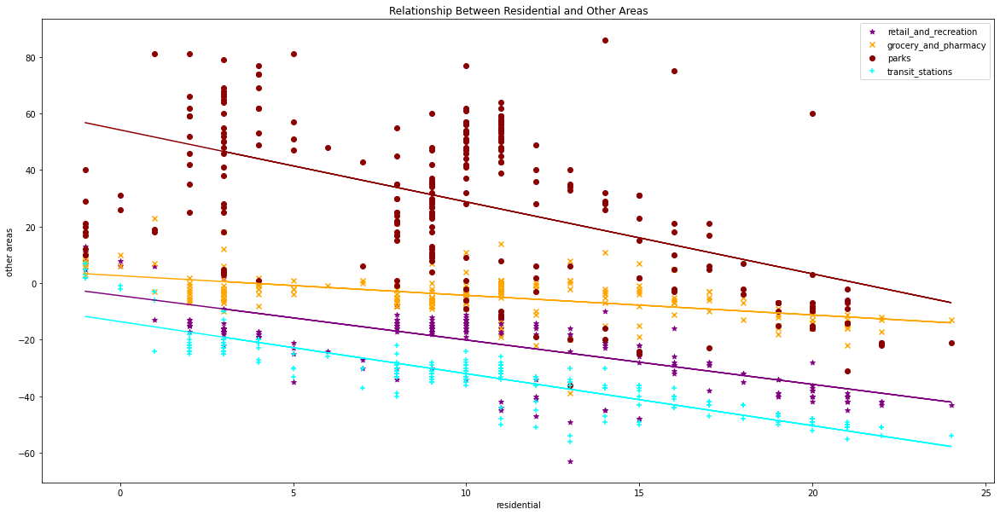

The correlation coefficient between the residential and retail and recreation is: -0.7200890425167751
The correlation coefficient between the residential and grocery and pharmacy is: -0.5392246583182168
The correlation coefficient between the residential and parks is: -0.5296985307397627
The correlation coefficient between the residential and transit stations is: -0.8855560400194206


In [51]:
#Now let's view the relationship between the percentage change in mobility for residential and the rest of the columns in the USA

#create the scatter plots for the various areas versus residential
plt.scatter(usa['residential_percent_change_from_baseline'], usa['retail_and_recreation_percent_change_from_baseline'], color = 'purple', marker = '*', label = 'retail_and_recreation')
plt.scatter(usa['residential_percent_change_from_baseline'], usa['grocery_and_pharmacy_percent_change_from_baseline'], color = 'orange', marker = 'x', label = 'grocery_and_pharmacy')
plt.scatter(usa['residential_percent_change_from_baseline'], usa['parks_percent_change_from_baseline'], color = 'darkred', marker = 'o', label = 'parks')
plt.scatter(usa['residential_percent_change_from_baseline'], usa['transit_stations_percent_change_from_baseline'], color = 'cyan', marker = '+', label = 'transit_stations')

#create the lines of best fit using the equation of a line (y = mx + c) by finding the slope and the y-intercept using
#the numpy.polyfit() function
m_ret_rec, c_ret_rec = np.polyfit(usa['residential_percent_change_from_baseline'], usa['retail_and_recreation_percent_change_from_baseline'], 1)
m_gro_pha, c_gro_pha = np.polyfit(usa['residential_percent_change_from_baseline'], usa['grocery_and_pharmacy_percent_change_from_baseline'], 1)
m_park, c_park = np.polyfit(usa['residential_percent_change_from_baseline'], usa['parks_percent_change_from_baseline'], 1)
m_trans, c_trans = np.polyfit(usa['residential_percent_change_from_baseline'], usa['transit_stations_percent_change_from_baseline'], 1)

#plot the lines of best fit, ensuring the lines are the same colour as the variables they represent for simplicity
plt.plot(usa['residential_percent_change_from_baseline'], m_ret_rec*usa['residential_percent_change_from_baseline'] + c_ret_rec, color = 'purple')
plt.plot(usa['residential_percent_change_from_baseline'], m_gro_pha*usa['residential_percent_change_from_baseline'] + c_gro_pha, color = 'orange')
plt.plot(usa['residential_percent_change_from_baseline'], m_park*usa['residential_percent_change_from_baseline'] + c_park, color = 'darkred')
plt.plot(usa['residential_percent_change_from_baseline'], m_trans*usa['residential_percent_change_from_baseline'] + c_trans, color = 'cyan')

plt.xlabel('residential')
plt.ylabel('other areas')

plt.legend()
plt.title('Relationship Between Residential and Other Areas')
plt.show()

#display the correlation coefficients
print('The correlation coefficient between the residential and retail and recreation is: ' +str(usa['residential_percent_change_from_baseline'].corr(usa['retail_and_recreation_percent_change_from_baseline'])))
print('The correlation coefficient between the residential and grocery and pharmacy is: ' +str(usa['residential_percent_change_from_baseline'].corr(usa['grocery_and_pharmacy_percent_change_from_baseline'])))
print('The correlation coefficient between the residential and parks is: ' +str(usa['residential_percent_change_from_baseline'].corr(usa['parks_percent_change_from_baseline'])))
print('The correlation coefficient between the residential and transit stations is: ' +str(usa['residential_percent_change_from_baseline'].corr(usa['transit_stations_percent_change_from_baseline'])))

Looking at these scatter plots, we can see that the relationship between changes in mobility percentage of residential areas and both retail and recreation and transit stations is quite strong, with correlation coefficients of -0.72 and -0.89 respectively. The relationship between changes in mobility percentage of residential areas and both grocery and pharmacy and parks is only moderate with correlation coefficients of -0.54 and -0.53 respectively. This implies that as more people stay at home, less people go to retail and recreation areas and transit stations. While the same is not necessarily true for residential areas and grocery and pharmacy areas and parks

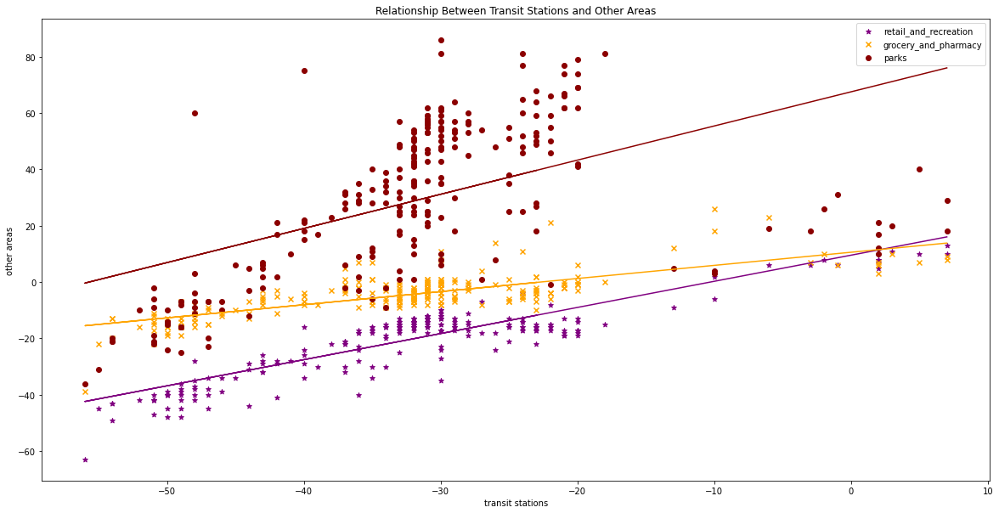

The correlation coefficient between the transit stations and retail and recreation is: 0.8847993392115585
The correlation coefficient between the transit stations and grocery and pharmacy is: 0.7515154206424558
The correlation coefficient between the transit stations and parks is: 0.5240314684074383


In [52]:
#Now let's view the relationship between the percentage change in mobility for transit stations and the rest of the columns in the USA

#create the scatter plots for the various areas versus residential
plt.scatter(usa['transit_stations_percent_change_from_baseline'], usa['retail_and_recreation_percent_change_from_baseline'], color = 'purple', marker = '*', label = 'retail_and_recreation')
plt.scatter(usa['transit_stations_percent_change_from_baseline'], usa['grocery_and_pharmacy_percent_change_from_baseline'], color = 'orange', marker = 'x', label = 'grocery_and_pharmacy')
plt.scatter(usa['transit_stations_percent_change_from_baseline'], usa['parks_percent_change_from_baseline'], color = 'darkred', marker = 'o', label = 'parks')

#create the lines of best fit using the equation of a line (y = mx + c) by finding the slope and the y-intercept using
#the numpy.polyfit() function
m_ret_rec, c_ret_rec = np.polyfit(usa['transit_stations_percent_change_from_baseline'], usa['retail_and_recreation_percent_change_from_baseline'], 1)
m_gro_pha, c_gro_pha = np.polyfit(usa['transit_stations_percent_change_from_baseline'], usa['grocery_and_pharmacy_percent_change_from_baseline'], 1)
m_park, c_park = np.polyfit(usa['transit_stations_percent_change_from_baseline'], usa['parks_percent_change_from_baseline'], 1)

#plot the lines of best fit, ensuring the lines are the same colour as the variables they represent for simplicity
plt.plot(usa['transit_stations_percent_change_from_baseline'], m_ret_rec*usa['transit_stations_percent_change_from_baseline'] + c_ret_rec, color = 'purple')
plt.plot(usa['transit_stations_percent_change_from_baseline'], m_gro_pha*usa['transit_stations_percent_change_from_baseline'] + c_gro_pha, color = 'orange')
plt.plot(usa['transit_stations_percent_change_from_baseline'], m_park*usa['transit_stations_percent_change_from_baseline'] + c_park, color = 'darkred')

plt.xlabel('transit stations')
plt.ylabel('other areas')

plt.legend()
plt.title('Relationship Between Transit Stations and Other Areas')
plt.show()

#display the correlation coefficients
print('The correlation coefficient between the transit stations and retail and recreation is: ' +str(usa['transit_stations_percent_change_from_baseline'].corr(usa['retail_and_recreation_percent_change_from_baseline'])))
print('The correlation coefficient between the transit stations and grocery and pharmacy is: ' +str(usa['transit_stations_percent_change_from_baseline'].corr(usa['grocery_and_pharmacy_percent_change_from_baseline'])))
print('The correlation coefficient between the transit stations and parks is: ' +str(usa['transit_stations_percent_change_from_baseline'].corr(usa['parks_percent_change_from_baseline'])))

Looking at these scatter plots, we can see that the relationship between changes in mobility percentage of transit stations and both retail and recreation and grocery and pharmacy is quite strong, with correlation coefficients of 0.88 and 0.75 respectively. The relationship between changes in mobility percentage of transit stations and parks is only moderate with correlation coefficients of 0.52. This could mean that many people may use public transport to go to retail and recreation areas as well as grocery and pharmacy areas. While the same is not necessarily true for parks

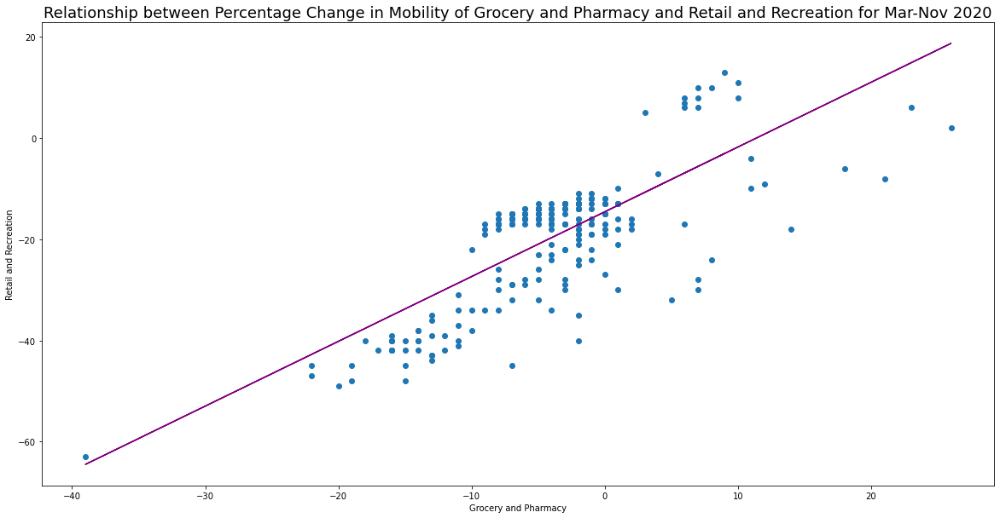

The correlation coefficient is: 0.7570270104245491


In [53]:
#Now let's view the relationship between the percentage change in mobility for grocery and pharmacy and retail and recreation areas in the USA
correlate(usa['grocery_and_pharmacy_percent_change_from_baseline'], usa['retail_and_recreation_percent_change_from_baseline'], 'Grocery and Pharmacy', 'Retail and Recreation')

Looking at this scatter plot, the relationship between the two columns is strong with a correlation coefficient of 0.76. This could imply that when people go to grocery shops and/or pharmacies, they may also go to retail and recreation areas

In [54]:
new_zealand = pd.read_csv('new_zealand.csv', index_col = 'date', parse_dates = True)
new_zealand.head()

,id,country,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
date,,,,,,,,
2020-03-01,1767703,New Zealand,1.0,4.0,-1.0,8.0,1.0,1.0
2020-03-02,1767704,New Zealand,-4.0,-1.0,-10.0,16.0,34.0,-2.0
2020-03-03,1767705,New Zealand,-4.0,0.0,-6.0,8.0,17.0,-1.0
2020-03-04,1767706,New Zealand,-2.0,0.0,-17.0,9.0,16.0,-1.0
2020-03-05,1767707,New Zealand,0.0,1.0,-15.0,10.0,20.0,-1.0


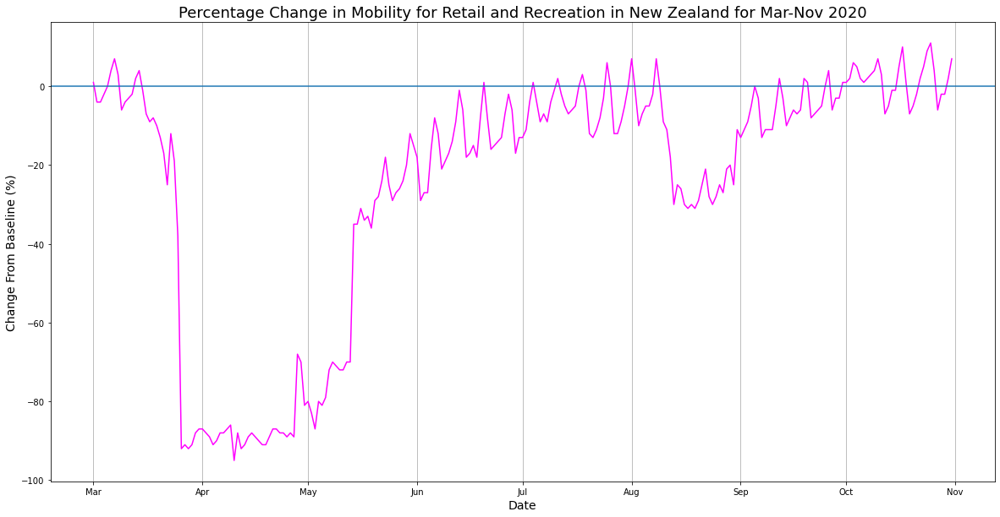

In [55]:
#create a time series for the retail and recreation column
plot_time_series(new_zealand['retail_and_recreation_percent_change_from_baseline'], 'magenta', month, 'Retail and Recreation in New Zealand')

In [56]:
#compute summmary statistics for the series
new_zealand['retail_and_recreation_percent_change_from_baseline'].describe()

count    245.000000
mean     -24.563265
std       31.930654
min      -95.000000
25%      -30.000000
50%      -11.000000
75%       -3.000000
max       11.000000
Name: retail_and_recreation_percent_change_from_baseline, dtype: float64

These summary statistics show that the average change from the baseline throughout the 245 days was approximatley -24.56%, as well as that, the maximum change from the baseline was 11% while the minimum change from the baseline was -95%

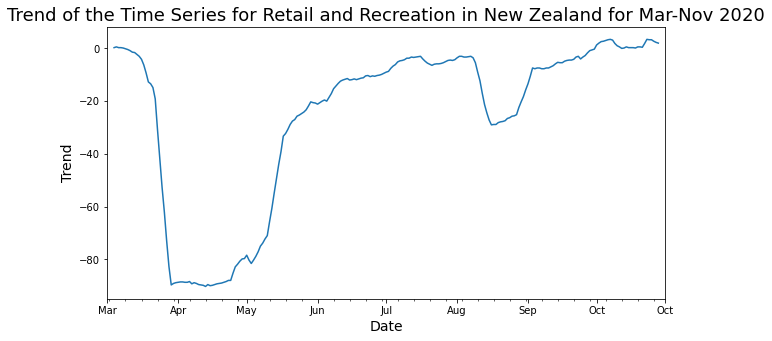

In [57]:
#display the trend of the retail and recreation column
display_trend(new_zealand['retail_and_recreation_percent_change_from_baseline'], month, 'Retail and Recreation in New Zealand')

Here, we can see that the series takes a steep downward trend during the month of March until it reaches the lowest point for that month and the overall trend doesn't change again until the end of April when the series follows a steep upward trend and continues to climb until August, which is when we can see that the series takes a steep downward trend during the month of August before flatlineing and following a steep upward trend later that month

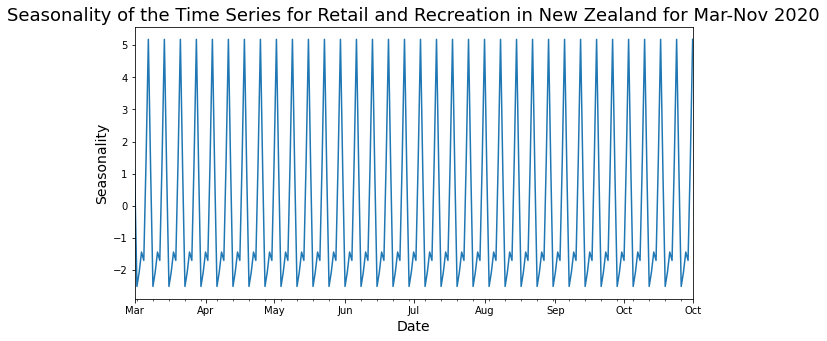

In [58]:
#display the seasonality of the retail and recreation column
display_seasonal(new_zealand['retail_and_recreation_percent_change_from_baseline'], month, 'Retail and Recreation in New Zealand')

Looking at the overall seasonality for this column, it appears as though the series peaks and troughs throughout the months periodically. It seems to be that the series is at its lowest during the end of the week and it its highest point during the middle of the week

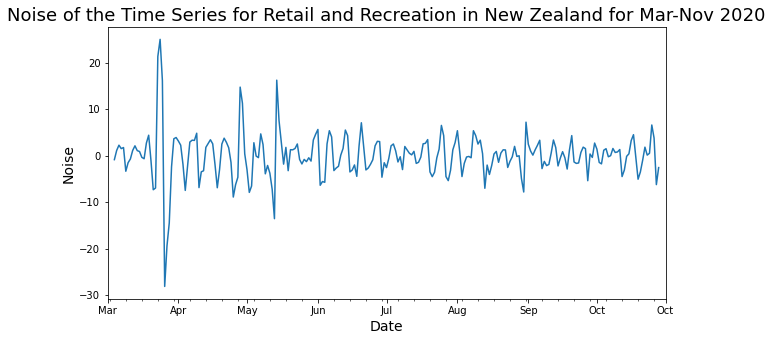

In [59]:
#display the noise of the retail and recreation column
display_noise(new_zealand['retail_and_recreation_percent_change_from_baseline'], month, 'Retail and Recreation in New Zealand')

Looking at the overall noise for this column, we can clearly see significant outliers in March, April and May

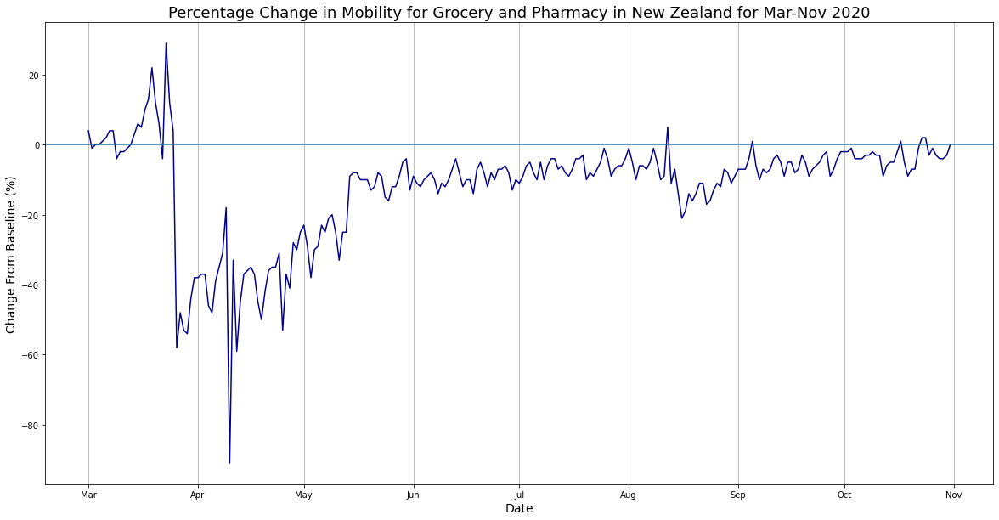

In [60]:
#create a time series for the grocery and pharmacy column
plot_time_series(new_zealand['grocery_and_pharmacy_percent_change_from_baseline'], 'darkblue', month, 'Grocery and Pharmacy in New Zealand')

In [61]:
#compute summmary statistics for the series
new_zealand['grocery_and_pharmacy_percent_change_from_baseline'].describe()

count    245.000000
mean     -12.028571
std       14.981792
min      -91.000000
25%      -13.000000
50%       -8.000000
75%       -4.000000
max       29.000000
Name: grocery_and_pharmacy_percent_change_from_baseline, dtype: float64

These summary statistics show that the average change from the baseline throughout the 245 days was almost exactly -12%, as well as that, the maximum change from the baseline was 29% while the minimum change from the baseline was -91%

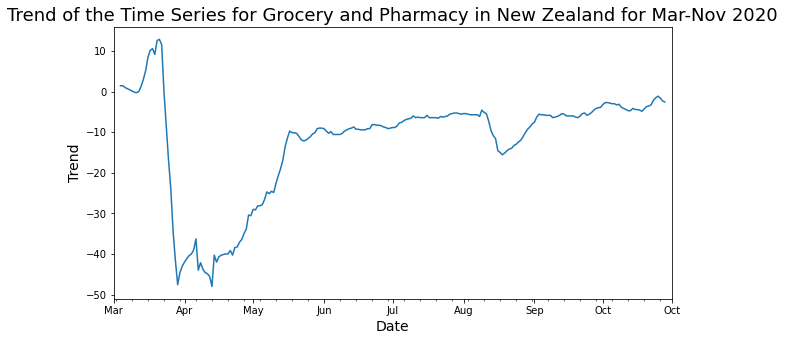

In [62]:
#display the trend of the grocery and pharmacy column
display_trend(new_zealand['grocery_and_pharmacy_percent_change_from_baseline'], month, 'Grocery and Pharmacy in New Zealand')

Here we can see that the series undergoes a sharp ascent before taking an ever sharper descent towards the end of March, the series follows a brief dramatic upward trend during the end of March until the start of april where the series once again takes a steep descent, however, this is followed by a sharp ascent and then a more gradual ascent until the middle of May. We can also see a significant turning point durint the month of August

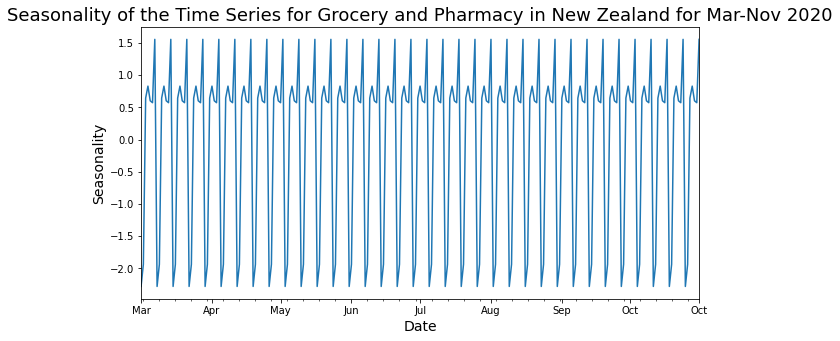

In [63]:
#display the seasonality of the grocery and pharmacy column
display_seasonal(new_zealand['grocery_and_pharmacy_percent_change_from_baseline'], month, 'Grocery and Pharmacy in New Zealand')

Looking at the noise for this column, it appears as though the series peak and trough regularly throughout the months, it seems as though the series troughs during the weekend and peaks during the week throughout each month

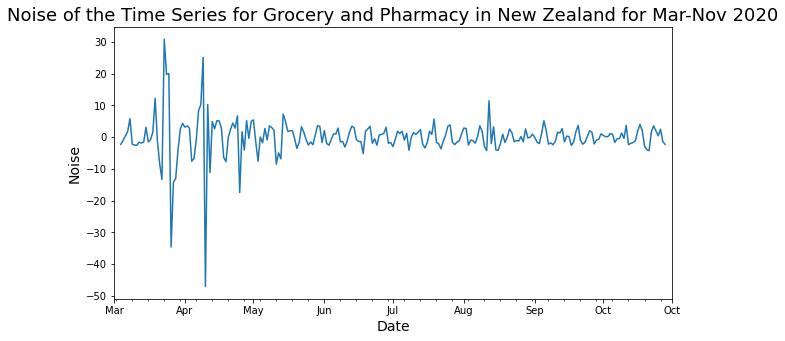

In [64]:
#display the noise of the grocery and pharmacy column
display_noise(new_zealand['grocery_and_pharmacy_percent_change_from_baseline'], month, 'Grocery and Pharmacy in New Zealand')

Looking at the noise for this column, it's clear to see that major outliers are present during the months of March and April

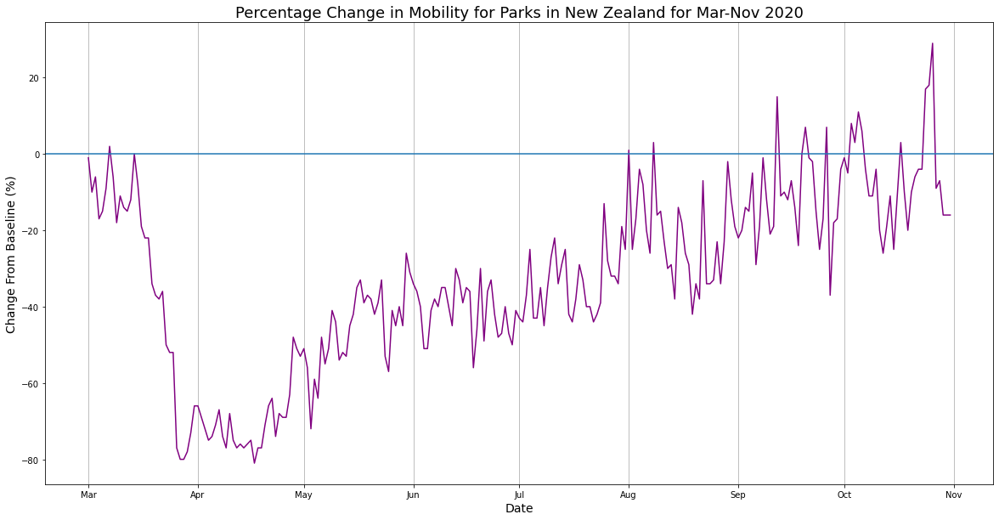

In [65]:
#create a time series for the parks column
plot_time_series(new_zealand['parks_percent_change_from_baseline'], 'purple', month, 'Parks in New Zealand')

In [66]:
#compute summmary statistics for the series
new_zealand['parks_percent_change_from_baseline'].describe()

count    245.000000
mean     -32.506122
std       23.230248
min      -81.000000
25%      -45.000000
50%      -33.000000
75%      -15.000000
max       29.000000
Name: parks_percent_change_from_baseline, dtype: float64

These summary statistics show that the average change from the baseline throughout the 245 days was approximately -32.5%, as well as that, the maximum change from the baseline was 29% while the minimum change from the baseline was -81%

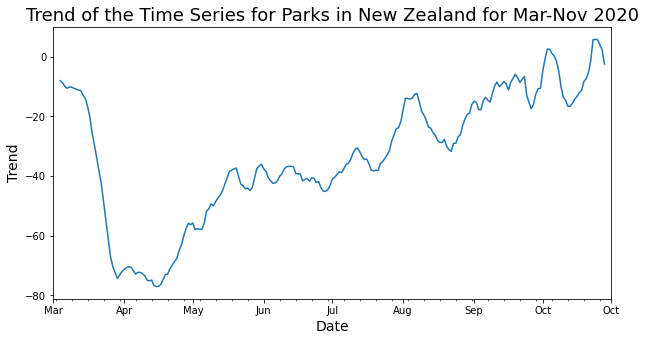

In [67]:
#display the trend of the parks column
display_trend(new_zealand['parks_percent_change_from_baseline'], month, 'Parks in New Zealand')

The trend shows that the series takes a steep descent during the month of March before ascending briefly and following a more gradual downward trend during the month of April. However, after this downward trend then follows a gradual upward trend before experiencing significant turning points in the months of August, September and October

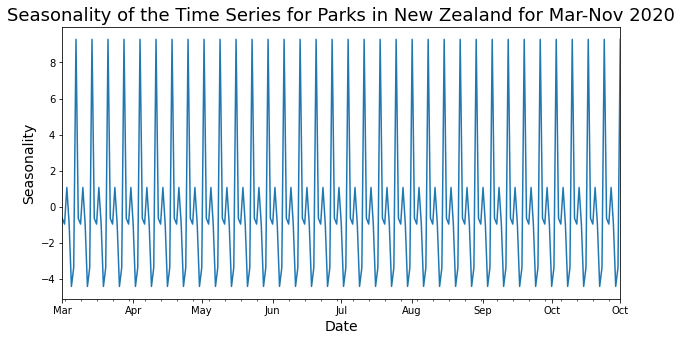

In [68]:
#display the seasonality of the parks column
display_seasonal(new_zealand['parks_percent_change_from_baseline'], month, 'Parks in New Zealand')

Looking at the noise, the series appears to peak and trough periodically throughout the months. It seems as though the series in general, peaks towards the end of the week and troughs during the start of the week throughout each month

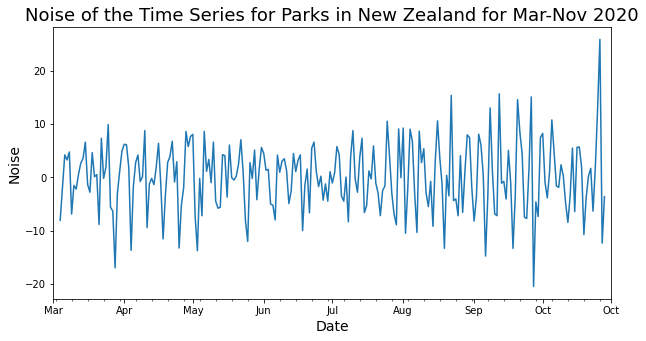

In [69]:
#display the noise of the parks column
display_noise(new_zealand['parks_percent_change_from_baseline'], month, 'Parks in New Zealand')

Looking at the noise, there seem to be a lot of outliers present, particularly in March, April, May, August, September and October

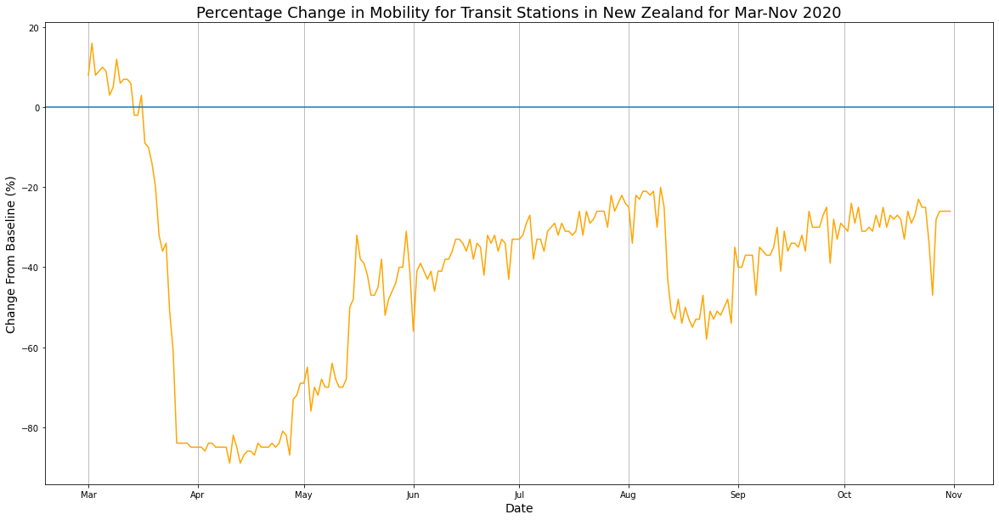

In [70]:
#create a time series for the transit stations column
plot_time_series(new_zealand['transit_stations_percent_change_from_baseline'], 'orange', month, 'Transit Stations in New Zealand')

In [71]:
#compute summmary statistics for the series
new_zealand['transit_stations_percent_change_from_baseline'].describe()

count    245.000000
mean     -41.081633
std       23.702594
min      -89.000000
25%      -52.000000
50%      -35.000000
75%      -28.000000
max       16.000000
Name: transit_stations_percent_change_from_baseline, dtype: float64

These summary statistics show that the average change from the baseline throughout the 245 days was almost exactly -41%, as well as that, the maximum change from the baseline was 16% while the minimum change from the baseline was -89%

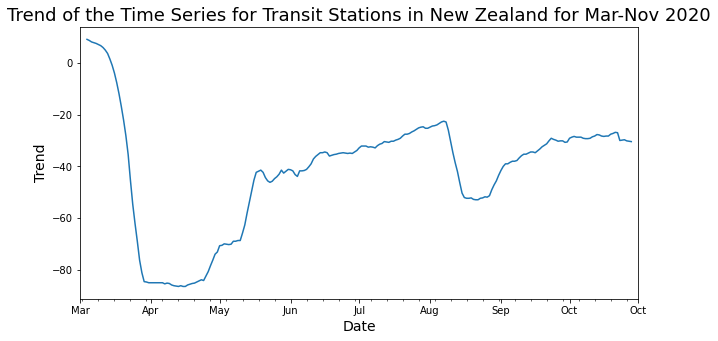

In [72]:
#display the trend of the transit stations column
display_trend(new_zealand['transit_stations_percent_change_from_baseline'], month, 'Transit Stations in New Zealand')

Here we can see that the series follows a downward trend right from the beginning of March until the end of March before almost flatlining throughout April. Then towards the end of April, the series follows a steep upward trend until the middle of May, before following a more gradual upward trend until August where it experiences a dramatic downward trend followed by a steep upward trend later that month

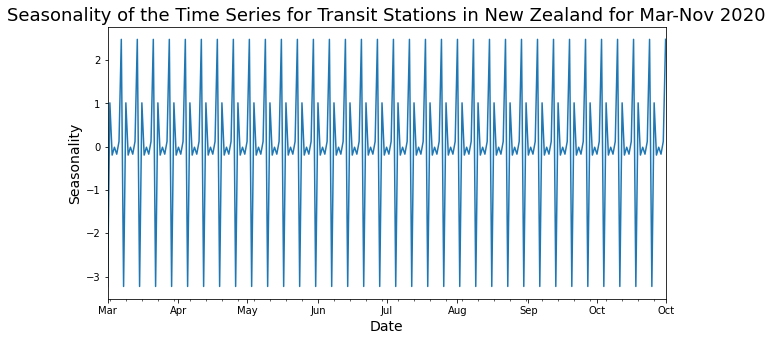

In [73]:
#display the seasonality of the transit stations column
display_seasonal(new_zealand['transit_stations_percent_change_from_baseline'], month, 'Transit Stations in New Zealand')

Looking at the noise, it appears as though the series peaks and troughs periodically throughout each month. It seems as though the series troughs during the end of the week and peaks during the middle of the week

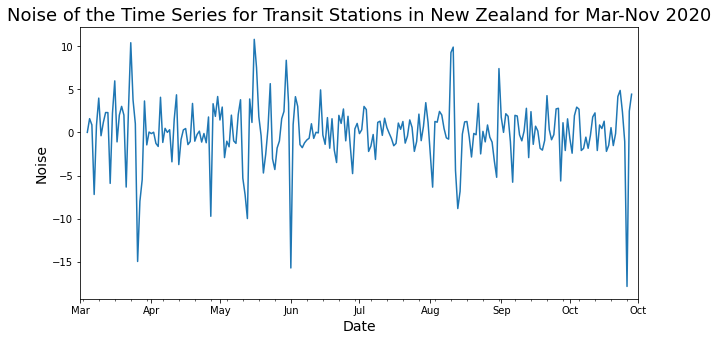

In [74]:
#display the noise of the transit stations column
display_noise(new_zealand['transit_stations_percent_change_from_baseline'], month, 'Transit Stations in New Zealand')

Looking at the noise, there are clear outliers present in the months of March, April, May, June, August and October

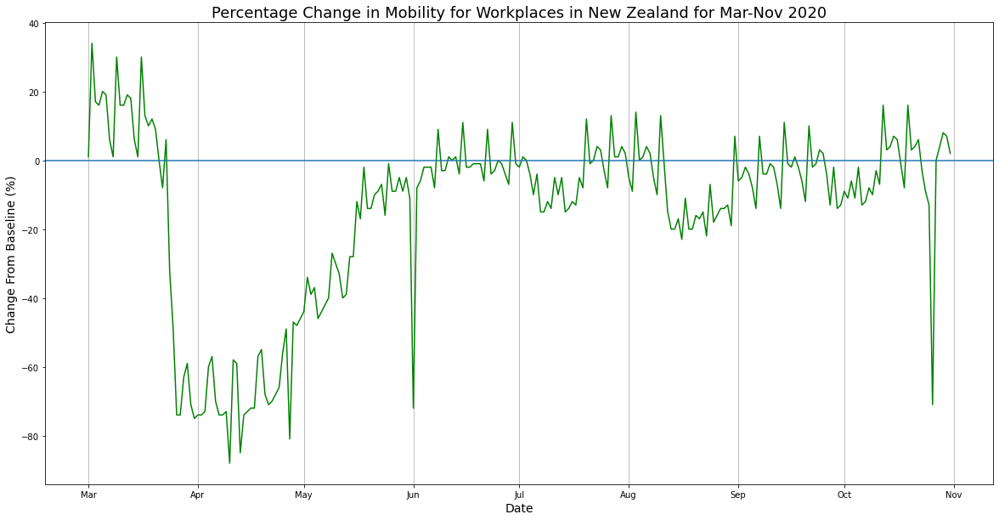

In [75]:
#create a time series for the workplaces column
plot_time_series(new_zealand['workplaces_percent_change_from_baseline'], 'green', month, 'Workplaces in New Zealand')

In [76]:
#compute summmary statistics for the series
new_zealand['workplaces_percent_change_from_baseline'].describe()

count    245.000000
mean     -14.934694
std       26.051412
min      -88.000000
25%      -19.000000
50%       -7.000000
75%        0.000000
max       34.000000
Name: workplaces_percent_change_from_baseline, dtype: float64

These summary statistics show that the average change from the baseline throughout the 245 days was approximately -15%, as well as that, the maximum change from the baseline was 34% while the minimum change from the baseline was -88%

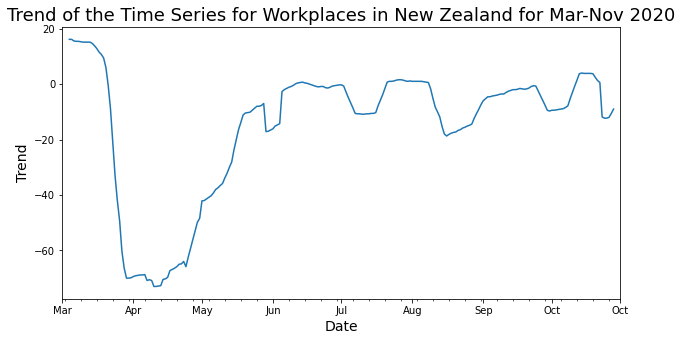

In [77]:
#display the trend of the workplaces column
display_trend(new_zealand['workplaces_percent_change_from_baseline'], month, 'Workplaces in New Zealand')

Looking at the trend of the series, we can see that the series undergoes a steep descent during the month of March and takes another more brief descent during April which is then followed by gradually ascending until May. During the months of May, July, August, September and October, the series undergoes some significant downward trends before undergoing a significant upward trend just a few days later

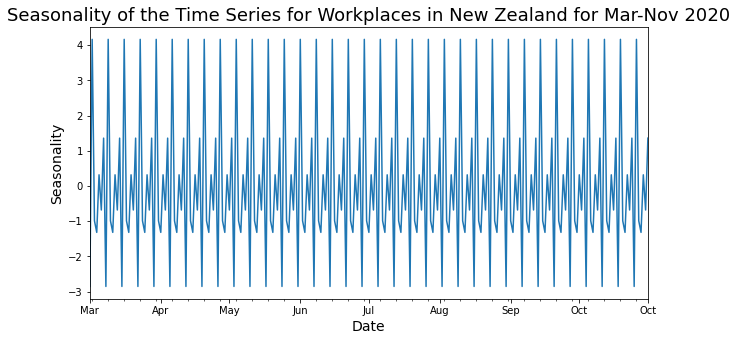

In [78]:
#display the seasonality of the workplaces column
display_seasonal(new_zealand['workplaces_percent_change_from_baseline'], month, 'Workplaces in New Zealand')

Looking at the noise, it appears as though the series peaks and troughs periodically throughout the months. It seems as though the series peaks during the start of each week and troughs during the end of each week

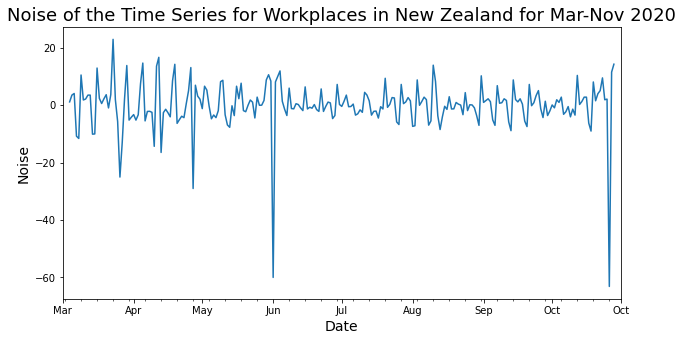

In [79]:
#display the noise of the workplaces column
display_noise(new_zealand['workplaces_percent_change_from_baseline'], month, 'Workplaces in New Zealand')

Here, we can see that there are significant outliers present during the months of March, April, June and October

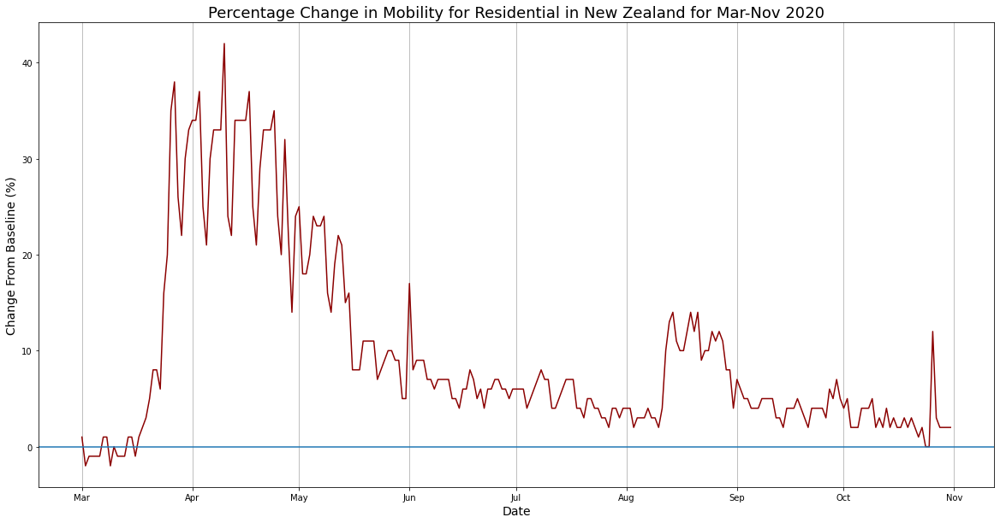

In [80]:
#create a time series for the residential column
plot_time_series(new_zealand['residential_percent_change_from_baseline'], 'darkred', month, 'Residential in New Zealand')

In [81]:
#compute summmary statistics for the series
new_zealand['residential_percent_change_from_baseline'].describe()

count    245.000000
mean       9.787755
std        9.902178
min       -2.000000
25%        4.000000
50%        6.000000
75%       12.000000
max       42.000000
Name: residential_percent_change_from_baseline, dtype: float64

These summary statistics show that the average change from the baseline throughout the 245 days was approximately 10%, as well as that, the maximum change from the baseline was 42% while the minimum change from the baseline was -2%

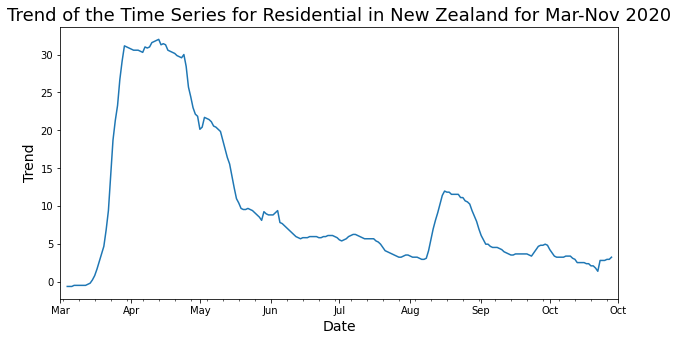

In [82]:
#display the trend of the residential column
display_trend(new_zealand['residential_percent_change_from_baseline'], month, 'Residential in New Zealand')

In contrast to the other columns for New Zealand, this one undergoes a rapid upward trend during the month of March before undergoing a rapid descent during the month of April. The series then undergoes another significant upward trend during August before following a significant downward trend

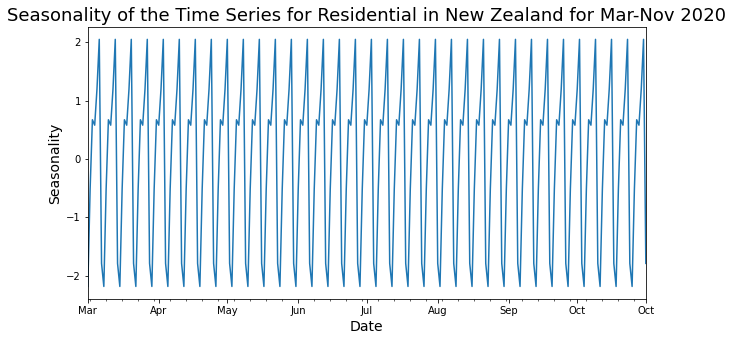

In [83]:
#display the seasonality of the residential column
display_seasonal(new_zealand['residential_percent_change_from_baseline'], month, 'Residential in New Zealand')

Looking at the noise, it appears as though the series peaks and troughs periodically throughout the months. It seems as though the series peaks during the middle of each week and troughs during the end of each week

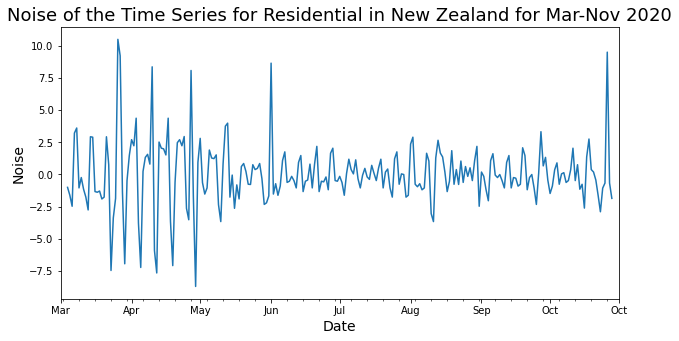

In [84]:
#display the noise of the residential column
display_noise(new_zealand['residential_percent_change_from_baseline'], month, 'Residential in New Zealand')

Here, it's clear to see that there are significant outliers present in the months of March, April, June and October

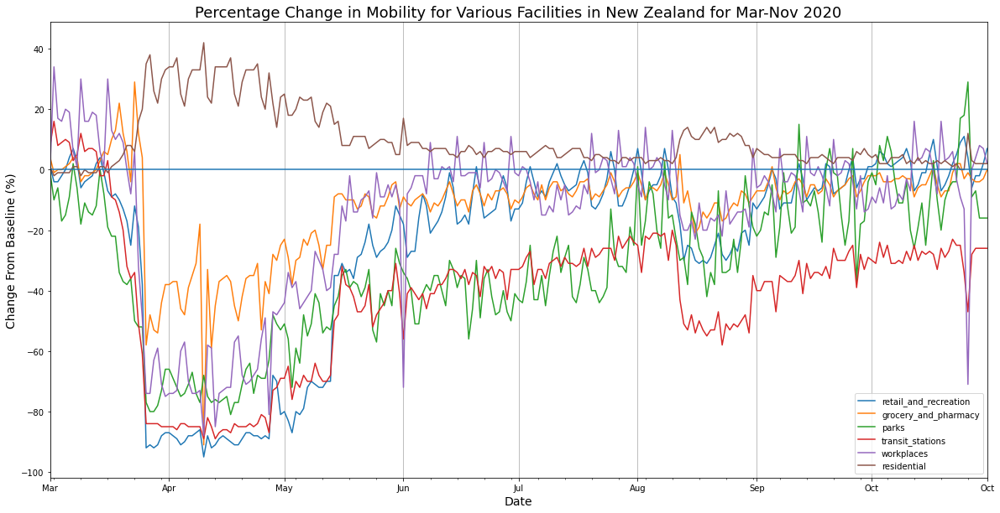

In [85]:
#Plot a time series for New Zealand
plot_time_series_country(new_zealand, month, "New Zealand")

Having already decomposed all the columns for New Zealand, I found that the months of March, April, May, August and October were quite interesting because in a lot of the columns, these months either contained sharp turning points or significant outliers, so I think these months should be examined more closely

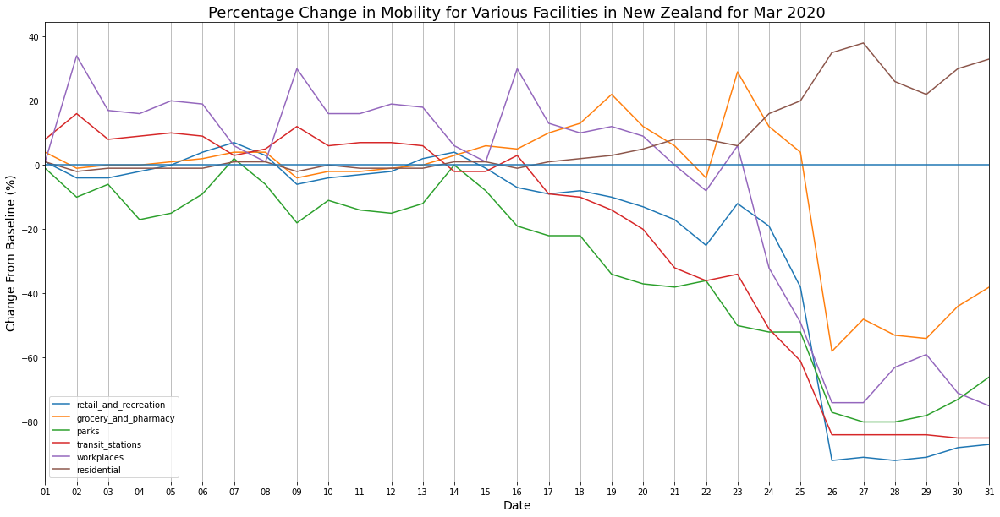

In [86]:
'''
As previously discussed, I thought it would be interesting to look at the month of March
more closely since this was the time at which the time series across all facilities began
to either descend or ascend rapidly
'''
plot_time_series_country(new_zealand['2020-03'], day, "New Zealand for Mar 2020")

Looking at this time series for the month of March, it appears as though the days on which the downwards (or upwards in the case of residential facilities) trend in New Zealand began were on or close to March 23rd, which is interesting because March 23rd was the day on which the prime minister of New Zealand announced that New Zealand had moved to Alert Level 3. Just two days later on the 25th of March, the entire nation went into self-isolation

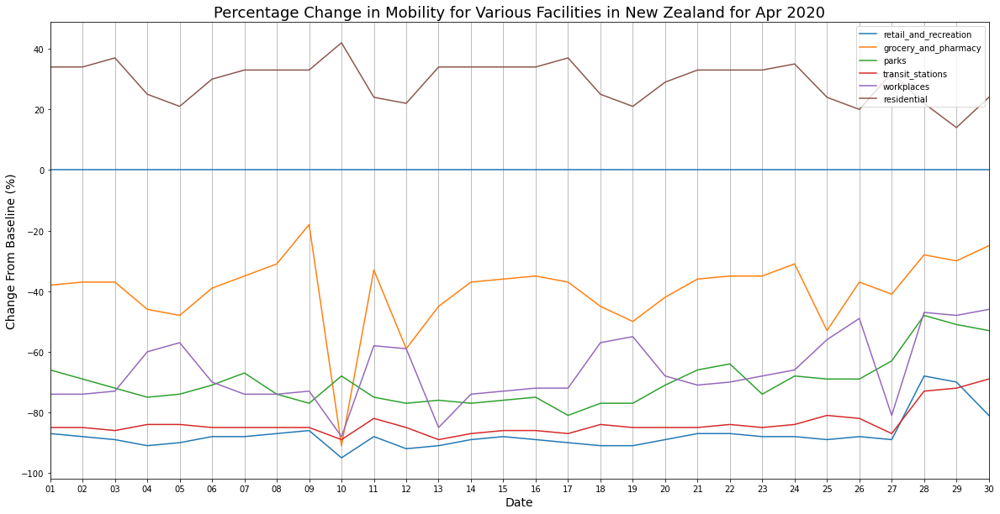

In [87]:
'''
As previously discussed, I thought it would be interesting to look at the month of April
more closely since this was the time at which the time series across all facilities began
to ascend after descending rapidly, or in the case of residential facilities, began
to descend after increasing rapidly. Across all columns, April was the month that contained
the trough (or peak in the case of residential facilities) for the entire 8 months
'''
plot_time_series_country(new_zealand['2020-04'], day, "New Zealand for Apr 2020")

You can see here that the troughs for the columns (except residential) occurred at some time around the 10th of April. This may be related to the fact that this day was Good Friday but we should also keep in mind that this was during the height of New Zealand's self-isolation period in Alert Level 4

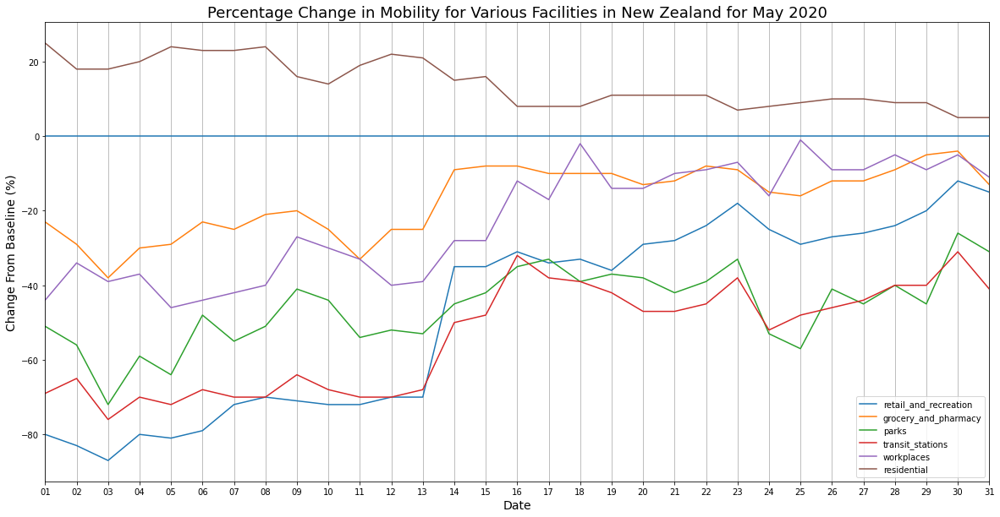

In [88]:
'''
As previously discussed, I thought it would be interesting to look at the month of May
more closely since this seemed to be a time where the trends of the series started to
flatten out, having ascended from late April
'''
plot_time_series_country(new_zealand['2020-05'], day, "New Zealand for May 2020")

Looking at the time series for the month of May in New Zealand, we can see that after May 13th, there were spikes across a lot of the series. And we also observe a gradual descent in the resedential series starting from May 13th. This could be related to the fact that on May 13th, New Zealand moved to Alert Level 2, having reported no new cases just 9 days prior and as such, the national state of emergency expired on May 13th

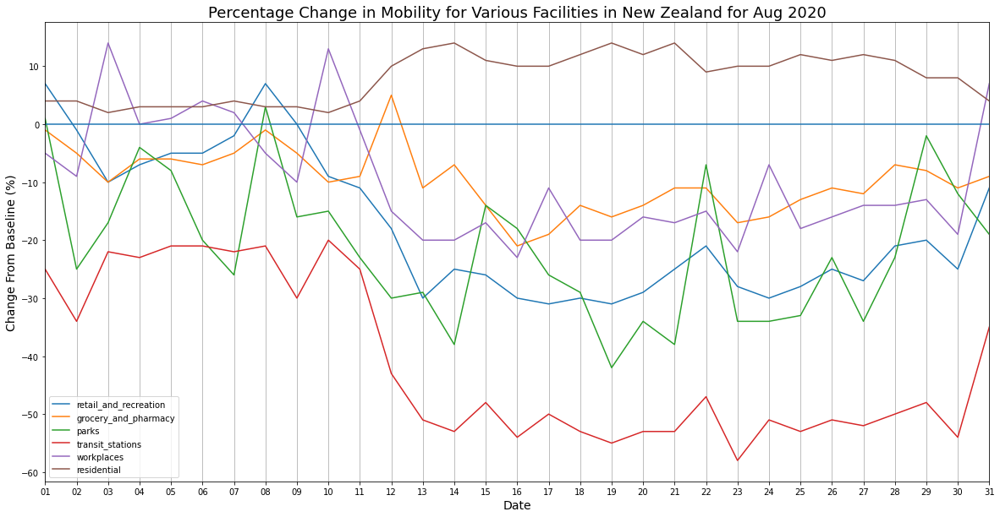

In [89]:
'''
As previously discussed, I thought it would be interesting to look at the month of August
more closely because this month contained many turning points and outliers
'''
plot_time_series_country(new_zealand['2020-08'], day, "New Zealand for Aug 2020")

Here, we can see that most column's time series descended rapidly (or ascended in the case of residential) between the 10th and 12th of August. This is interesting because on the 12th of August, Auckland (New Zealand's capital city) moved to Alert Level 3, while the rest of the country moved to Alert Level 2 having previously been on Level 1

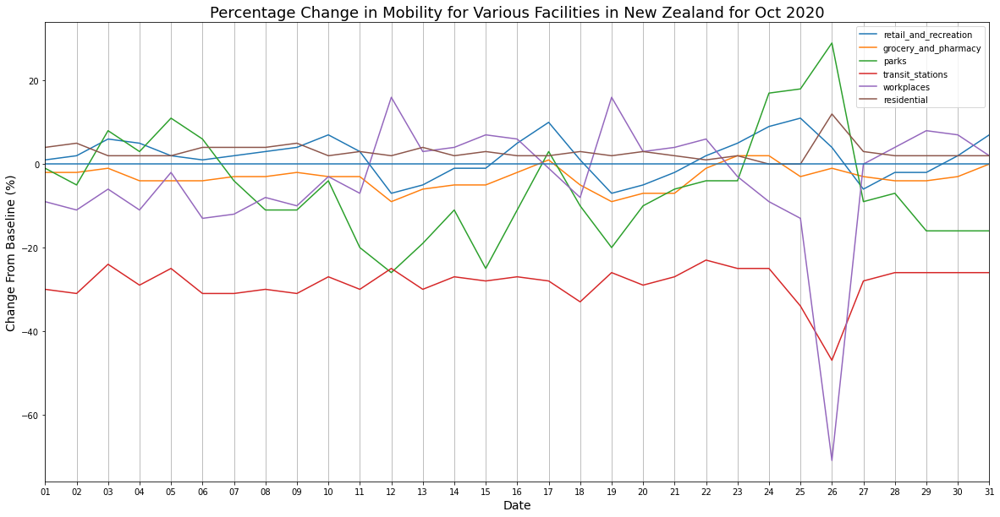

In [90]:
'''
As previously discussed, I thought it would be interesting to look at the month of October
more closely because this month contained many outliers
'''
plot_time_series_country(new_zealand['2020-10'], day, "New Zealand for Oct 2020")

It's clear to see that all the series undergo dramatic changes on October 26th. This is probably because this was Labour Day in New Zealand and is a public holiday. So there were dramatic descents in workplaces and transit stations, probably because less people went to work that day. Meanwhile, columns such as parks, residential and retail and recreation all saw dramatic ascents

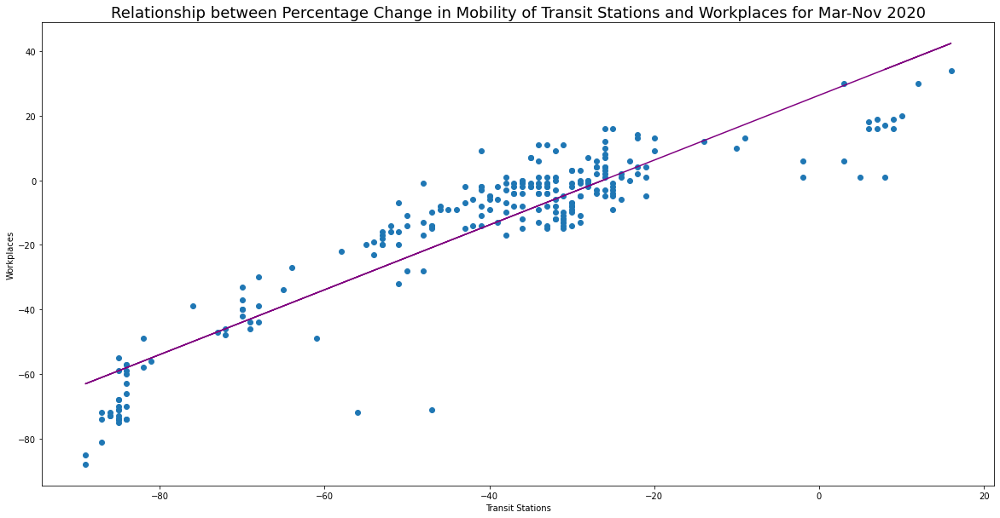

The correlation coefficient is: 0.9135489308930359


In [91]:
#Let's view the relationship between the percentage change in mobility for transit stations and workplaces in New Zealand
correlate(new_zealand['transit_stations_percent_change_from_baseline'], new_zealand['workplaces_percent_change_from_baseline'], 'Transit Stations', 'Workplaces')

We can see that the correlation between the change in transit stations and workplaces is very strong with a correlation coefficient of 0.91. This implies that many people rely on public transport to get to work in New Zealand, as more people visited transit stations, more people went to work

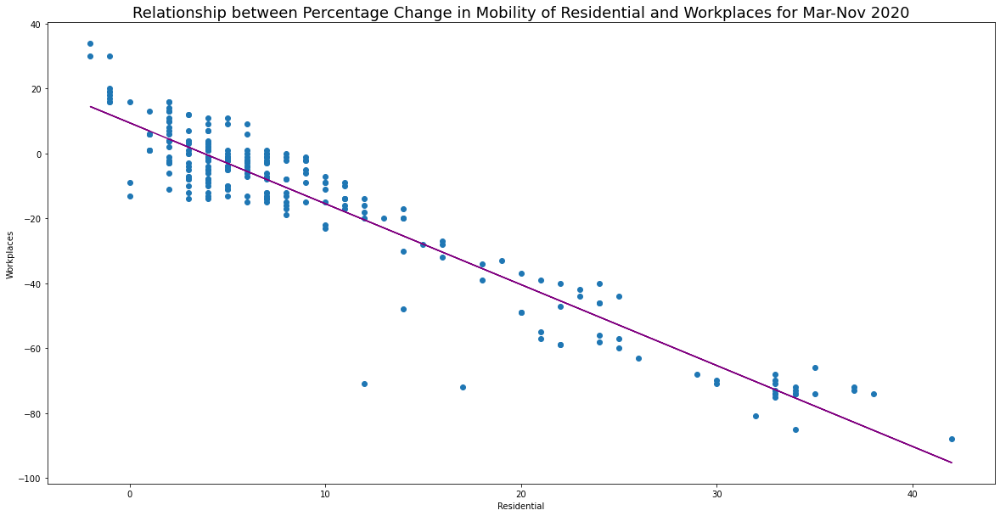

The correlation coefficient is: -0.9481912663701018


In [92]:
#Now let's view the relationship between the percentage change in mobility for residential and workplaces in New Zealand
correlate(new_zealand['residential_percent_change_from_baseline'], new_zealand['workplaces_percent_change_from_baseline'], 'Residential', 'Workplaces')

This scatter plot shows that the relationship between the changes in mobility for residential areas and workplaces is very strong with a correlation coefficient of -0.94. The strong negative correlation implies that as more people stayed at home, less people went to work

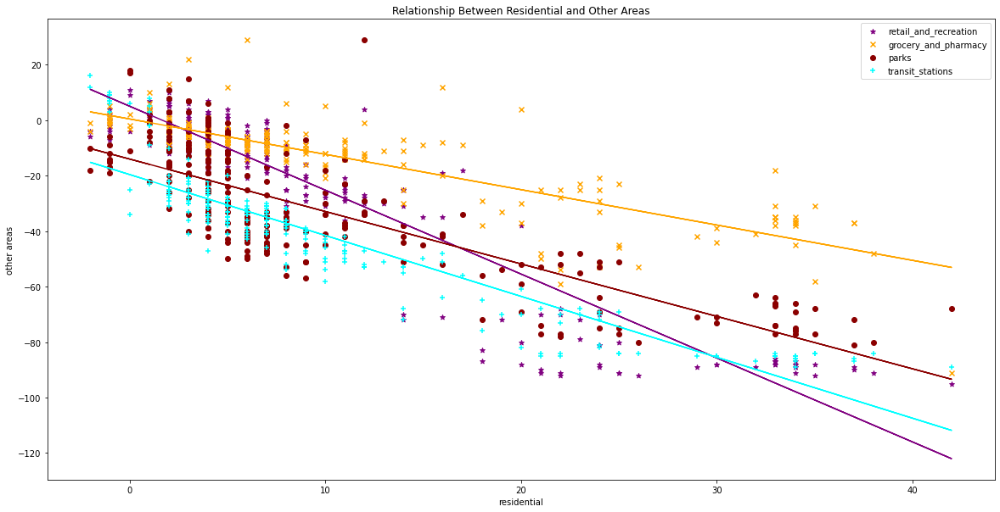

The correlation coefficient between the residential and retail and recreation is: -0.9385424547351309
The correlation coefficient between the residential and grocery and pharmacy is: -0.8424361420451094
The correlation coefficient between the residential and parks is: -0.8059944483580649
The correlation coefficient between the residential and transit stations is: -0.9176627412582866


In [93]:
#Now let's view the relationship between the percentage change in mobility for residential and the rest of the columns in New Zealand

#create the scatter plots for the various areas versus residential
plt.scatter(new_zealand['residential_percent_change_from_baseline'], new_zealand['retail_and_recreation_percent_change_from_baseline'], color = 'purple', marker = '*', label = 'retail_and_recreation')
plt.scatter(new_zealand['residential_percent_change_from_baseline'], new_zealand['grocery_and_pharmacy_percent_change_from_baseline'], color = 'orange', marker = 'x', label = 'grocery_and_pharmacy')
plt.scatter(new_zealand['residential_percent_change_from_baseline'], new_zealand['parks_percent_change_from_baseline'], color = 'darkred', marker = 'o', label = 'parks')
plt.scatter(new_zealand['residential_percent_change_from_baseline'], new_zealand['transit_stations_percent_change_from_baseline'], color = 'cyan', marker = '+', label = 'transit_stations')

#create the lines of best fit using the equation of a line (y = mx + c) by finding the slope and the y-intercept using
#the numpy.polyfit() function
m_ret_rec, c_ret_rec = np.polyfit(new_zealand['residential_percent_change_from_baseline'], new_zealand['retail_and_recreation_percent_change_from_baseline'], 1)
m_gro_pha, c_gro_pha = np.polyfit(new_zealand['residential_percent_change_from_baseline'], new_zealand['grocery_and_pharmacy_percent_change_from_baseline'], 1)
m_park, c_park = np.polyfit(new_zealand['residential_percent_change_from_baseline'], new_zealand['parks_percent_change_from_baseline'], 1)
m_trans, c_trans = np.polyfit(new_zealand['residential_percent_change_from_baseline'], new_zealand['transit_stations_percent_change_from_baseline'], 1)

#plot the lines of best fit, ensuring the lines are the same colour as the variables they represent for simplicity
plt.plot(new_zealand['residential_percent_change_from_baseline'], m_ret_rec*new_zealand['residential_percent_change_from_baseline'] + c_ret_rec, color = 'purple')
plt.plot(new_zealand['residential_percent_change_from_baseline'], m_gro_pha*new_zealand['residential_percent_change_from_baseline'] + c_gro_pha, color = 'orange')
plt.plot(new_zealand['residential_percent_change_from_baseline'], m_park*new_zealand['residential_percent_change_from_baseline'] + c_park, color = 'darkred')
plt.plot(new_zealand['residential_percent_change_from_baseline'], m_trans*new_zealand['residential_percent_change_from_baseline'] + c_trans, color = 'cyan')

plt.xlabel('residential')
plt.ylabel('other areas')

plt.legend()
plt.title('Relationship Between Residential and Other Areas')
plt.show()

#display the correlation coefficients
print('The correlation coefficient between the residential and retail and recreation is: ' +str(new_zealand['residential_percent_change_from_baseline'].corr(new_zealand['retail_and_recreation_percent_change_from_baseline'])))
print('The correlation coefficient between the residential and grocery and pharmacy is: ' +str(new_zealand['residential_percent_change_from_baseline'].corr(new_zealand['grocery_and_pharmacy_percent_change_from_baseline'])))
print('The correlation coefficient between the residential and parks is: ' +str(new_zealand['residential_percent_change_from_baseline'].corr(new_zealand['parks_percent_change_from_baseline'])))
print('The correlation coefficient between the residential and transit stations is: ' +str(new_zealand['residential_percent_change_from_baseline'].corr(new_zealand['transit_stations_percent_change_from_baseline'])))


Looking at these scatter plots, all the correlation coefficients are strong and negative. Meaning that as more people stayed at home, less people went to these areas, so it appears as though New Zealand followed the self-isolation periods very well. One observation is perhaps the reason as to why the correlation coefficients between residential and grocery and pharmacy and parks was not as strong was because groceries and medication are necessities, and parks are outdoor

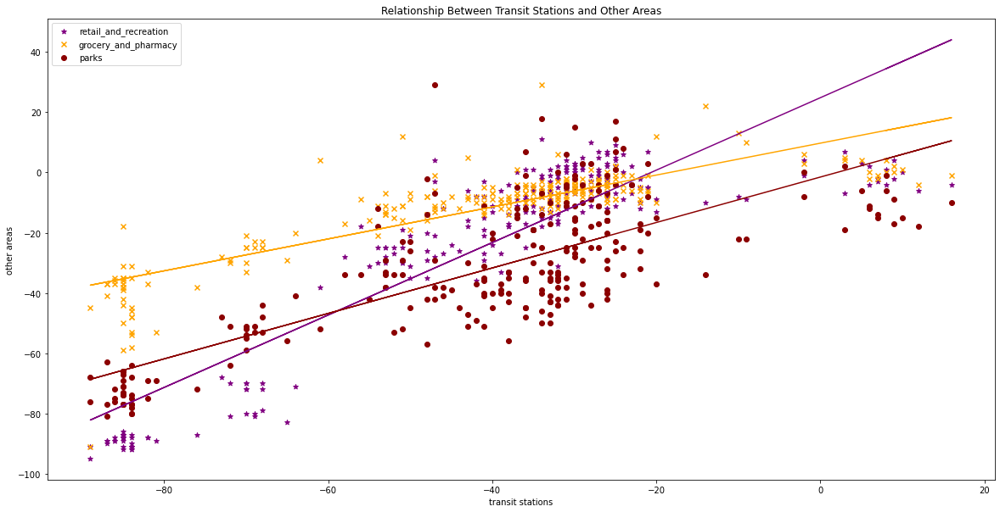

The correlation coefficient between the transit stations and retail and recreation is: 0.8923420441258707
The correlation coefficient between the transit stations and grocery and pharmacy is: 0.8379875313291555
The correlation coefficient between the transit stations and parks is: 0.7696496290052733


In [94]:
#Now let's view the relationship between the percentage change in mobility for transit stations and the rest of the columns in New Zealand

#create the scatter plots for the various areas versus residential
plt.scatter(new_zealand['transit_stations_percent_change_from_baseline'], new_zealand['retail_and_recreation_percent_change_from_baseline'], color = 'purple', marker = '*', label = 'retail_and_recreation')
plt.scatter(new_zealand['transit_stations_percent_change_from_baseline'], new_zealand['grocery_and_pharmacy_percent_change_from_baseline'], color = 'orange', marker = 'x', label = 'grocery_and_pharmacy')
plt.scatter(new_zealand['transit_stations_percent_change_from_baseline'], new_zealand['parks_percent_change_from_baseline'], color = 'darkred', marker = 'o', label = 'parks')

#create the lines of best fit using the equation of a line (y = mx + c) by finding the slope and the y-intercept using
#the numpy.polyfit() function
m_ret_rec, c_ret_rec = np.polyfit(new_zealand['transit_stations_percent_change_from_baseline'], new_zealand['retail_and_recreation_percent_change_from_baseline'], 1)
m_gro_pha, c_gro_pha = np.polyfit(new_zealand['transit_stations_percent_change_from_baseline'], new_zealand['grocery_and_pharmacy_percent_change_from_baseline'], 1)
m_park, c_park = np.polyfit(new_zealand['transit_stations_percent_change_from_baseline'], new_zealand['parks_percent_change_from_baseline'], 1)

#plot the lines of best fit, ensuring the lines are the same colour as the variables they represent for simplicity
plt.plot(new_zealand['transit_stations_percent_change_from_baseline'], m_ret_rec*new_zealand['transit_stations_percent_change_from_baseline'] + c_ret_rec, color = 'purple')
plt.plot(new_zealand['transit_stations_percent_change_from_baseline'], m_gro_pha*new_zealand['transit_stations_percent_change_from_baseline'] + c_gro_pha, color = 'orange')
plt.plot(new_zealand['transit_stations_percent_change_from_baseline'], m_park*new_zealand['transit_stations_percent_change_from_baseline'] + c_park, color = 'darkred')

plt.xlabel('transit stations')
plt.ylabel('other areas')

plt.legend()
plt.title('Relationship Between Transit Stations and Other Areas')
plt.show()

#display the correlation coefficients
print('The correlation coefficient between the transit stations and retail and recreation is: ' +str(new_zealand['transit_stations_percent_change_from_baseline'].corr(new_zealand['retail_and_recreation_percent_change_from_baseline'])))
print('The correlation coefficient between the transit stations and grocery and pharmacy is: ' +str(new_zealand['transit_stations_percent_change_from_baseline'].corr(new_zealand['grocery_and_pharmacy_percent_change_from_baseline'])))
print('The correlation coefficient between the transit stations and parks is: ' +str(new_zealand['transit_stations_percent_change_from_baseline'].corr(new_zealand['parks_percent_change_from_baseline'])))


Once again, the correlation coefficients are strong, but not as strong as the correlation coefficients between the residential areas and other areas. Although in general, it could be argued that as more people visited transit stations, more people visited these other areas. This could either be because people used the transit stations to commute there, or perhaps by coincidence, these areas happened to be very close to the transit stations

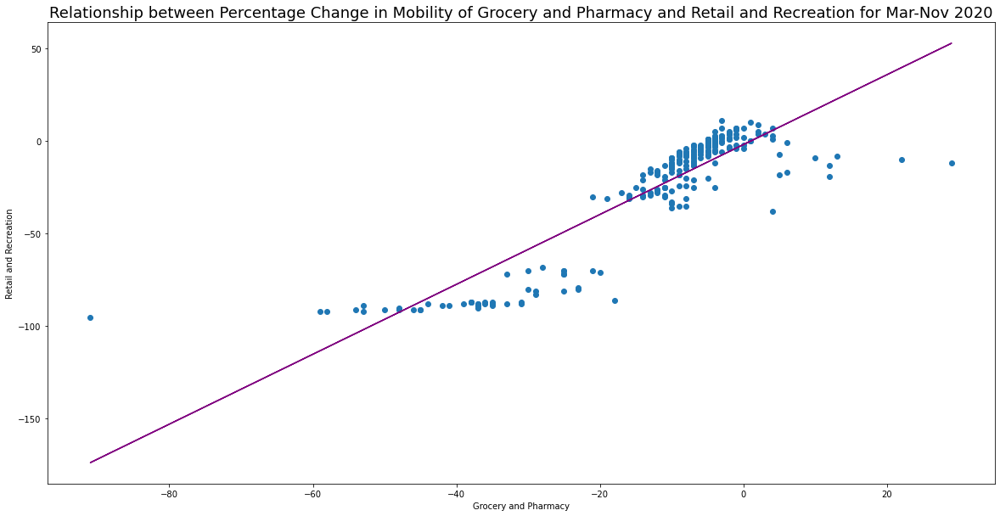

The correlation coefficient is: 0.8858226187146049


In [95]:
#Now let's view the relationship between the percentage change in mobility for grocery and pharmacy and retail and recreation areas in New Zealand
correlate(new_zealand['grocery_and_pharmacy_percent_change_from_baseline'], new_zealand['retail_and_recreation_percent_change_from_baseline'], 'Grocery and Pharmacy', 'Retail and Recreation')

As we can see, the relationship between these two variables is quite strong. The strong corrleation coefficient may suggest that as more people visited grocery shops and pharmacies, more people visited retail and recreation areas. 

In [96]:
ireland = pd.read_csv('ireland.csv', index_col = 'date', parse_dates = True)
ireland.head()

,id,country,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
date,,,,,,,,
2020-03-01,1265158,Ireland,3.0,3.0,-5.0,2.0,2.0,0.0
2020-03-02,1265159,Ireland,4.0,4.0,12.0,1.0,1.0,0.0
2020-03-03,1265160,Ireland,8.0,5.0,29.0,2.0,3.0,-1.0
2020-03-04,1265161,Ireland,5.0,4.0,25.0,1.0,1.0,0.0
2020-03-05,1265162,Ireland,4.0,4.0,15.0,0.0,2.0,0.0


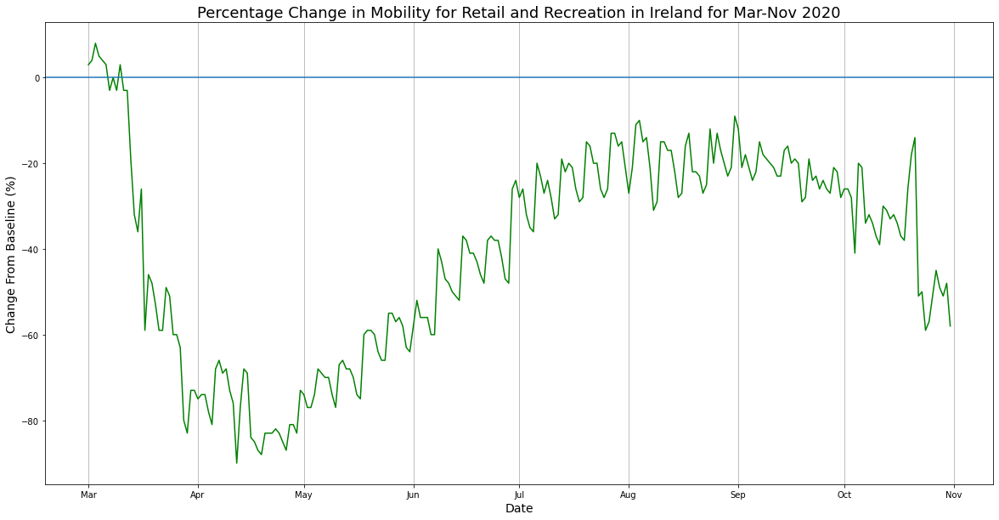

In [97]:
#create a time series for the retail and recreation column
plot_time_series(ireland['retail_and_recreation_percent_change_from_baseline'], 'green', month, 'Retail and Recreation in Ireland')

In [98]:
#compute summary statistics for the series
ireland['retail_and_recreation_percent_change_from_baseline'].describe()

count    245.000000
mean     -40.502041
std       24.049918
min      -90.000000
25%      -60.000000
50%      -34.000000
75%      -21.000000
max        8.000000
Name: retail_and_recreation_percent_change_from_baseline, dtype: float64

These summary statistics show that the average change from the baseline throughout the 245 days was approximately -40.5%, as well as that, the maximum change from the baseline was 8% while the minimum change from the baseline was -90%

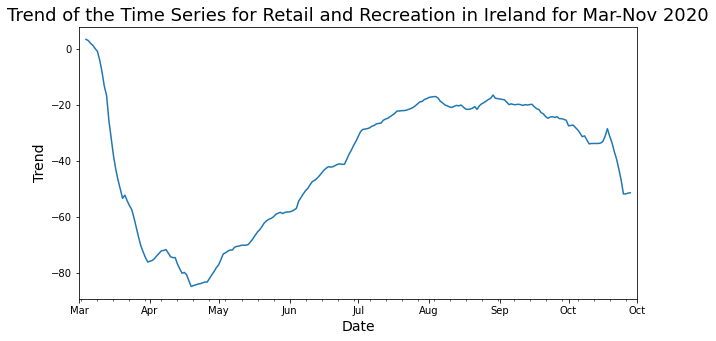

In [99]:
#display the trend of the retail and recreation column
display_trend(ireland['retail_and_recreation_percent_change_from_baseline'], month, 'Retail and Recreation in Ireland')

Here, we can see that the series undergoes a steep downward trend from the beginning of March right up to the end of the month where it follows a brief upward trend before taking another downward trend in April. Then the graph takes a gradual upward trend in April all the way to August. Then in October, the series undergoes a brief dramatic upward trend before following a downward trend for the rest of the month

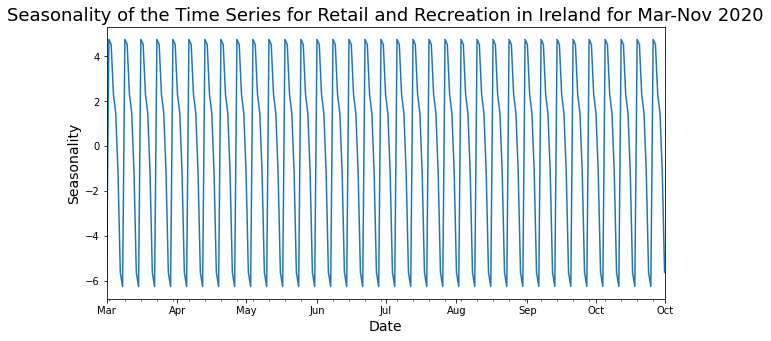

In [100]:
#display the seasonality of the retail and recreation column
display_seasonal(ireland['retail_and_recreation_percent_change_from_baseline'], month, 'Retail and Recreation in Ireland')

It appears as though the series peaks and throughs periodically throughout the months. It seems as though the series peaks at the start of the week and troughs towards the end of each week

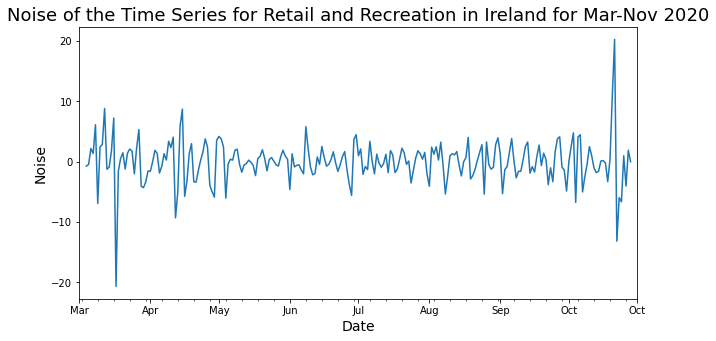

In [101]:
#display the noise of the retail and recreation column
display_noise(ireland['retail_and_recreation_percent_change_from_baseline'], month, 'Retail and Recreation in Ireland')

It's clear to see here that there are significant outliers present in March, April and October

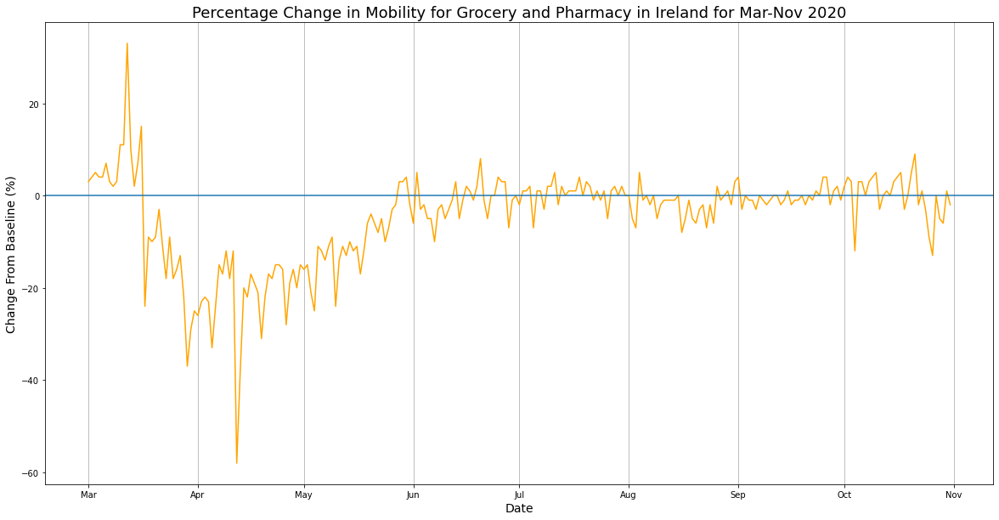

In [102]:
#create a time series for the grocery and pharmacy column
plot_time_series(ireland['grocery_and_pharmacy_percent_change_from_baseline'], 'orange', month, 'Grocery and Pharmacy in Ireland')

In [103]:
#compute summmary statistics for the series
ireland['grocery_and_pharmacy_percent_change_from_baseline'].describe()

count    245.000000
mean      -4.795918
std       10.046163
min      -58.000000
25%      -10.000000
50%       -2.000000
75%        1.000000
max       33.000000
Name: grocery_and_pharmacy_percent_change_from_baseline, dtype: float64

These summary statistics show that the average change from the baseline throughout the 245 days was approximately -5%, as well as that, the maximum change from the baseline was 33% while the minimum change from the baseline was -58%

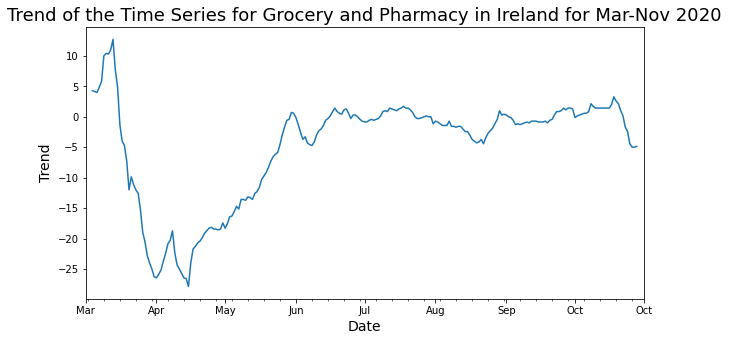

In [104]:
#display the trend of the grocery and pharmacy column
display_trend(ireland['grocery_and_pharmacy_percent_change_from_baseline'], month, 'Grocery and Pharmacy in Ireland')

Here we can see that there is a brief, steep upward trend in the month of March which is then quickly followed by a steep downward trend right until the end of the month. Then in April, we see that the series follows a brief upward followed by a brief downward trend, which is then followed by a steep upward trend and then the series follows a more gradual upward ternd until the end of May. We then see some more turning points in the months of June and August. But then we see a very dramatic downward trend in the month of October

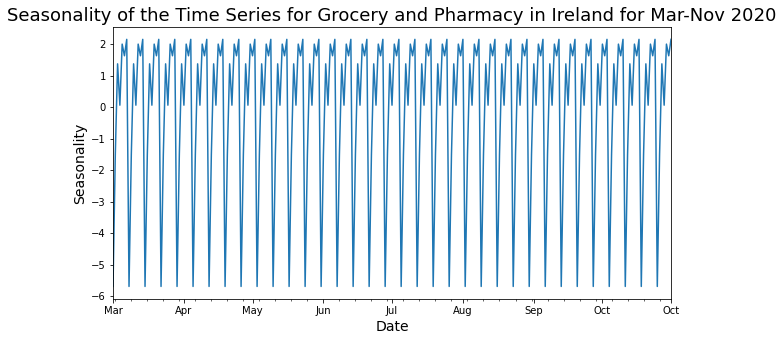

In [105]:
#display the seasonality of the grocery and pharmacy column
display_seasonal(ireland['grocery_and_pharmacy_percent_change_from_baseline'], month, 'Grocery and Pharmacy in Ireland')

It appears as though the series peaks and troughs periodically throughout the months. It seems as though the series troughs at the end of the week and peaks during the middle of the week

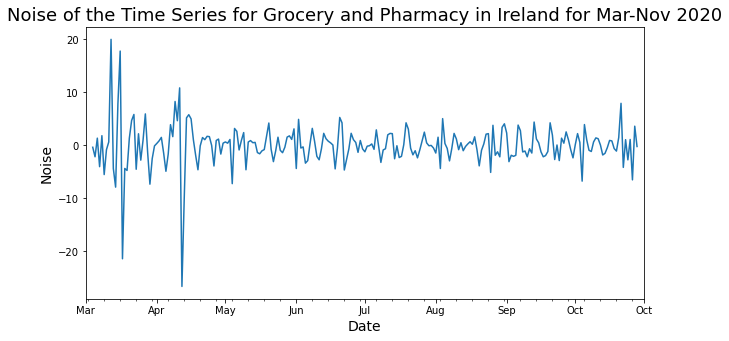

In [106]:
#display the noise of the grocery and pharmacy column
display_noise(ireland['grocery_and_pharmacy_percent_change_from_baseline'], month, 'Grocery and Pharmacy in Ireland')

Here, we can see that there are outliers present in the months of March, April and October

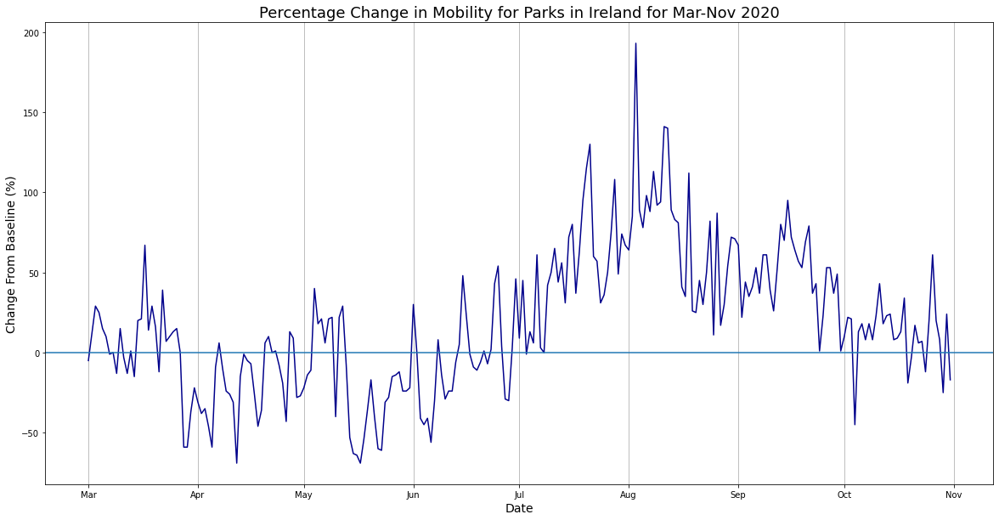

In [107]:
#create a time series for the parks column
plot_time_series(ireland['parks_percent_change_from_baseline'], 'darkblue', month, 'Parks in Ireland')

In [108]:
#compute summmary statistics for the series
ireland['parks_percent_change_from_baseline'].describe()

count    245.000000
mean      18.587755
std       43.762556
min      -69.000000
25%      -12.000000
50%       14.000000
75%       46.000000
max      193.000000
Name: parks_percent_change_from_baseline, dtype: float64

These summary statistics show that the average change from the baseline throughout the 245 days was approximately 18.6%, as well as that, the maximum change from the baseline was 193% while the minimum change from the baseline was -69%

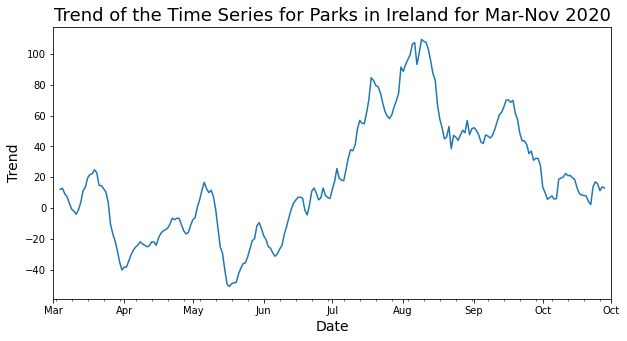

In [109]:
#display the trend of the parks column
display_trend(ireland['parks_percent_change_from_baseline'], month, 'Parks in Ireland')

Here we can see that the series has significant turning points in March, May, July, August and October

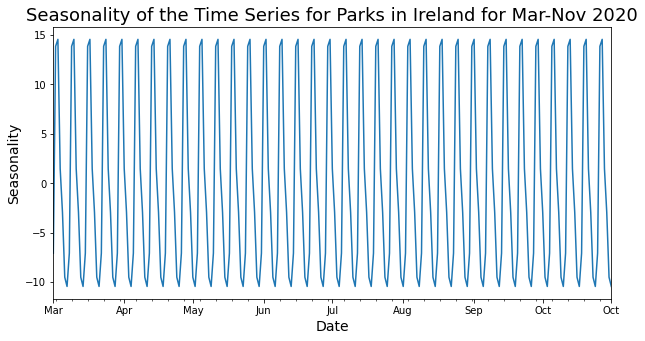

In [110]:
#display the seasonality of the parks column
display_seasonal(ireland['parks_percent_change_from_baseline'], month, 'Parks in Ireland')

It appears as though the series peaks and troughs periodically throughout the months. It seems as though the series peaks in the start of each week and troughs during the middle of each week

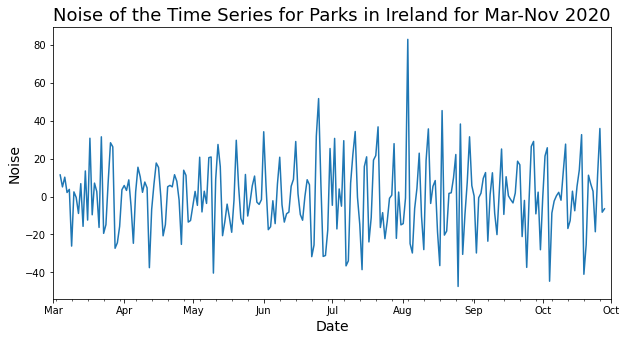

In [111]:
#display the noise of the parks column
display_noise(ireland['parks_percent_change_from_baseline'], month, 'Parks in Ireland')

Here we can see that there are significant outliers present in the months of May, June, August, September and October

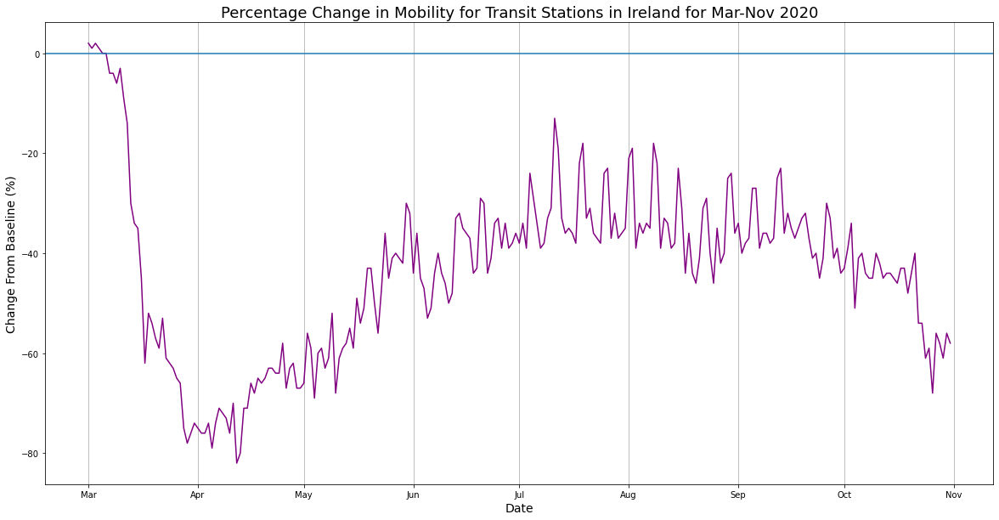

In [112]:
#create a time series for the transit stations column
plot_time_series(ireland['transit_stations_percent_change_from_baseline'], 'purple', month, 'Transit Stations in Ireland')

In [113]:
#compute summmary statistics for the series
ireland['transit_stations_percent_change_from_baseline'].describe()

count    245.000000
mean     -43.404082
std       17.147264
min      -82.000000
25%      -56.000000
50%      -41.000000
75%      -34.000000
max        2.000000
Name: transit_stations_percent_change_from_baseline, dtype: float64

These summary statistics show that the average change from the baseline throughout the 245 days was approximately -43%, as well as that, the maximum change from the baseline was 2% while the minimum change from the baseline was -82%

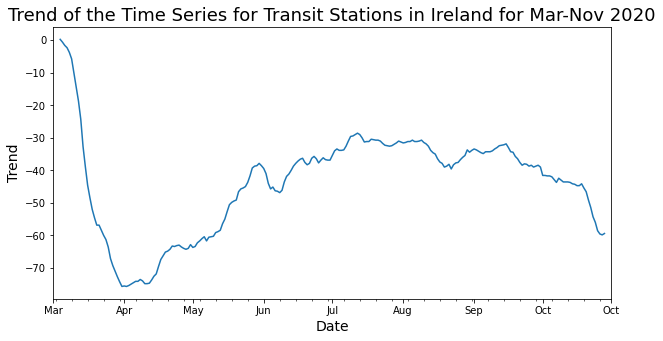

In [114]:
#display the trend of the transit stations column
display_trend(ireland['transit_stations_percent_change_from_baseline'], month, 'Transit Stations in Ireland')

Here we can see that the series follows an immediate, steep downward trend in the month of March, then in April it follows a much more gradual upward trend until July. Then in October we see quite a dramatic downward trend

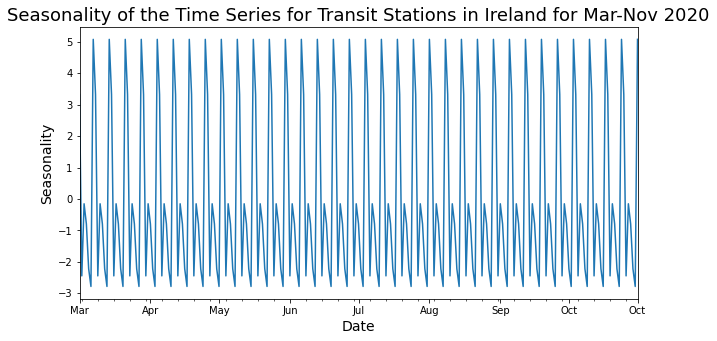

In [115]:
#display the seasonality of the transit stations column
display_seasonal(ireland['transit_stations_percent_change_from_baseline'], month, 'Transit Stations in Ireland')

It appears as though the series peaks and troughs periodically throughout the months. It seems as though the series peaks during the end of each week and troughs in the middle of each week

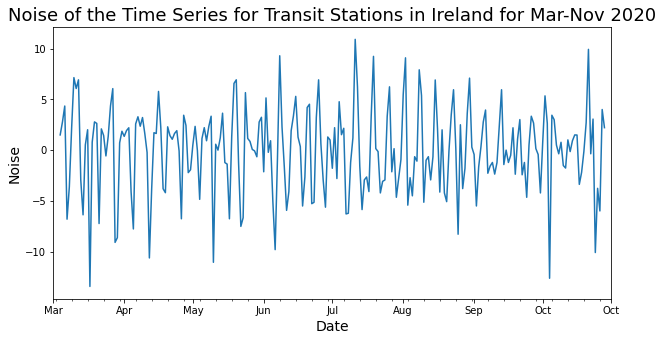

In [116]:
#display the noise of the transit stations column
display_noise(ireland['transit_stations_percent_change_from_baseline'], month, 'Transit Stations in Ireland')

Here we can see that there are significant outliers present in all the months, except September, this could be because this is a time at which schools re-opened

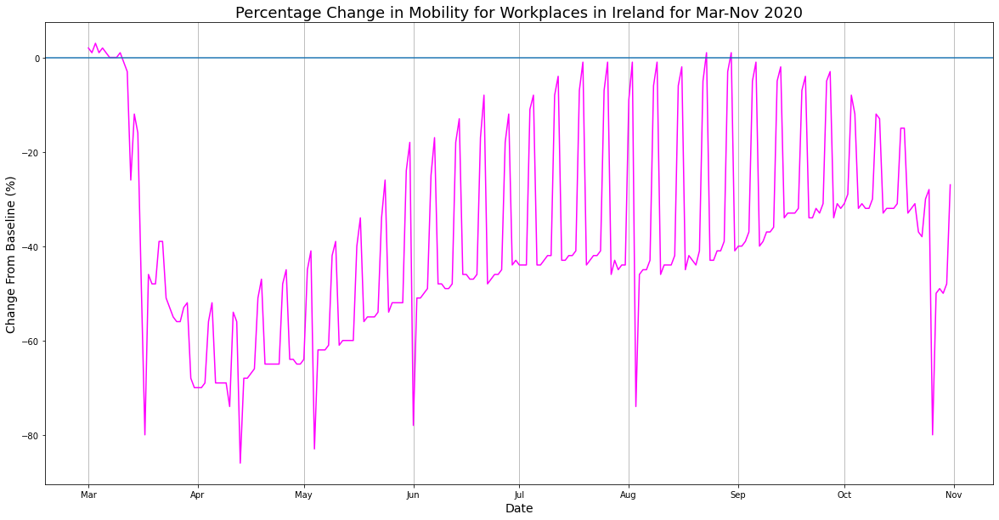

In [117]:
#create a time series for the workplaces column
plot_time_series(ireland['workplaces_percent_change_from_baseline'], 'magenta', month, 'Workplaces in Ireland')

In [118]:
#compute summmary statistics for the series
ireland['workplaces_percent_change_from_baseline'].describe()

count    245.000000
mean     -38.306122
std       20.755410
min      -86.000000
25%      -51.000000
50%      -42.000000
75%      -30.000000
max        3.000000
Name: workplaces_percent_change_from_baseline, dtype: float64

These summary statistics show that the average change from the baseline throughout the 245 days was approximately -38%, as well as that, the maximum change from the baseline was 3% while the minimum change from the baseline was -86%

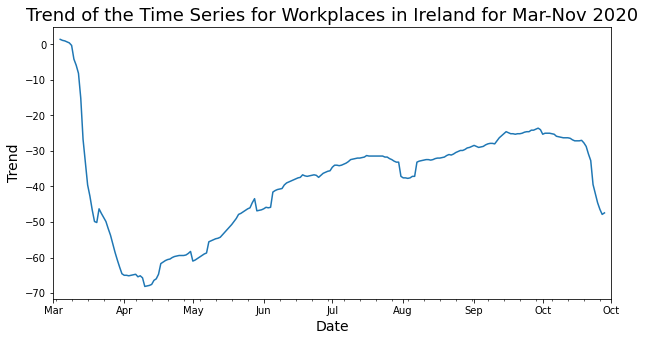

In [119]:
#display the trend of the workplaces column
display_trend(ireland['workplaces_percent_change_from_baseline'], month, 'Workplaces in Ireland')

Here, we can see that the graph undergoes a steep descent immedialey in the month of March. Then in April the series follows a much more gradual upward trend with some turning pionts in the months of May, June and August. Then we notice that in October, the series follows a dramatic, steep downward trend

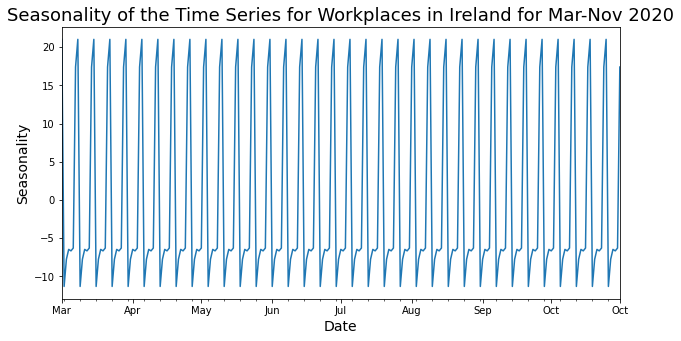

In [120]:
#display the seasonality of the workplaces column
display_seasonal(ireland['workplaces_percent_change_from_baseline'], month, 'Workplaces in Ireland')

It appears as thought the series peaks and troughs periodically throughout the months. It seems as though the series peaks in the middle of each week and troughs towards the end of each week

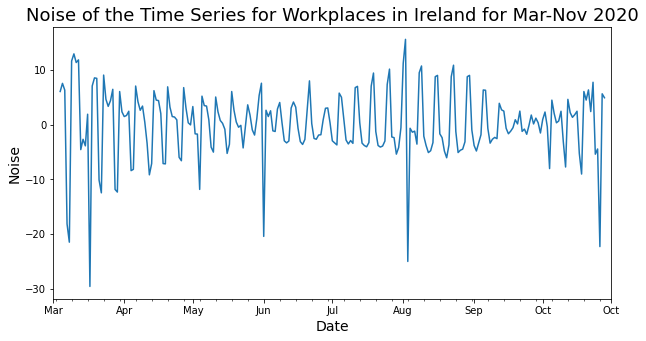

In [121]:
#display the noise of the workplaces column
display_noise(ireland['workplaces_percent_change_from_baseline'], month, 'Workplaces in Ireland')

Here, we can see that there are significant outliers present in the months of March, May, August and October

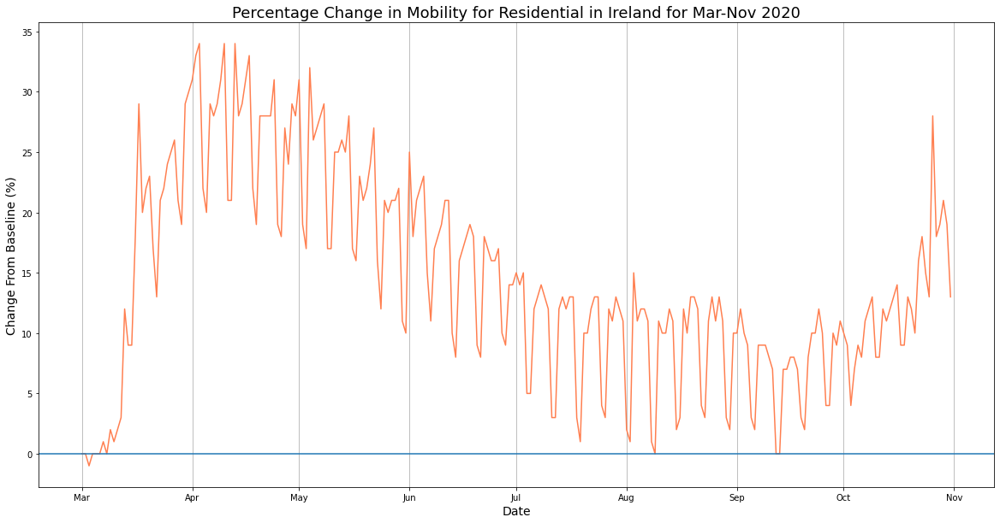

In [122]:
#create a time series for the residential column
plot_time_series(ireland['residential_percent_change_from_baseline'], 'coral', month, 'Residential in Ireland')

In [123]:
#compute summmary statistics for the series
ireland['residential_percent_change_from_baseline'].describe()

count    245.000000
mean      14.559184
std        8.635229
min       -1.000000
25%        9.000000
50%       13.000000
75%       21.000000
max       34.000000
Name: residential_percent_change_from_baseline, dtype: float64

These summary statistics show that the average change from the baseline throughout the 245 days was approximately -14.56%, as well as that, the maximum change from the baseline was 34% while the minimum change from the baseline was -1%

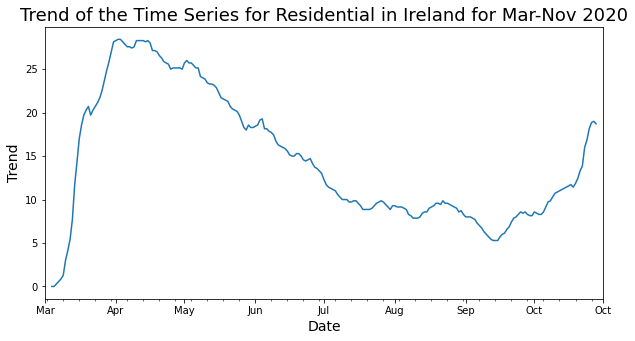

In [124]:
#display the trend of the residential column
display_trend(ireland['residential_percent_change_from_baseline'], month, 'Residential in Ireland')

In contrast to the rest of the columns for this month, this one follows a steep ascent immediatley in the month of March right up untl the beginning of April. However, from there the series follows a more gradual downward trend until September where the series then begins to follow an upward trend before dramatically ascending in the month of October

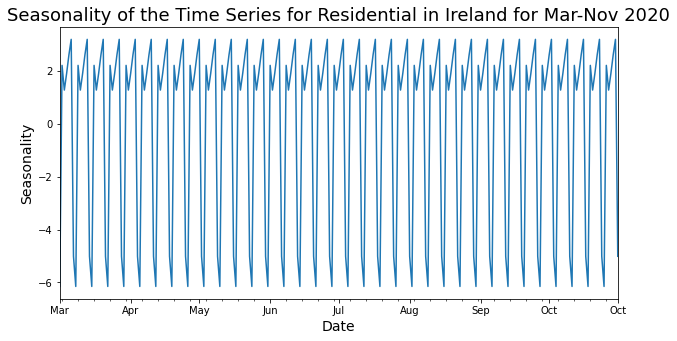

In [125]:
#display the seasonality of the residential column
display_seasonal(ireland['residential_percent_change_from_baseline'], month, 'Residential in Ireland')


It appears as thought the series peaks and troughs periodically throughout the months. It seems as though the series peaks in the middle of each week and troughs towards the end of each week

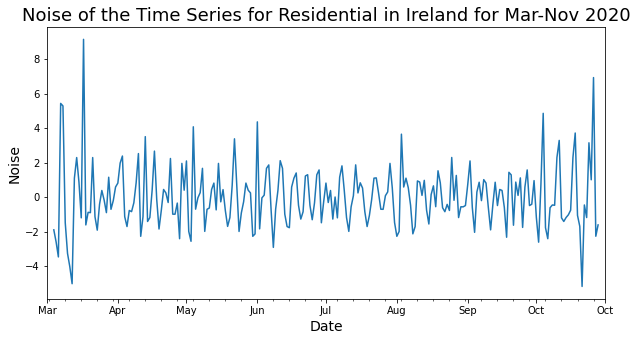

In [126]:
#display the noise of the residential column
display_noise(ireland['residential_percent_change_from_baseline'], month, 'Residential in Ireland')

Here we can see that there are significant outliers present in the months of March and October

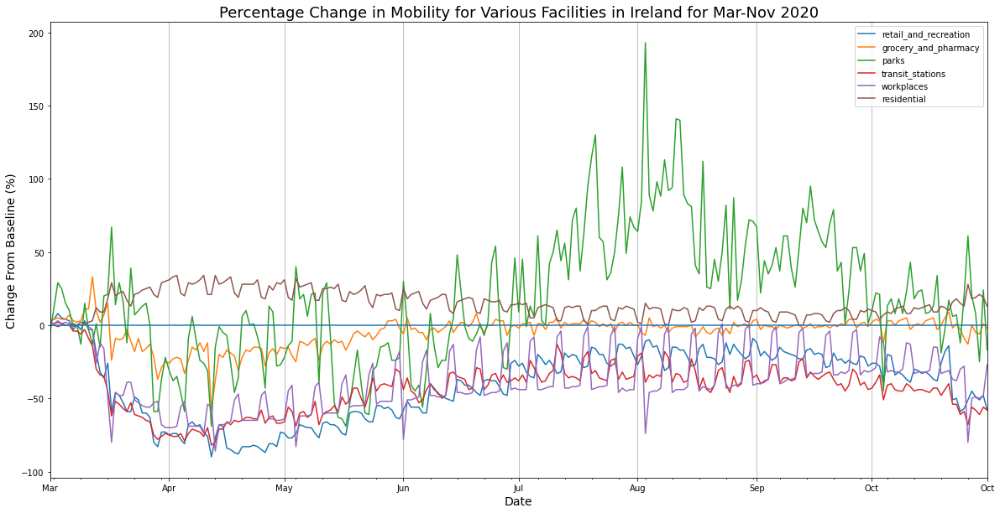

In [127]:
#Plot a time series for Ireland
plot_time_series_country(ireland, month, "Ireland")

Having already decomposed all the columns Ireland, I found that the months of March, April, August and October were quite interesting because in a lot of the columns, these months either contained sharp turning points or significant outliers, so I think these months should be examined more closely

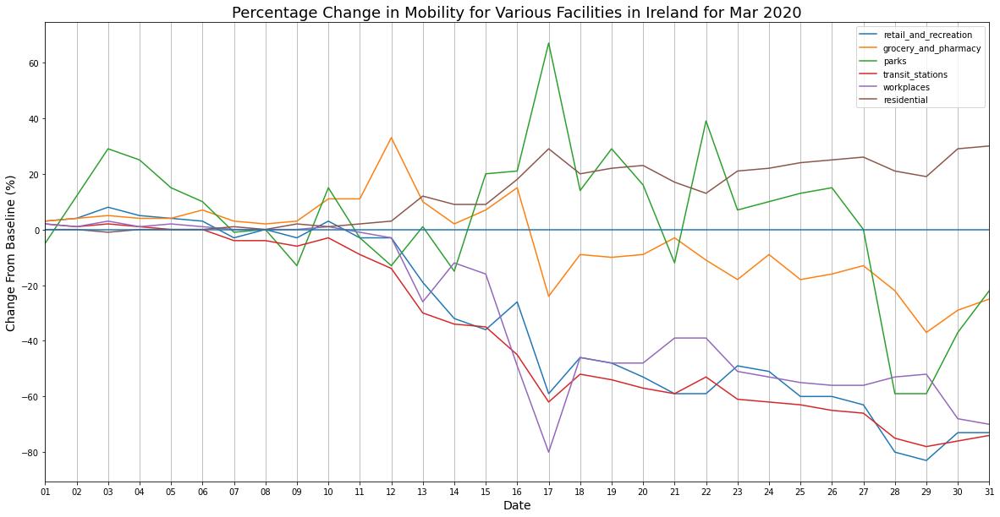

In [128]:
'''
As previously discussed, I thought it would be interesting to look at the month of March
more closely since this was the time at which the time series across all facilities began
to either descend or ascend rapidly
'''
plot_time_series_country(ireland['2020-03'], day, "Ireland for Mar 2020")

Looking at the time series for the Month of March, you'll notice a lot of drastic changes on March 17th, this is probably because March 17th is St.Patrick's day. However, prior to that, you'll see drastic changes after March 12th, which was when Leo Varadkar announced that schools, childcare facilities and colleges would close. Then you'll also see more drastic changes after March 27th which was the date that Ireland was placed on full lockdown

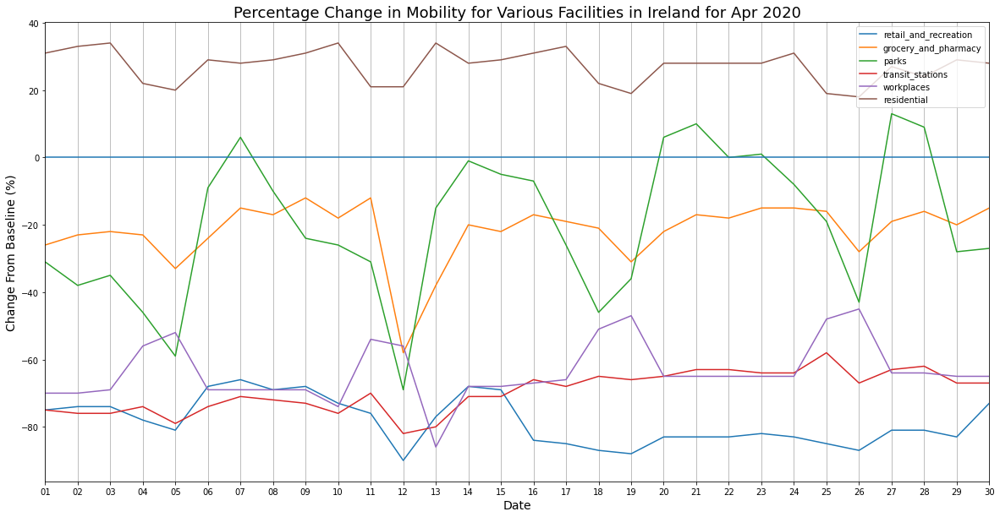

In [129]:
'''
As previously discussed, I thought it would be interesting to look at the month of April
more closely since this was the time at which the time series across all facilities began
to ascend after descending rapidly, or in the case of residential facilities, began
to descend after increasing rapidly. April also contained a number of outliers
'''
plot_time_series_country(ireland['2020-04'], day, "Ireland for Apr 2020")

You can see here that the series dramatically changed at some time around the 12th of April. This may be related to the fact that this day was Easter Sunday but we should also keep in mind that this was during the height of Ireland's lockdown

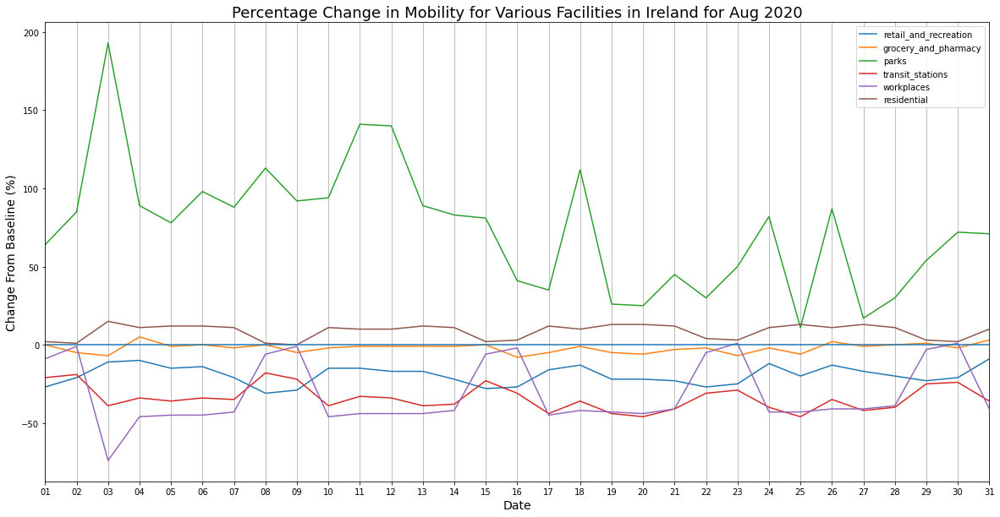

In [130]:
'''
As previously discussed, I thought it would be interesting to look at the month of August
more closely since this month contained a number of turning points and outliers
'''
plot_time_series_country(ireland['2020-08'], day, "Ireland for Aug 2020")

Here, we can see drastic changes to a number of time series on the 3rd of August, this is probably related to the fact that August the 3rd was a bank holiday

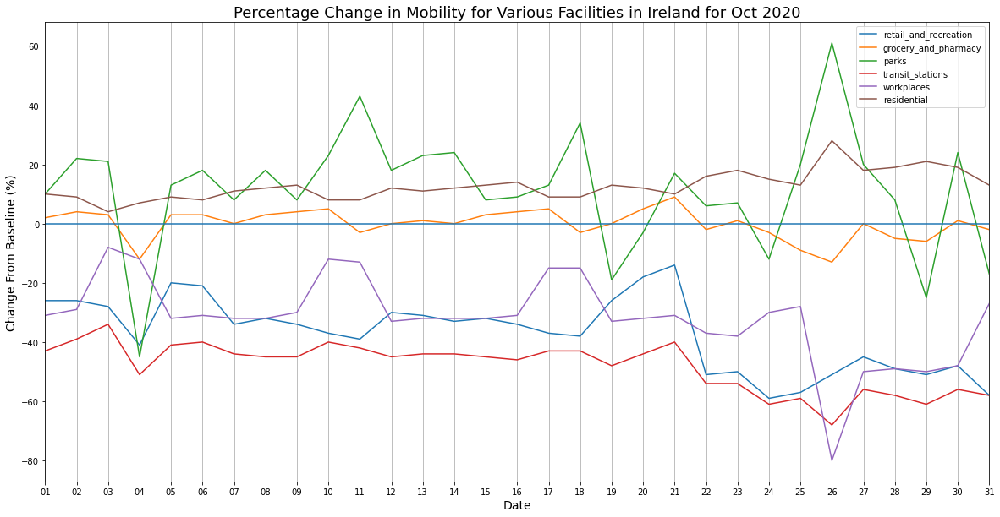

In [131]:
'''
As previously discussed, I thought it would be interesting to look at the month of October
more closely since this month contained a number of outliers
'''
plot_time_series_country(ireland['2020-10'], day, "Ireland for Oct 2020")

Here, you'll notice a number of drastic changes to the time series around the 19th of October, which was when Ireland went into it's second lockdown. You'll also observe a number of drastic changes on October 26th, which was a bank holiday in Ireland. It's also perhaps worth noting that on October 4th, NPHET recommended Level 5 restrictions for the entire country

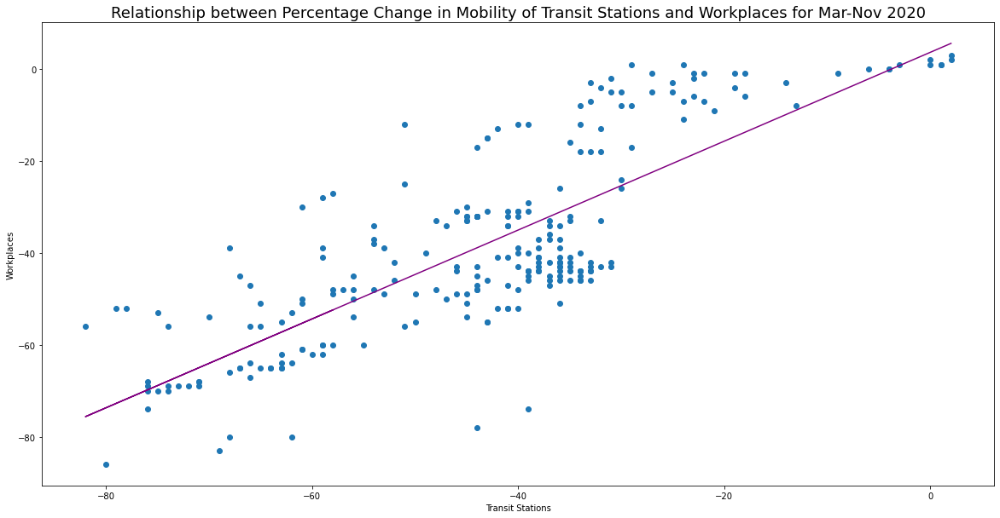

The correlation coefficient is: 0.7986562061504836


In [132]:
#Let's view the relationship between the percentage change in mobility for transit stations and workplaces in Ireland
correlate(ireland['transit_stations_percent_change_from_baseline'], ireland['workplaces_percent_change_from_baseline'], 'Transit Stations', 'Workplaces')

Interestingly, although the correlaiton coefficient of 0.8 is strong, it is not as strong as those of the USA and New Zealand for this particular relationship. This may suggest that not as many Irish citizens use public transport as a means of commuting to work

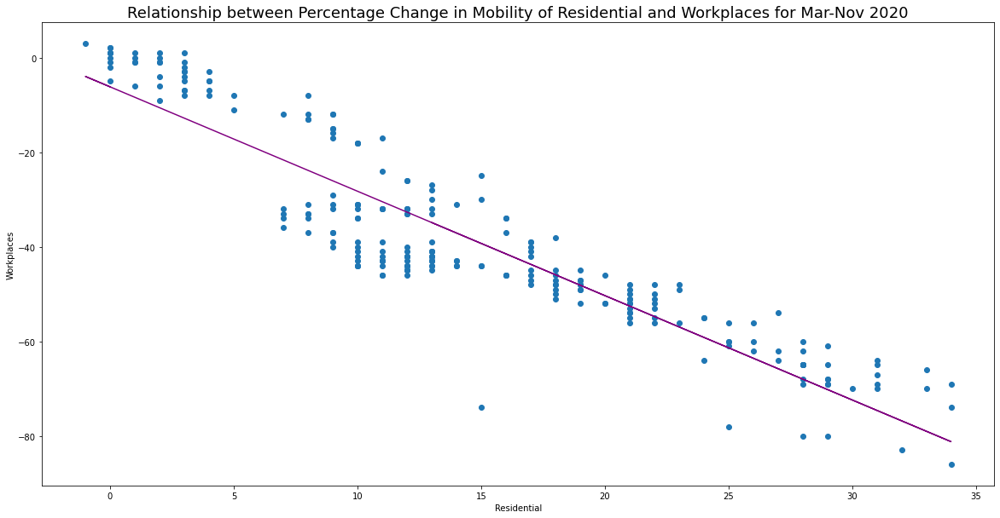

The correlation coefficient is: -0.9177824412061161


In [133]:
#Now let's view the relationship between the percentage change in mobility for residential and workplaces in Ireland
correlate(ireland['residential_percent_change_from_baseline'], ireland['workplaces_percent_change_from_baseline'], 'Residential', 'Workplaces')

Looking at the scatter plot, we can see that there is a very strong relationship between the changes of mobility in residential areas and workplaces. This strong negative correlation of -0.91 implies that as more people decided to stay at home, less people went to work

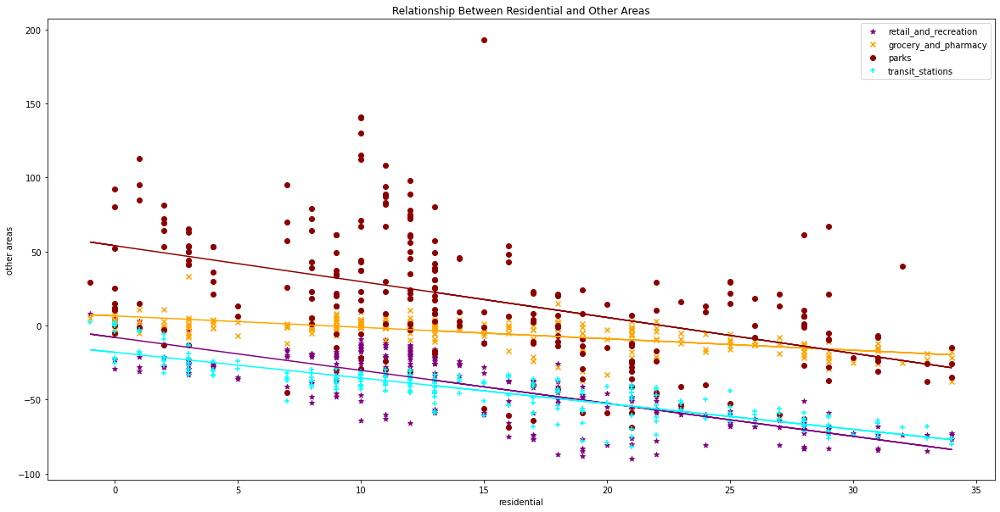

The correlation coefficient between the residential and retail and recreation is: -0.7994229250897272
The correlation coefficient between the residential and grocery and pharmacy is: -0.6636183872085304
The correlation coefficient between the residential and parks is: -0.478383107124181
The correlation coefficient between the residential and transit stations is: -0.873853494544582


In [134]:
#Now let's view the relationship between the percentage change in mobility for residential and the rest of the columns in Ireland

#create the scatter plots for the various areas versus residential
plt.scatter(ireland['residential_percent_change_from_baseline'], ireland['retail_and_recreation_percent_change_from_baseline'], color = 'purple', marker = '*', label = 'retail_and_recreation')
plt.scatter(ireland['residential_percent_change_from_baseline'], ireland['grocery_and_pharmacy_percent_change_from_baseline'], color = 'orange', marker = 'x', label = 'grocery_and_pharmacy')
plt.scatter(ireland['residential_percent_change_from_baseline'], ireland['parks_percent_change_from_baseline'], color = 'darkred', marker = 'o', label = 'parks')
plt.scatter(ireland['residential_percent_change_from_baseline'], ireland['transit_stations_percent_change_from_baseline'], color = 'cyan', marker = '+', label = 'transit_stations')

#create the lines of best fit using the equation of a line (y = mx + c) by finding the slope and the y-intercept using
#the numpy.polyfit() function
m_ret_rec, c_ret_rec = np.polyfit(ireland['residential_percent_change_from_baseline'], ireland['retail_and_recreation_percent_change_from_baseline'], 1)
m_gro_pha, c_gro_pha = np.polyfit(ireland['residential_percent_change_from_baseline'], ireland['grocery_and_pharmacy_percent_change_from_baseline'], 1)
m_park, c_park = np.polyfit(ireland['residential_percent_change_from_baseline'], ireland['parks_percent_change_from_baseline'], 1)
m_trans, c_trans = np.polyfit(ireland['residential_percent_change_from_baseline'], ireland['transit_stations_percent_change_from_baseline'], 1)

#plot the lines of best fit, ensuring the lines are the same colour as the variables they represent for simplicity
plt.plot(ireland['residential_percent_change_from_baseline'], m_ret_rec*ireland['residential_percent_change_from_baseline'] + c_ret_rec, color = 'purple')
plt.plot(ireland['residential_percent_change_from_baseline'], m_gro_pha*ireland['residential_percent_change_from_baseline'] + c_gro_pha, color = 'orange')
plt.plot(ireland['residential_percent_change_from_baseline'], m_park*ireland['residential_percent_change_from_baseline'] + c_park, color = 'darkred')
plt.plot(ireland['residential_percent_change_from_baseline'], m_trans*ireland['residential_percent_change_from_baseline'] + c_trans, color = 'cyan')

plt.xlabel('residential')
plt.ylabel('other areas')

plt.legend()
plt.title('Relationship Between Residential and Other Areas')
plt.show()

#display the correlation coefficients
print('The correlation coefficient between the residential and retail and recreation is: ' +str(ireland['residential_percent_change_from_baseline'].corr(ireland['retail_and_recreation_percent_change_from_baseline'])))
print('The correlation coefficient between the residential and grocery and pharmacy is: ' +str(ireland['residential_percent_change_from_baseline'].corr(ireland['grocery_and_pharmacy_percent_change_from_baseline'])))
print('The correlation coefficient between the residential and parks is: ' +str(ireland['residential_percent_change_from_baseline'].corr(ireland['parks_percent_change_from_baseline'])))
print('The correlation coefficient between the residential and transit stations is: ' +str(ireland['residential_percent_change_from_baseline'].corr(ireland['transit_stations_percent_change_from_baseline'])))


Looking at these scatter plots, we can see that the relationships between the change in mobility of residential areas and both retail and recreation and transit stations areas are strong with a corrleation coefficients of -0.8 and -0.87 respectively. This implies that as more people stayed at home, less people went to retail and recreation areas and transit stations. Meanwhile, the relationship between the change in mobility of residential areas and grocery shops and pharmacies is moderate with a correlation coefficient of -0.66. Then there is a weak correlation between the change in mobility of residential areas and parks with a correlation coefficient of -0.48

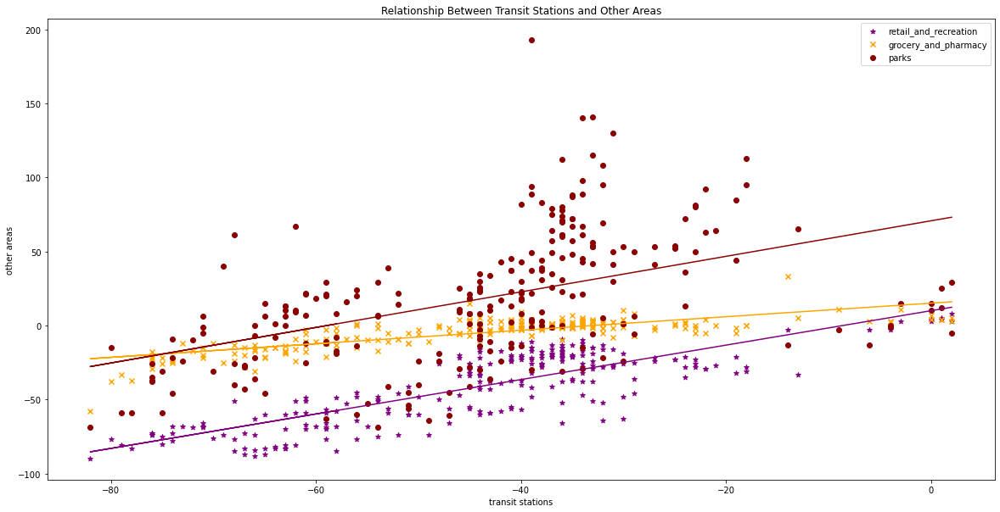

The correlation coefficient between the transit stations and retail and recreation is: 0.8289864577203646
The correlation coefficient between the transit stations and grocery and pharmacy is: 0.7806870629108761
The correlation coefficient between the transit stations and parks is: 0.4705264075813507


In [135]:
#Now let's view the relationship between the percentage change in mobility for transit stations and the rest of the columns in Ireland

#create the scatter plots for the various areas versus residential
plt.scatter(ireland['transit_stations_percent_change_from_baseline'], ireland['retail_and_recreation_percent_change_from_baseline'], color = 'purple', marker = '*', label = 'retail_and_recreation')
plt.scatter(ireland['transit_stations_percent_change_from_baseline'], ireland['grocery_and_pharmacy_percent_change_from_baseline'], color = 'orange', marker = 'x', label = 'grocery_and_pharmacy')
plt.scatter(ireland['transit_stations_percent_change_from_baseline'], ireland['parks_percent_change_from_baseline'], color = 'darkred', marker = 'o', label = 'parks')

#create the lines of best fit using the equation of a line (y = mx + c) by finding the slope and the y-intercept using
#the numpy.polyfit() function
m_ret_rec, c_ret_rec = np.polyfit(ireland['transit_stations_percent_change_from_baseline'], ireland['retail_and_recreation_percent_change_from_baseline'], 1)
m_gro_pha, c_gro_pha = np.polyfit(ireland['transit_stations_percent_change_from_baseline'], ireland['grocery_and_pharmacy_percent_change_from_baseline'], 1)
m_park, c_park = np.polyfit(ireland['transit_stations_percent_change_from_baseline'], ireland['parks_percent_change_from_baseline'], 1)

#plot the lines of best fit, ensuring the lines are the same colour as the variables they represent for simplicity
plt.plot(ireland['transit_stations_percent_change_from_baseline'], m_ret_rec*ireland['transit_stations_percent_change_from_baseline'] + c_ret_rec, color = 'purple')
plt.plot(ireland['transit_stations_percent_change_from_baseline'], m_gro_pha*ireland['transit_stations_percent_change_from_baseline'] + c_gro_pha, color = 'orange')
plt.plot(ireland['transit_stations_percent_change_from_baseline'], m_park*ireland['transit_stations_percent_change_from_baseline'] + c_park, color = 'darkred')

plt.xlabel('transit stations')
plt.ylabel('other areas')

plt.legend()
plt.title('Relationship Between Transit Stations and Other Areas')
plt.show()

#display the correlation coefficients
print('The correlation coefficient between the transit stations and retail and recreation is: ' +str(ireland['transit_stations_percent_change_from_baseline'].corr(ireland['retail_and_recreation_percent_change_from_baseline'])))
print('The correlation coefficient between the transit stations and grocery and pharmacy is: ' +str(ireland['transit_stations_percent_change_from_baseline'].corr(ireland['grocery_and_pharmacy_percent_change_from_baseline'])))
print('The correlation coefficient between the transit stations and parks is: ' +str(ireland['transit_stations_percent_change_from_baseline'].corr(ireland['parks_percent_change_from_baseline'])))

Looking at the scatter plots, we can see that the relationships between the changes of mobility in transit stations and both retail and recreation areas and grocery shops and pharmacies are strong with correlation coefficients of 0.83 and 0.78 respectively. This may imply that a lot of people used public transport to get to these places, or coincidentally, these places may have happened to be very close to the transit staions. Meanwhile the relationship between the changes of mobility in transit stations and parks is weak with a correlation coefficient of just 0.47

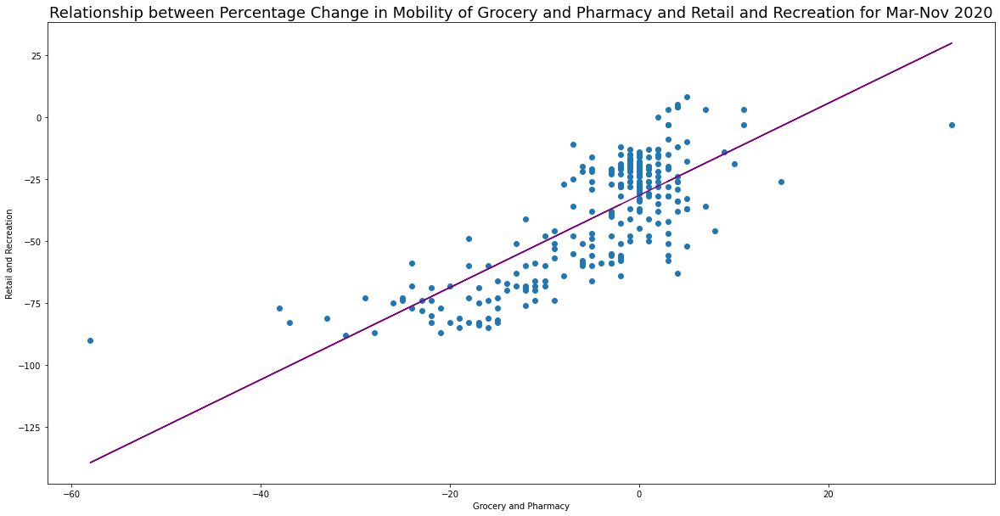

The correlation coefficient is: 0.7759459193842139


In [136]:
#Now let's view the relationship between the percentage change in mobility for grocery and pharmacy and retail and recreation areas in Ireland
correlate(ireland['grocery_and_pharmacy_percent_change_from_baseline'], ireland['retail_and_recreation_percent_change_from_baseline'], 'Grocery and Pharmacy', 'Retail and Recreation')

Here, we see that the relationship between the changes in mobility of grocery shops and pharmacies and retail and recreation is quite strong with a correlation coefficient of 0.78. This may imply that as more people visited grocery shops and pharmacies, they might have also decided to visit retail and recreational areas

# Task 2

### The way in which I approached this task was to construct time series that represented the overall mobility patterns for each country, by taking the averages of the mobility patterns for the public indoor spaces. This meant that I did not include parks and residential areas in this overall data, I did however analyse these columns for the countries seperately

In [137]:
#Create a column that stores the desired averages for each country
usa['average'] = usa[['retail_and_recreation_percent_change_from_baseline', 'grocery_and_pharmacy_percent_change_from_baseline'
                     , 'transit_stations_percent_change_from_baseline', 'workplaces_percent_change_from_baseline']].mean(axis=1)
new_zealand['average'] = new_zealand[['retail_and_recreation_percent_change_from_baseline', 'grocery_and_pharmacy_percent_change_from_baseline'
                     , 'transit_stations_percent_change_from_baseline', 'workplaces_percent_change_from_baseline']].mean(axis=1)
ireland['average'] = ireland[['retail_and_recreation_percent_change_from_baseline', 'grocery_and_pharmacy_percent_change_from_baseline'
                     , 'transit_stations_percent_change_from_baseline', 'workplaces_percent_change_from_baseline']].mean(axis=1)

#usa.head()
#new_zealand.head()
ireland.head()

,id,country,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline,average
date,,,,,,,,,
2020-03-01,1265158,Ireland,3.0,3.0,-5.0,2.0,2.0,0.0,2.50
2020-03-02,1265159,Ireland,4.0,4.0,12.0,1.0,1.0,0.0,2.50
2020-03-03,1265160,Ireland,8.0,5.0,29.0,2.0,3.0,-1.0,4.50
2020-03-04,1265161,Ireland,5.0,4.0,25.0,1.0,1.0,0.0,2.75
2020-03-05,1265162,Ireland,4.0,4.0,15.0,0.0,2.0,0.0,2.50


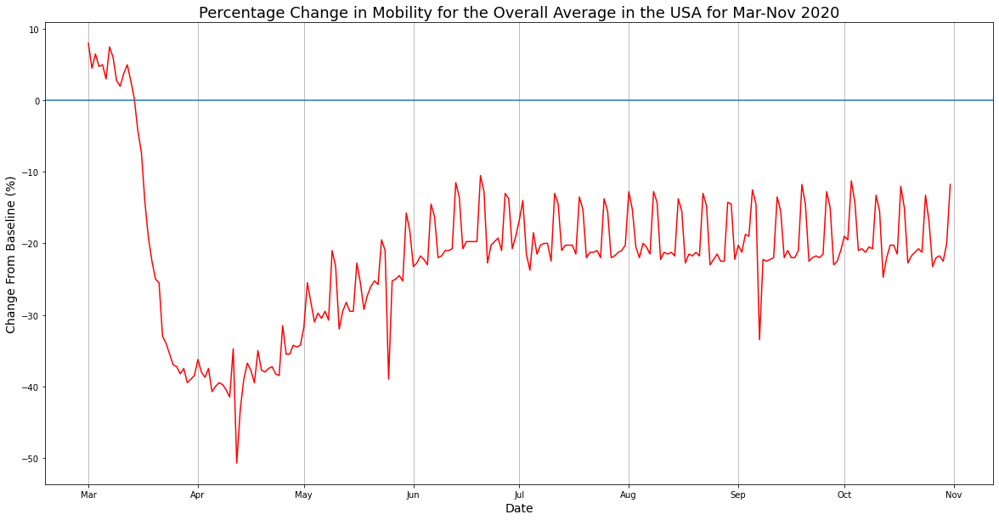

In [138]:
#Let's start off by displaying the overall mobility patterns calculated for the USA
plot_time_series(usa['average'], 'red', month, 'the Overall Average in the USA')

In [139]:
#compute summmary statistics for the series
usa['average'].describe()

count    245.000000
mean     -21.821429
std       10.201530
min      -50.750000
25%      -25.250000
50%      -21.500000
75%      -18.250000
max        8.000000
Name: average, dtype: float64

These summary statistics show that the average change from the baseline throughout the 245 days was approximately -22%, as well as that, the maximum change from the baseline was 8% while the minimum change from the baseline was -50.75%

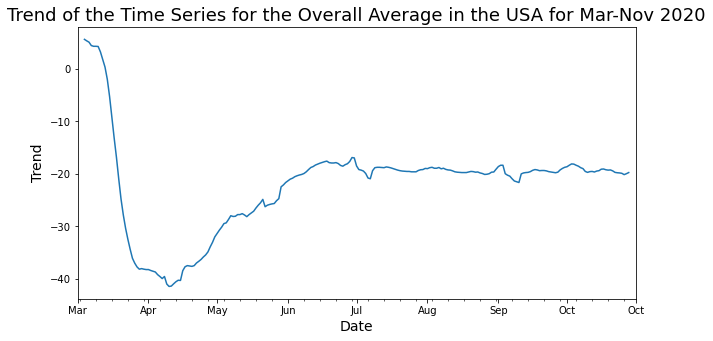

In [140]:
#display the trend of the average column
display_trend(usa['average'], month, 'the Overall Average in the USA')

As the trend shows, there is a sharp descent during the month of March, there is a trough in the month of April but what is also interesting about the month of April is that it is the beginning of an upward trend in the time series. It also appears as though the months of July and September have two distinct turning points

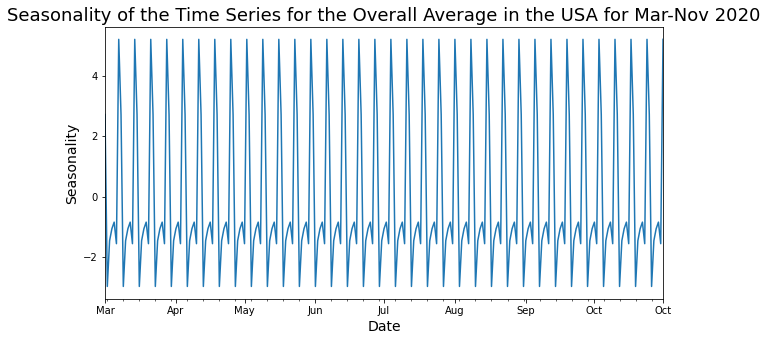

In [141]:
#display the seasonality of the average column
display_seasonal(usa['average'], month, 'the Overall Average in the USA')

Based on the seasonality, the peaks and troughs for this column appear to occur regularly throughout the 8 months. If you look closely, it seems as though the series peak around the middle of each week and trough towards the end

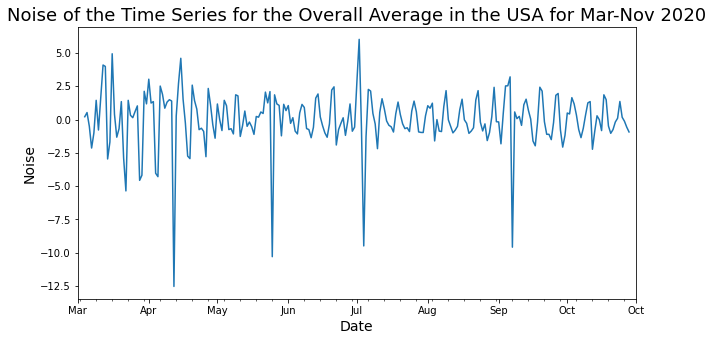

In [142]:
#display the noise of the average column
display_noise(usa['average'], month, 'the Overall Average in the USA')

Looking at the noise for the time series, it appears as though there are four main outliers, in April, May, July and September

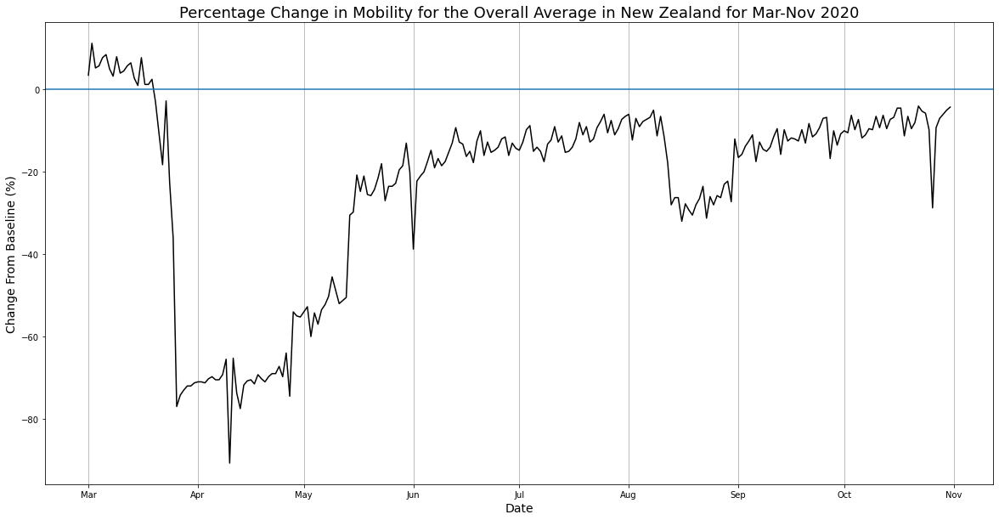

In [143]:
#Let's start off by displaying the overall mobility patterns calculated for New Zealand
plot_time_series(new_zealand['average'], 'black', month, 'the Overall Average in New Zealand')

In [144]:
#compute summmary statistics for the series
new_zealand['average'].describe()

count    245.000000
mean     -23.152041
std       23.035379
min      -90.750000
25%      -27.750000
50%      -14.000000
75%       -9.250000
max       11.250000
Name: average, dtype: float64

These summary statistics show that the average change from the baseline throughout the 245 days was approximately -23%, as well as that, the maximum change from the baseline was 11.25% while the minimum change from the baseline was -90%

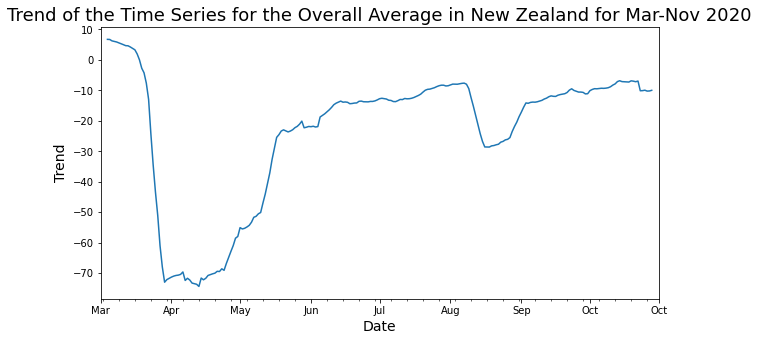

In [145]:
#display the trend of the average column
display_trend(new_zealand['average'], month, 'the Overall Average in New Zealand')

As the trend shows, there is a sharp descent during the month of March, there is a trough in the month of April but what is also interesting about the month of April is that it is the beginning of an upward trend in the time series. You can also see a sharp descent in the month of August

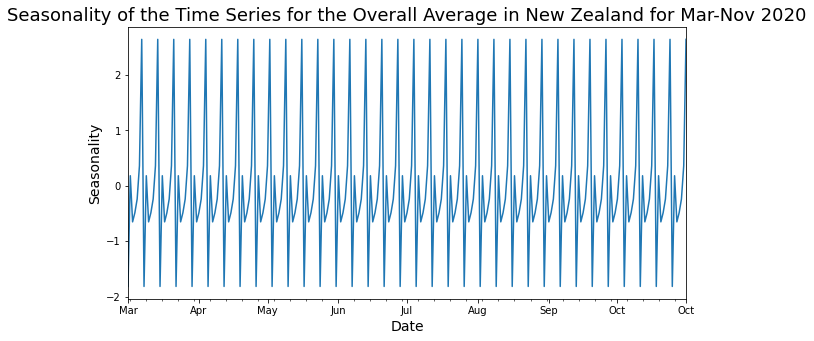

In [146]:
#display the seasonality of the average column
display_seasonal(new_zealand['average'], month, 'the Overall Average in New Zealand')

Based on the seasonality, the peaks and troughs for this column appear to occur regularly throughout the 8 months. If you look closely, it seems as though the series peak around the middle of each week and trough towards the end

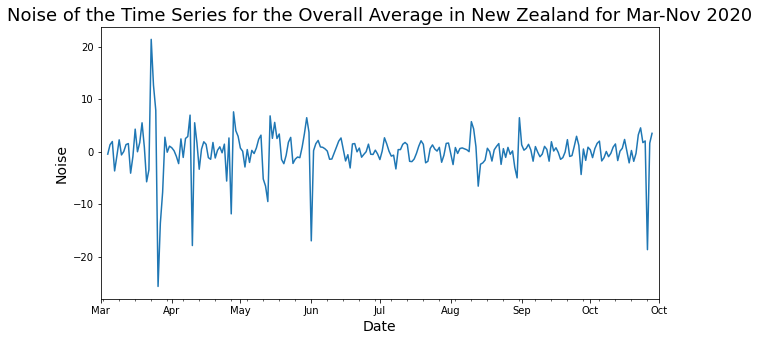

In [147]:
#display the noise of the average column
display_noise(new_zealand['average'], month, 'the Overall Average in New Zealand')

Looking at the noise for the time series, it appears as though there are outliers in March, April, June and October

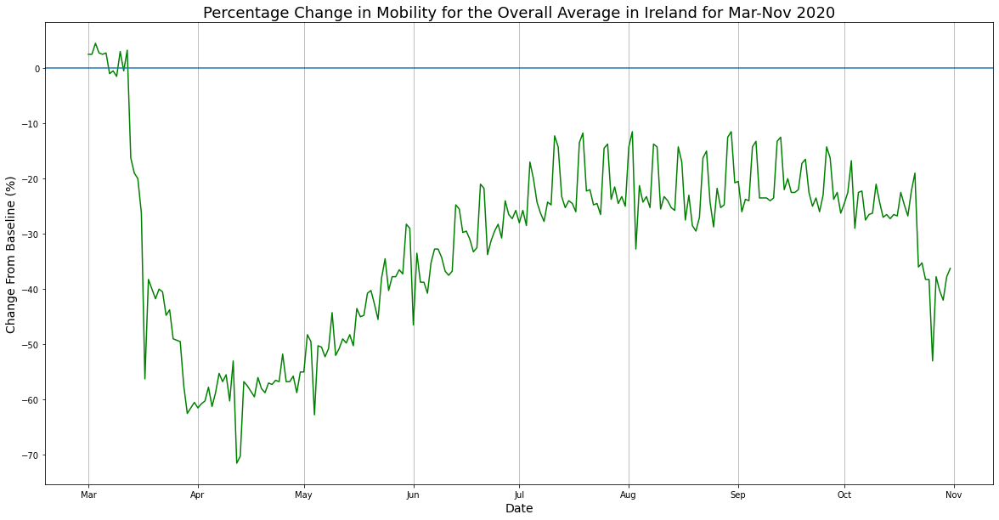

In [148]:
#Let's start off by displaying the overall mobility patterns calculated for Ireland
plot_time_series(ireland['average'], 'green', month, 'the Overall Average in Ireland')

In [149]:
#compute summmary statistics for the series
ireland['average'].describe()

count    245.000000
mean     -31.752041
std       16.075593
min      -71.500000
25%      -42.750000
50%      -26.750000
75%      -22.500000
max        4.500000
Name: average, dtype: float64

These summary statistics show that the average change from the baseline throughout the 245 days was approximately -32%, as well as that, the maximum change from the baseline was 4.5% while the minimum change from the baseline was -71.5%

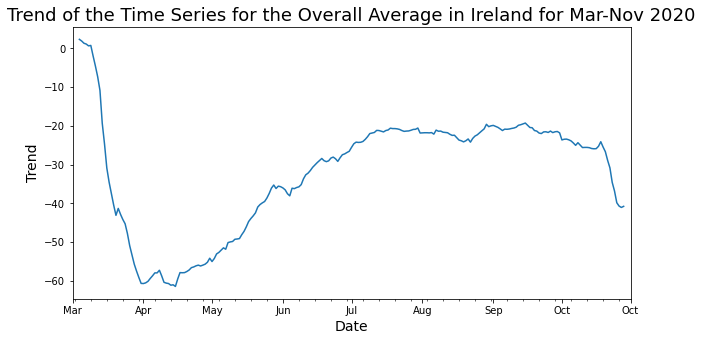

In [150]:
#display the trend of the average column
display_trend(ireland['average'], month, 'the Overall Average in Ireland')

As the trend shows, there is a sharp descent during the month of March, there is a trough in the month of April but what is also interesting about the month of April is that it is the beginning of an upward trend in the time series. You'll also notice a sharp descent in the month of October

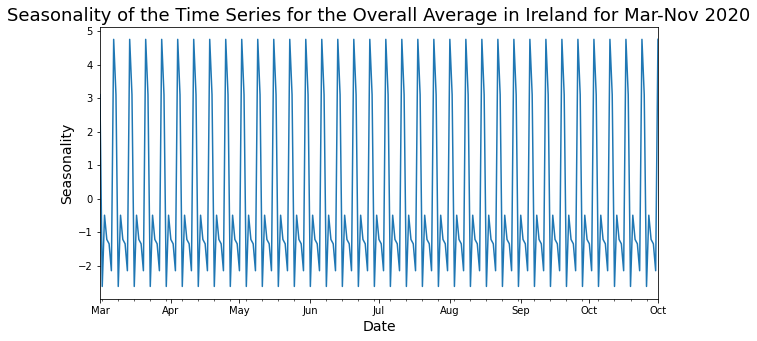

In [151]:
#display the seasonality of the average column
display_seasonal(ireland['average'], month, 'the Overall Average in Ireland')

Based on the seasonality, the peaks and troughs for this column appear to occur regularly throughout the 8 months. If you look closely, it seems as though the series peak around the middle of each week and trough towards the end

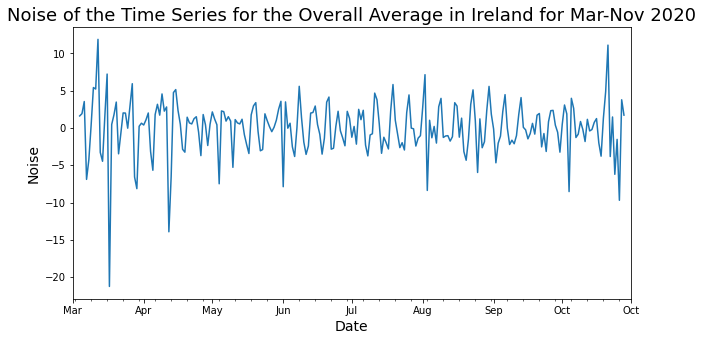

In [152]:
#display the noise of the average column
display_noise(ireland['average'], month, 'the Overall Average in Ireland')

Looking at the noise for the time series, it appears as though there are outliers present in March, April, August and October

In [153]:
#Create a new table to store the averages for each country
frames = [usa.average, new_zealand.average, ireland.average]
overall_time_series = pd.concat(frames, axis = 1, join = 'inner')
overall_time_series.columns = ['usa', 'new_zealand', 'ireland']
overall_time_series.head()

,usa,new_zealand,ireland
date,,,
2020-03-01,8.00,3.50,2.50
2020-03-02,4.50,11.25,2.50
2020-03-03,6.50,5.25,4.50
2020-03-04,4.75,5.75,2.75
2020-03-05,5.00,7.75,2.50


In [154]:
def plot_overall_time_series(time_series, date_form, title):
    #create a figure and plot space
    fig, ax = plt.subplots(figsize=plt.rcParams['figure.figsize'])
    #create the time series
    time_series.plot(ax = ax)
    
    #display either short month, 2-digit day, or short day names only on x-axis and display a grid to make inspection more clear
    ax.xaxis.set_major_formatter(date_form)
    ax.xaxis.grid()
    
    #label the x and y axes
    plt.xlabel('Date', fontsize = 14)
    plt.ylabel('Change From Baseline (%)', fontsize = 14)
    
    #add a title from the given title using formatted string literal syntax 
    if date_form == month:
        string = f"Percentage Change in the Overall Mobility for the USA, New Zealand and Ireland for Mar-Nov 2020"    
    else:
        string = f"Percentage Change in the Overall Mobility for the USA, New Zealand and Ireland for {title}"
        #ensure all days are displayed on x-axis when examining a time series for a given month
        ax.xaxis.set_major_locator(DayLocator())  
    plt.title(string, fontsize = 18)
    
    #add a baseline by plotting a horizontal line from y = 0 (default)
    plt.axhline()

    #display the finished time series
    plt.show()

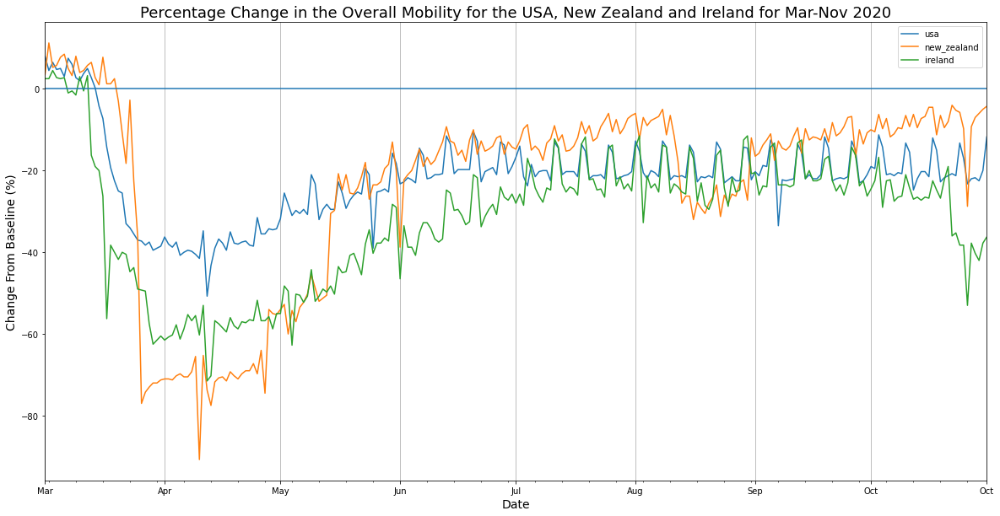

In [155]:
plot_overall_time_series(overall_time_series, month, '')

Having already decomposed all the columns for the overall averages, I found that the months of March, April, August, September and October were quite interesting because in a lot of the columns, these months either contained sharp turning points or significant outliers, so I think these months should be examined more closely

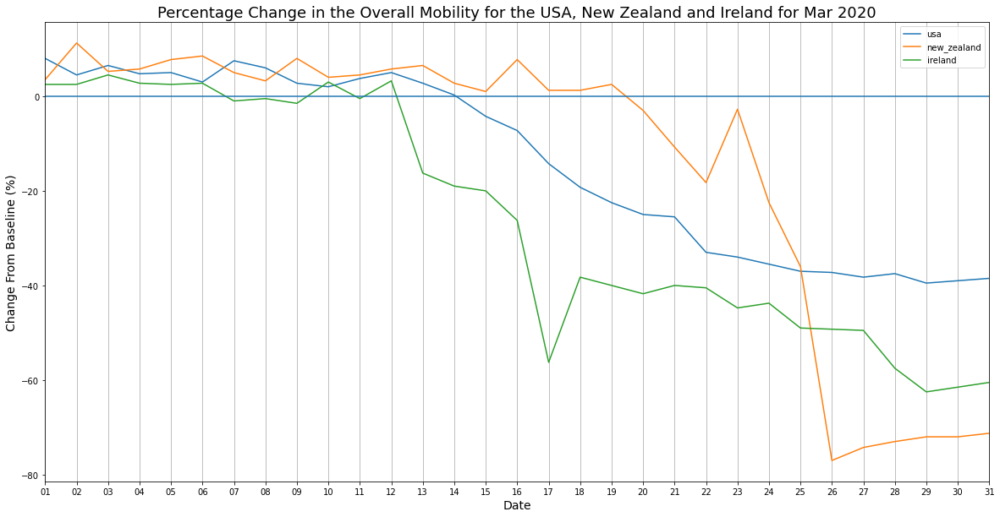

In [156]:
'''
As previously discussed, I thought it would be interesting to look at the month of March
more closely since this was the time at which the time series across all countries began
to descend rapidly
'''
plot_overall_time_series(overall_time_series['2020-03'], day, "Mar 2020")

For the month of March, we can see that Ireland was the only country to experience a drastic descent on March 17th because of St.Patrick's day. We see that the USA begins its descent arount the 11th of March, which was the day on which the WHO announced COVID-19 as a global pandemic. Meanwhile, in New Zealand, its time series experiences a drastic descent on March 23rd, which is interesting because March 23rd was the day on which the prime minister of New Zealand announced that New Zealand had moved to Alert Level 3

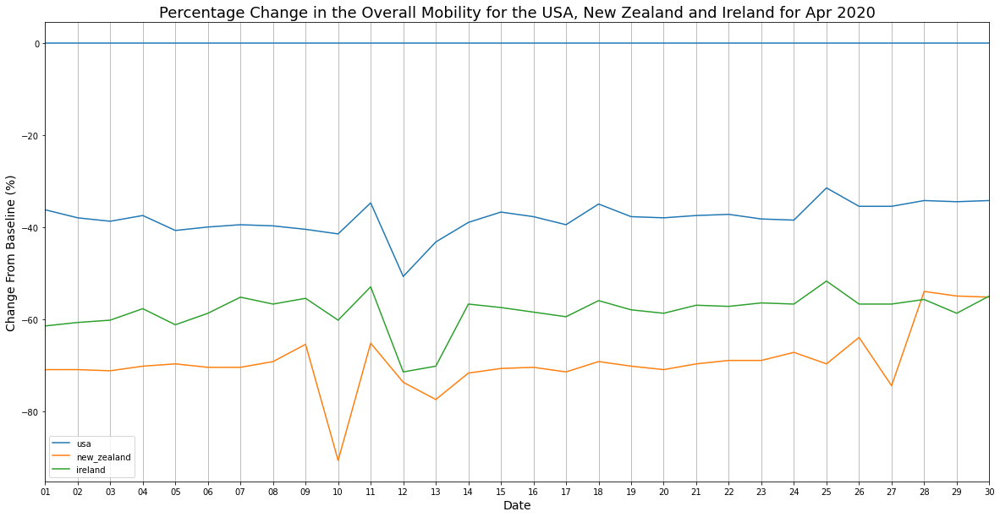

In [157]:
'''
As previously discussed, I thought it would be interesting to look at the month of April
more closely since this was the time at which the time series across all countries began
to ascend having descended from March
'''
plot_overall_time_series(overall_time_series['2020-04'], day, "Apr 2020")

Interestingly, it appears as though all countries underwent a drastic descent between the 10th and 12th of April. It happened to the USA and New Zealand on the 12th and to Ireland on the 10th. This is probably because April 10th and 12th were Good Friday and Easter Sunday respectively. This may be because in a predominantly Catholic country like Ireland, Good Friday is more celebrated than Easter Sunday

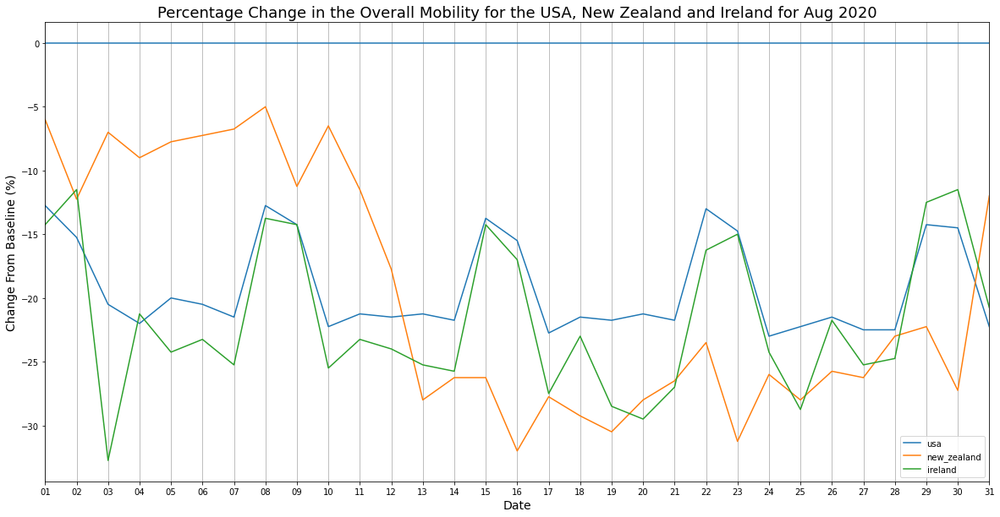

In [158]:
'''
As previously discussed, I thought it would be interesting to look at the month of August
more closely because this month contained a number of significant turning points and outliers
'''
plot_overall_time_series(overall_time_series['2020-08'], day, "Aug 2020")

Looking at the series for the month of August, we can see that the series for the USA rises and falls periodically without experiencing any drastic changes. Meanwhile, in Ireland we can see an uncharacteristic descent for that month on August 3rd, however, we already know that this was a bank holiday. Meanwhile, in New Zealand, we see that its series undergoes a very steep descent on the 13th of March, this is probably related to the fact that on August 12th, Auckland moved to Alert Level 3, while the rest of New Zealand moved to Alert Level 2 having previously been on Level 1

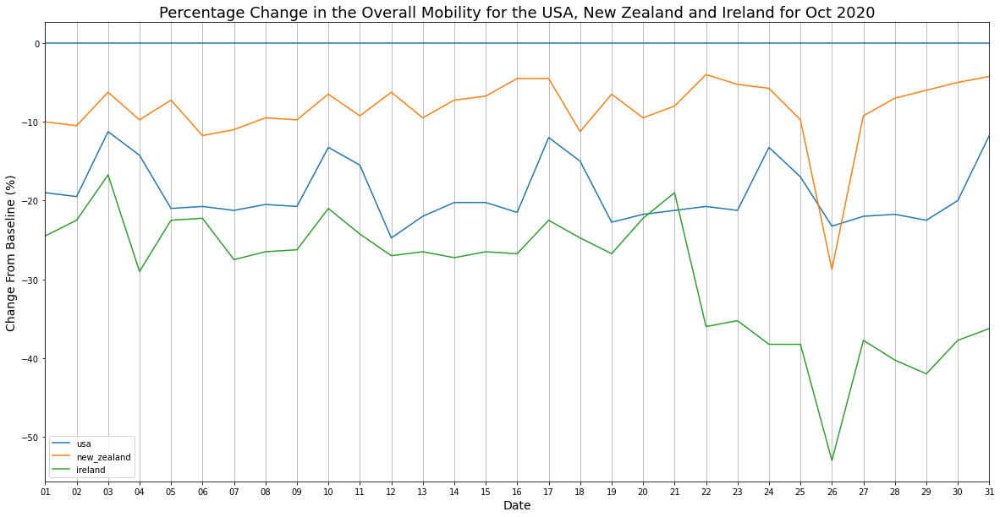

In [159]:
'''
As previously discussed, I thought it would be interesting to look at the month of October
more closely because this month contained a number of significant turning points and outliers
'''
plot_overall_time_series(overall_time_series['2020-10'], day, "Oct 2020")

Here, while we can see that throughout October, the USA does not experience any drastic changes, the same cannot be said for New Zealand and Ireland. Both countries appear to experience rapid and steep descents on the 26th of October. In the case of New Zealand, we had already observed that the 26th of October is the day on which New Zealand celebrates Labour Day as a public holiday, so this affected the mobility changes in workplaces and transit stations across the country. Meanwhile in Ireland, October 26th was a bank holiday

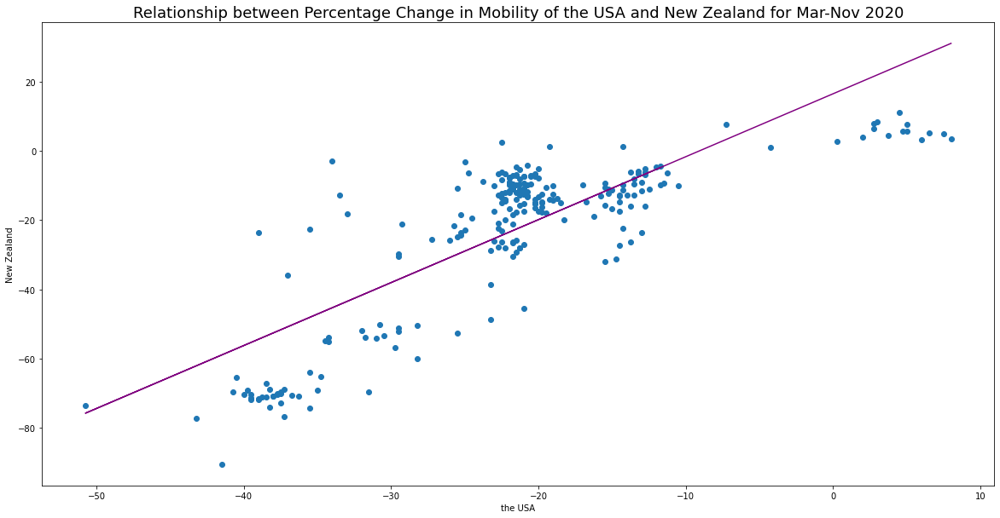

The correlation coefficient is: 0.8077625957166805


In [160]:
#Let's see how the overall changes in mobility for the USA and New Zealand correlate
correlate(overall_time_series['usa'], overall_time_series['new_zealand'], 'the USA', 'New Zealand')

Interestingly, it appears as though the correlation coefficient for the overall mobility patterns for public indoor venues in the USA and New Zealand is quite strong with a correlation coefficient of 0.8. This suggests that both graphs experience similar patterns throughout the eight months

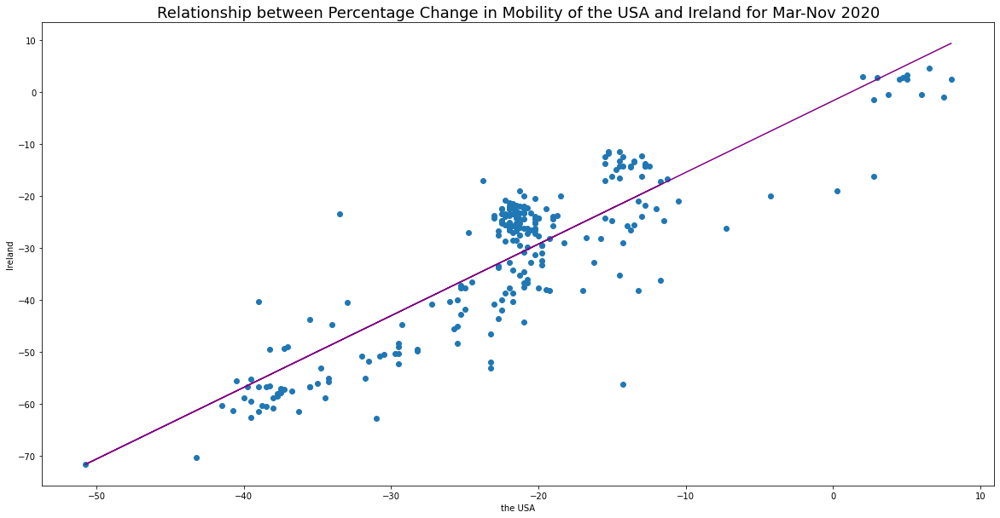

The correlation coefficient is: 0.8740477370383449


In [161]:
#Let's see how the overall changes in mobility for the USA and Ireland correlate
correlate(overall_time_series['usa'], overall_time_series['ireland'], 'the USA', 'Ireland')

As it turns out, the correlation coefficient for the overall mobility patterns for public indoor venues in the USA and Ireland are even more correlated with a correlation coefficient of 0.87. This strong positive correlation coefficient suggests that both graphs deomonstrate similar patterns throughout the 8 months

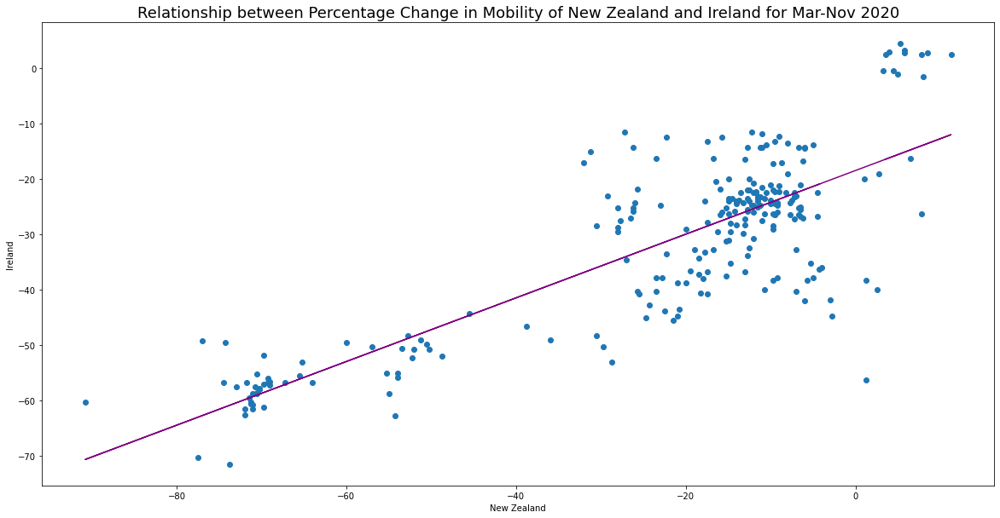

The correlation coefficient is: 0.8235354907791991


In [162]:
#Let's see how the overall changes in mobility for New Zealand and Ireland correlate
correlate(overall_time_series['new_zealand'], overall_time_series['ireland'], 'New Zealand', 'Ireland')

Now we've shown that the correlation coefficient for the overall mobility patterns for public indoor venues in New Zealand and Ireland are strongly correlated. This strong positive correlation coefficient suggests that both graphs demonstrate similar patterns throughout the 8 months

### Observations

So interestingly, the graphs for the USA and Ireland are most similar and the graphs for the USA and New Zealand are least similar. I am surprised that the graphs for New Zealand were not the most similar because they appeared to outliers in common months

In [163]:
#Next, I said I would compare the parks column for each of the countries

#Create a new Data Frame to store the data for the parks of each country
parks_frames = [usa['parks_percent_change_from_baseline'], new_zealand['parks_percent_change_from_baseline'], ireland['parks_percent_change_from_baseline']]
parks_time_series = pd.concat(parks_frames, axis = 1, join = 'inner')
parks_time_series.columns = ['usa', 'new_zealand', 'ireland']
parks_time_series.head()

,usa,new_zealand,ireland
date,,,
2020-03-01,18.0,-1.0,-5.0
2020-03-02,10.0,-10.0,12.0
2020-03-03,20.0,-6.0,29.0
2020-03-04,17.0,-17.0,25.0
2020-03-05,21.0,-15.0,15.0


The data for the parks in each country has already been characterised in Task 1

In [164]:
#Create a function to plot the time series for the percentage change in mobility for parks for the three countries
def plot_park_time_series(time_series, date_form, title):
    #create a figure and plot space
    fig, ax = plt.subplots(figsize=plt.rcParams['figure.figsize'])
    #create the time series
    time_series.plot(ax = ax)
    
    #display either short month, 2-digit day, or short day names only on x-axis and display a grid to make inspection more clear
    ax.xaxis.set_major_formatter(date_form)
    ax.xaxis.grid()
    
    #label the x and y axes
    plt.xlabel('Date', fontsize = 14)
    plt.ylabel('Change From Baseline (%)', fontsize = 14)
    
    #add a title from the given title using formatted string literal syntax 
    if date_form == month:
        string = f"Percentage Change in the Mobility for Parks in the USA, New Zealand and Ireland for Mar-Nov 2020"    
    else:
        string = f"Percentage Change in the Mobility for Parks in the USA, New Zealand and Ireland for {title}"
        #ensure all days are displayed on x-axis when examining a time series for a given month
        ax.xaxis.set_major_locator(DayLocator())  
    plt.title(string, fontsize = 18)
    
    #add a baseline by plotting a horizontal line from y = 0 (default)
    plt.axhline()

    #display the finished time series
    plt.show()

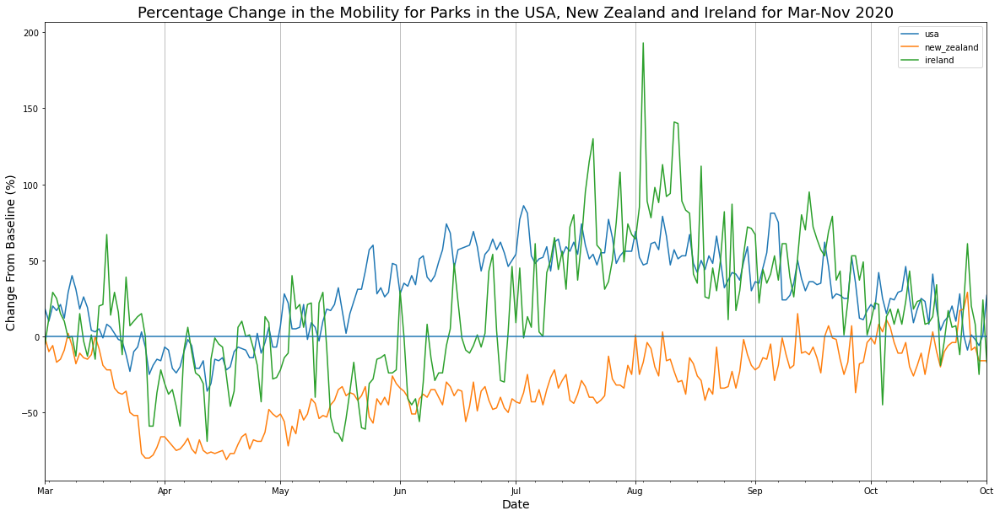

In [165]:
plot_park_time_series(parks_time_series, month, "")

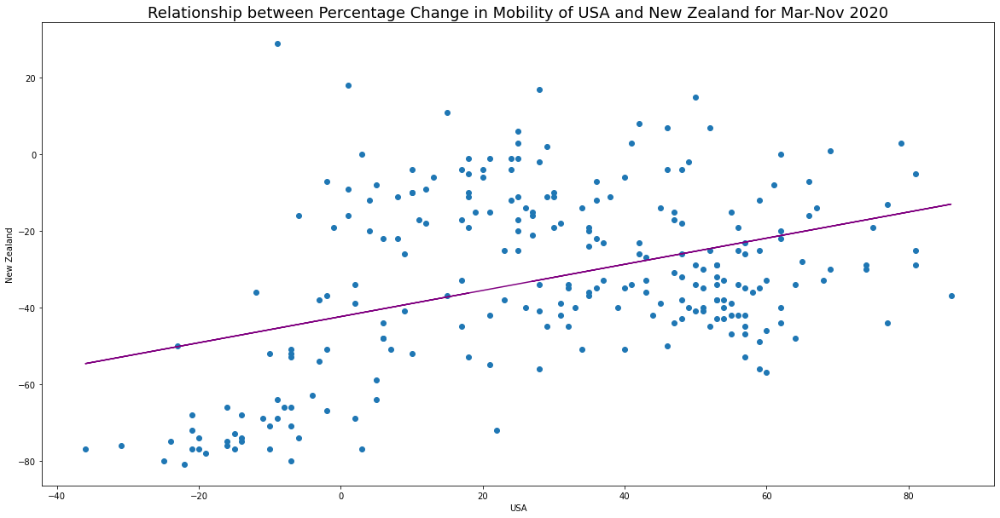

The correlation coefficient is: 0.4016412874626693


In [166]:
#Let's see how the changes in mobility for parks in the USA and New Zealand correlate
correlate(parks_time_series['usa'], parks_time_series['new_zealand'], 'USA', 'New Zealand')

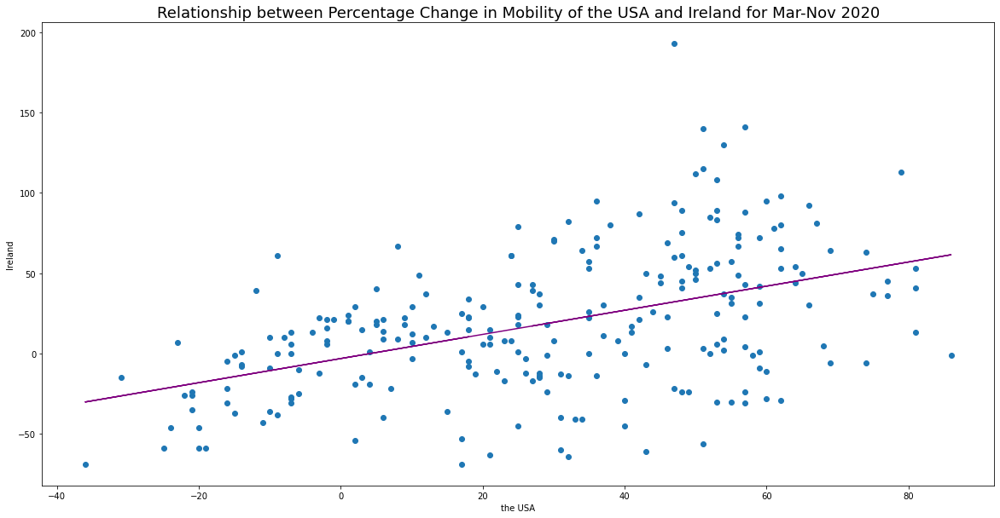

The correlation coefficient is: 0.4688321919776574


In [167]:
#Let's see how the changes in mobility for parks in the USA and Ireland correlate
correlate(parks_time_series['usa'], parks_time_series['ireland'], 'the USA', 'Ireland')

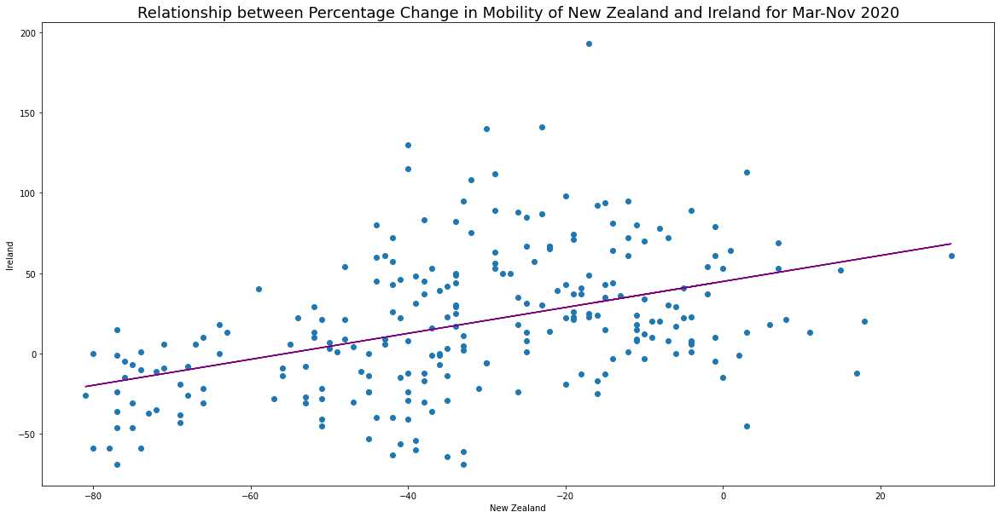

The correlation coefficient is: 0.4286480027388064


In [168]:
#Let's see how the changes in mobility for parks in New Zealand and Ireland correlate
correlate(parks_time_series['new_zealand'], parks_time_series['ireland'], 'New Zealand', 'Ireland')

We can see that all the relationships with regards to parks are quite weak, with the strongest correlation coefficient being 0.47. This suggests that there are few similarities between the graphs with regards to the percentage change in mobility of parks in each country

In [169]:
#Next, I said I would compare the residential column for each of the countries

#Create a new Data Frame to store the data for the parks of each country
residential_frames = [usa['residential_percent_change_from_baseline'], new_zealand['residential_percent_change_from_baseline'], ireland['residential_percent_change_from_baseline']]
residential_time_series = pd.concat(residential_frames, axis = 1, join = 'inner')
residential_time_series.columns = ['usa', 'new_zealand', 'ireland']
residential_time_series.head()

,usa,new_zealand,ireland
date,,,
2020-03-01,-1.0,1.0,0.0
2020-03-02,-1.0,-2.0,0.0
2020-03-03,-1.0,-1.0,-1.0
2020-03-04,-1.0,-1.0,0.0
2020-03-05,-1.0,-1.0,0.0


The data for the residential areas in each country has already been characterised in Task 1

In [170]:
#Create a function to plot the time series for the percentage change in mobility for residential areas for the three countries
def plot_residential_time_series(time_series, date_form, title):
    #create a figure and plot space
    fig, ax = plt.subplots(figsize=plt.rcParams['figure.figsize'])
    #create the time series
    time_series.plot(ax = ax)
    
    #display either short month, 2-digit day, or short day names only on x-axis and display a grid to make inspection more clear
    ax.xaxis.set_major_formatter(date_form)
    ax.xaxis.grid()
    
    #label the x and y axes
    plt.xlabel('Date', fontsize = 14)
    plt.ylabel('Change From Baseline (%)', fontsize = 14)
    
    #add a title from the given title using formatted string literal syntax 
    if date_form == month:
        string = f"Percentage Change in the Mobility for Residential Areas in the USA, New Zealand and Ireland for Mar-Nov 2020"    
    else:
        string = f"Percentage Change in the Mobility for Residential Areas in the USA, New Zealand and Ireland for {title}"
        #ensure all days are displayed on x-axis when examining a time series for a given month
        ax.xaxis.set_major_locator(DayLocator())  
    plt.title(string, fontsize = 18)
    
    #add a baseline by plotting a horizontal line from y = 0 (default)
    plt.axhline()

    #display the finished time series
    plt.show()

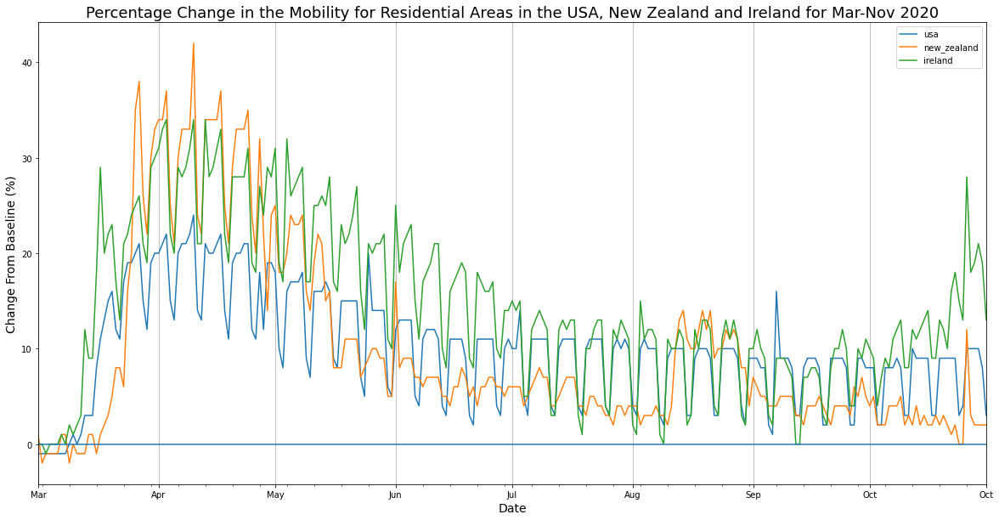

In [171]:
plot_residential_time_series(residential_time_series, month, "")

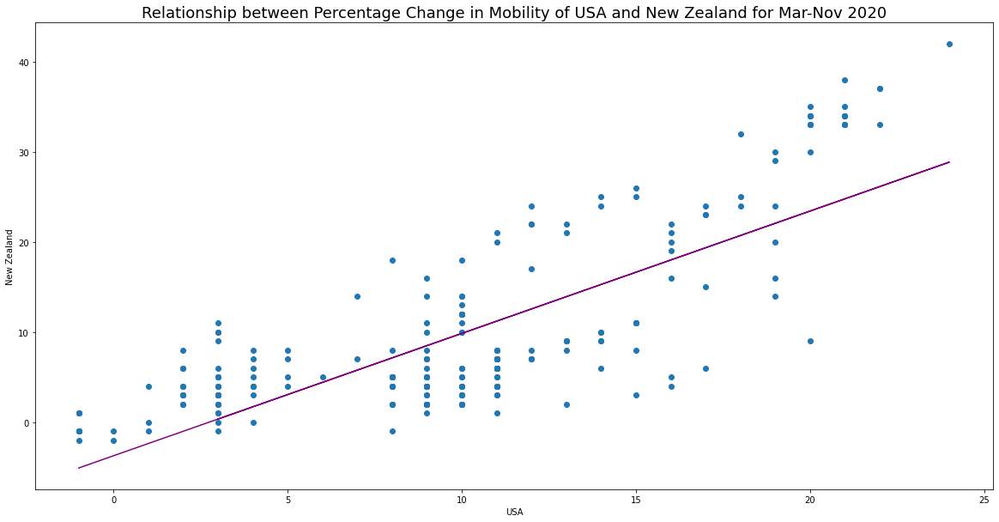

The correlation coefficient is: 0.7797578055148242


In [172]:
#Let's see how the changes in mobility for residential areas in the USA and New Zealand correlate
correlate(residential_time_series['usa'], residential_time_series['new_zealand'], 'USA', 'New Zealand')

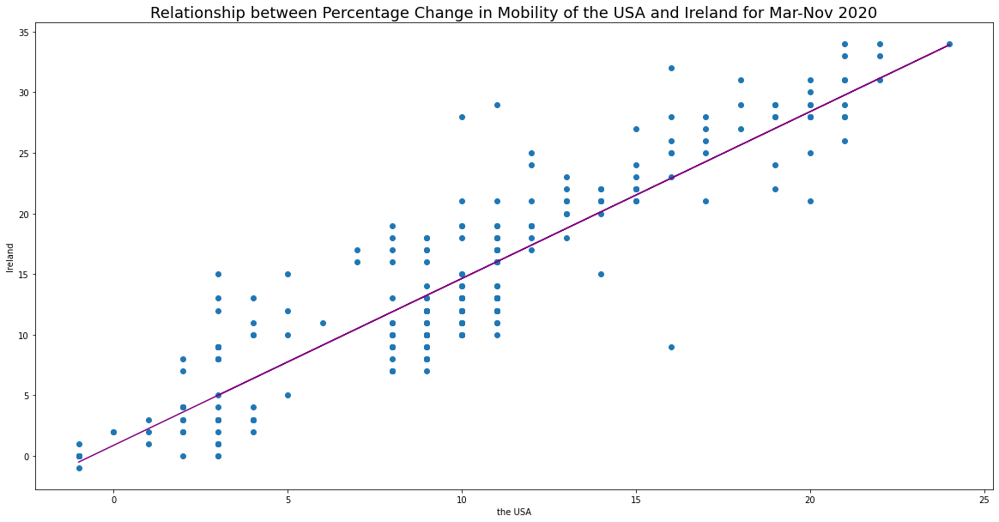

The correlation coefficient is: 0.9067646213803333


In [173]:
#Let's see how the changes in mobility for residential areas in the USA and Ireland correlate
correlate(residential_time_series['usa'], residential_time_series['ireland'], 'the USA', 'Ireland')

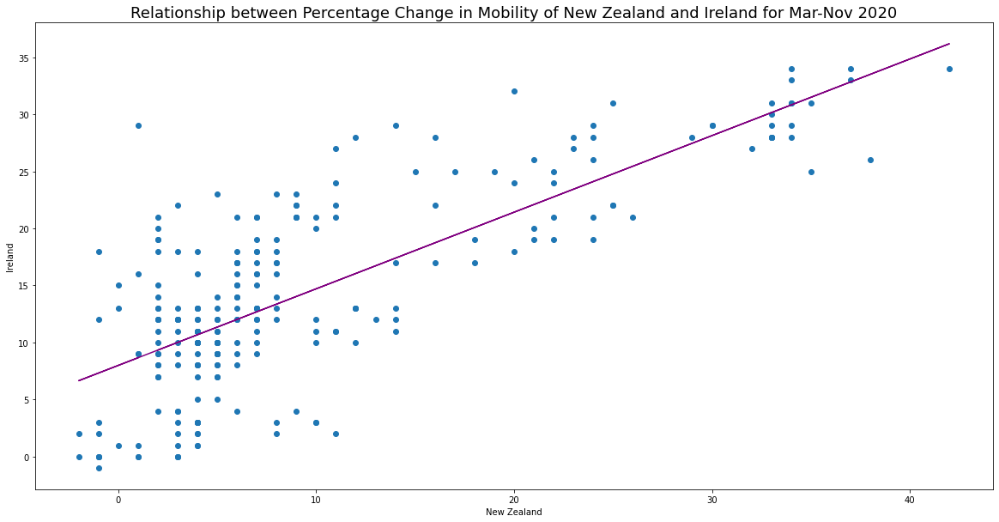

The correlation coefficient is: 0.7696603951676905


In [174]:
#Let's see how the changes in mobility for residential areas in New Zealand and Ireland correlate
correlate(residential_time_series['new_zealand'], residential_time_series['ireland'], 'New Zealand', 'Ireland')

We can see that all the relationships with regards to residential areas are quite strong, with the strongest correlation coefficient being 0.91 (between the USA and Ireland). This suggests that the patterns for the graphs depicting the percentage change in mobility for residential areas in the USA and Ireland share very similar patterns. The patterns for the graphs for the USA and New Zealand and the patterns for the graphs for New Zealand and Ireland on the other hand, while they may be similar in some ways, are not as similar